# PROJET FINAL

## 1.Introduction

Dans ce projet, l’objectif est d’étudier la régulation de la glycémie (le taux de glucose dans le sang) lors d’une prise orale de glucose. Après une prise orale, le glucose est absorbé par l’intestin pour ensuite passer dans le sang. De ce fait, comparée aux modèles développés dans le TD précédent il faut rajouter un compartiment qui est celui de l’intestin. La plupart du temps ce compartiment est relativement facile à modéliser mais pas lorsqu’on s’intéresse à des maladies métaboliques impliquant l’intestin. Le test oral de tolérance au glucose est un test classique effectué pour tester la tolérance de l’organisme au glucose - et donc de détecter des diabètes.  

Dans ce projet, en utilisant ce que vous avez appris - en modélisation mais aussi en informatique - vous allez développer un modèle de prédiction de la glycémie en fonction de la dose de glucose ingérée oralement. Ce projet est en 3 parties :  

— Partie I « simple » qui s’effectuera sur un jeu de données prévu pour la calibration de votre modèle  
— Partie II « avancée » qui développera un modèle plus réaliste  
— Partie III « exploitation » qui va vous permettre de tester l’impact d’une pathologie absorptive  

Toutes les parties sont importantes il ne faut pas sauter les étapes et donc il faut effectuer les parties dans l’ordre. La première partie finalisée est le minimum vital pour avoir l’UE. Les deux autres parties servent à améliorer votre note.


## 2. Calibration du modèle

Vous allez développer un modèle de prise orale de glucose et chercher à obtenir un modèle qui fonctionne avec des paramètres réalistes. Pour cela vous aller utiliser le premier
fichier de données : full_ogtt.txt qui est un tableau dont la première colonne contient les temps de mesures en minutes. Ensuite, chaque colonne est une souris avec la glycémie
obtenu (en mg/dL). Attention : la dernière colonne correspond à la moyenne de toutes les mesures temporelles. Vous noterez que seul le glucose est dosé et donc vous n’avez pas accès à la concentration d’insuline.  

La quantité de glucose orale donnée est une dose poids qui est convertie en mg/dL envoyé à l’intestin. La dose pour le poids de la souris est donc déjà normalisée. Pour cette partie, les expériences ont été effectuées avec G0 = 4500mg/dL pour le bolus envoyé à l’intestin.

En utilisant ce que vous savez :
1. visualiser les données et détecter la phase d’absorption par l’intestin et passage dans le sang suivie de l’effet de l’insuline

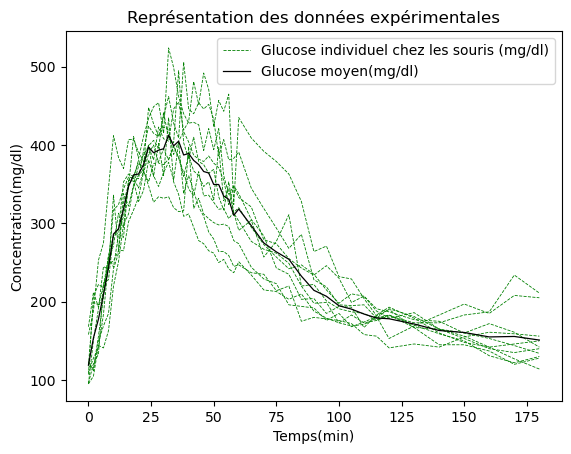

In [237]:
#Imports 

import numpy as np
from scipy.integrate import odeint
from scipy.optimize import fmin
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from scipy.optimize import curve_fit
import pandas as pd

#Chargement des données
data = np.loadtxt("full_ogtt.txt",dtype=float).T
nbs = data.shape[0] - 2

#Plot 
for i in range(1,nbs):
    plt.plot(data[0],data[i],'g--',linewidth=0.6)
plt.plot(data[0],data[nbs],'g--',linewidth=0.6, label="Glucose individuel chez les souris (mg/dl)")
    
plt.plot(data[0],data[nbs+1],'k',linewidth = 0.9,label="Glucose moyen(mg/dl)")

plt.title("Représentation des données expérimentales")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration(mg/dl)')
plt.legend()
plt.savefig("partieA.png")
plt.show()

La phase d'absorption par l'intestin, si on se rapporte à la courbe du glucose moyen, se situe entre le début des données jusqu'au pic de glucose, puis apres le pic survient le "pseudo-pic" d'insuline qui réduit le taux de glucose.

2. en supposant que le bolus de glucose arrive instantanément à t = 0 dans l’intestin,écrire l’équation modélisant le transfert de glucose intestinal (simple) à vitesse constante  

Remarque : il y aura donc un glucose intestinal et un glucose sanguin

Si l'on considère Gi comme glucose intestinal et Gs glucose sanguin sans prendre en compte l'insuline, on obtient comme équation :  
- Gi(t) = - a * Gi(t)
- Gs(t) = a * Gi(t)    

3. réutiliser les équations des modèles des TDs précédents pour les concentrations sanguines (pour l’insuline et le glucose).

In [238]:
data[0]
dta = np.array((data[0],data[nbs+1]))
dta

array([[  0.  ,   2.  ,   4.  ,   6.  ,   8.  ,  10.  ,  12.  ,  14.  ,
         16.  ,  18.  ,  20.  ,  22.  ,  24.  ,  26.  ,  28.  ,  30.  ,
         32.  ,  34.  ,  36.  ,  38.  ,  40.  ,  42.  ,  44.  ,  46.  ,
         48.  ,  50.  ,  52.  ,  54.  ,  56.  ,  58.  ,  60.  ,  65.  ,
         70.  ,  75.  ,  80.  ,  85.  ,  90.  ,  95.  , 100.  , 105.  ,
        110.  , 115.  , 120.  , 130.  , 140.  , 150.  , 160.  , 170.  ,
        180.  ],
       [119.  , 153.8 , 177.9 , 209.2 , 243.  , 286.4 , 293.1 , 318.1 ,
        347.1 , 361.95, 363.  , 375.1 , 397.4 , 390.2 , 393.4 , 395.25,
        412.8 , 398.9 , 404.9 , 387.3 , 389.2 , 380.4 , 375.1 , 366.2 ,
        364.3 , 349.7 , 349.6 , 334.8 , 330.7 , 310.3 , 318.3 , 297.1 ,
        275.  , 263.6 , 254.2 , 232.6 , 214.5 , 206.9 , 194.8 , 190.5 ,
        184.2 , 179.2 , 178.2 , 171.5 , 163.2 , 160.7 , 155.  , 155.6 ,
        151.  ]])

Les équations pour les concentrations sanguines uniquement de glucose et insuline sont :  
- Gs(t) = - b * I(t) * Gs(t) - c * max(0,Gs(t)-Gb)
- I(t) = d * (Gs(t) ** n)- e * I

4. écrire le système d’équations différentielles ; combien a-t-on de paramètres libres ?

In [239]:
#Modèle 
G0 = 4500
y0 = [G0, 119,11]
t = data[0]

def in_model(y,t,a,b,c,d,e):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    dgidt = -a*Gi
    dgsdt = a*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt


In [240]:
# a Sortie du glucose intestinal vers le sang  considéree comme constant =
# b taux de régulation glucose-insuline = sensiblbité insuline (ml µU\-1 d\-1)
# c redirection glucose basal = stockage de glucose, production nette si glucose nulle
# d présence de glucose = 
# e diminution du taux d'insuline = constante de clairance qui comprend prise insuline au foie, rein et receptoeus (d-1)

In [241]:
#10 - 50 microu/ml insuline en ogtt
#80 glucose transfert
#b= 2.5
# e = 0.2-0.6

Les paramètres libres sont : a,b,c,d,e,n.

5. essayer d’obtenir d’une courbe typique, il faudra utiliser la valeur de G0 , et les mesures pour le choix de conditions initiales.

In [242]:
#Paramètres
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.0065
b= 1e-4
c= 0.05
d= 2
e= 5
#n=2

#Paramètres docs
#90% d'abs par intestin
# 20% d'abs par le sang 
"""
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 8e-3
b= 8e-11
c= 0.10
d= 2
e= 5


a = 8e-3
U0 = 1e-2
k = 1e-2
b= 8e-11
c= 0.10
d= 1.5
e= 5.1



a = 7e-3
b= 1e-5
c= 5e-3
d= 2
e= 1

b= 1e-6
c= 0.05
d= 1
e= 3.5


"""
a = 8e-3
b= 8e-11
c= 0.10
d= 1.7
e= 4



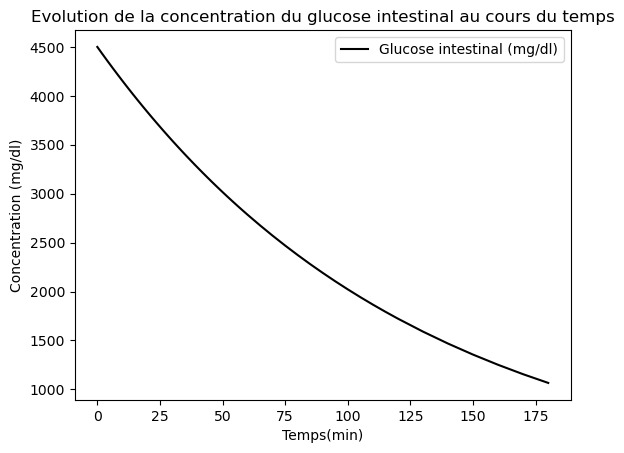

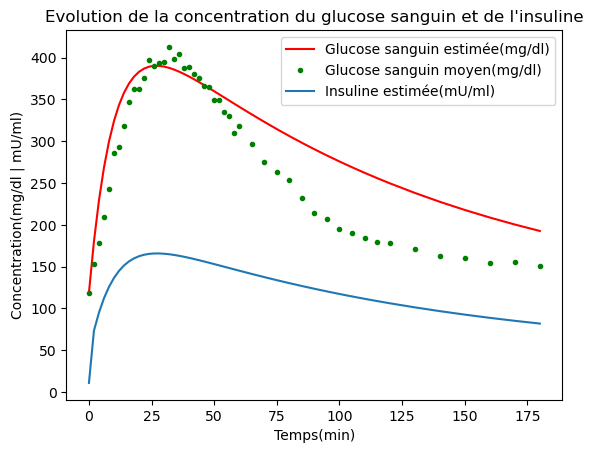

In [243]:

P = odeint(in_model,y0,t,args=(a,b,c,d,e)).T

plt.plot(t,P[0],'k',label="Glucose intestinal (mg/dl)")
plt.title("Evolution de la concentration du glucose intestinal au cours du temps")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration (mg/dl)')
plt.legend()
plt.savefig("gi1.png")
plt.show()

plt.plot(t,P[1],'r',label="Glucose sanguin estimée(mg/dl)")
plt.plot(data[0],data[nbs+1],'g.',label="Glucose sanguin moyen(mg/dl)")
plt.plot(t,P[2],label="Insuline estimée(mU/ml)")
plt.title("Evolution de la concentration du glucose sanguin et de l'insuline")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration(mg/dl | mU/ml)')
plt.legend()

plt.savefig("gi2.png")


plt.show()

6. en minimisant une distance, trouver un jeu de paramètres qui permet de reproduire les données pour chaque souris : présenter et commenter vos résultats.

In [244]:
#Fonction de distance

def distance_n(param,obs,t,y0):
    a,b,c,d,e= param
    P = odeint(in_model,y0,t,args=(a,b,c,d,e,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(a<0) + 1e8*(b<0) +1e8*(c<0)+1e8*(d<0) + 1e8*(e<0)



In [245]:
#Paramètres
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]

#n = 2.17


Optimization terminated successfully.
         Current function value: 60569.444232
         Iterations: 87
         Function evaluations: 160
[9.42815522e-03 7.21770296e-11 1.24648461e-01 1.75542981e+00
 3.20012128e+00]


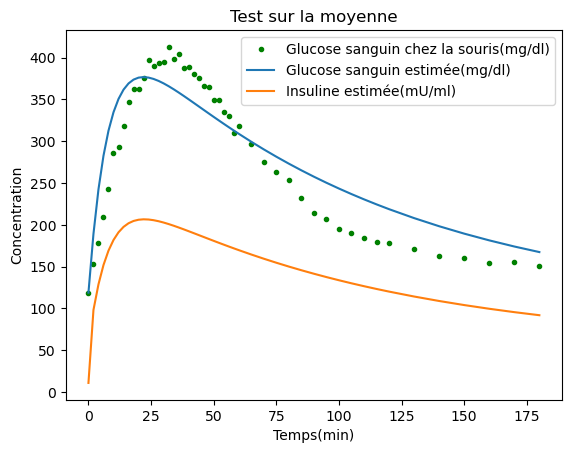

In [246]:
#Test sur moyenne
#Paramètres
param_n = [a,b,c,d,e]

#estimation 1 des paramètres
#P = odeint(in_model,y0,t,args=(a,b,c,d,e)).T

p= fmin(distance_n,param_n,args=(data[11],t,y0))

print(p)

PestimM = odeint(in_model,y0,t,args=(p[0],p[1],p[2],p[3],p[4])).T

plt.plot(t,data[11],'g.',label="Glucose sanguin chez la souris(mg/dl)")
plt.plot(t,PestimM[1],label="Glucose sanguin estimée(mg/dl)")
#plt.plot(t,P[2],label="Insuline mg/dl)")
plt.plot(t,PestimM[2],label="Insuline estimée(mU/ml)")


plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Test sur la moyenne")
plt.legend()
plt.show()

for i in range(5):
    arr[10,i] = p[i]

In [247]:
a2 = 1e-2
b2 = 3e-4
c2 = 9e-2
d2 = 1.1
e2 = 3.7

Optimization terminated successfully.
         Current function value: 67524.929461
         Iterations: 115
         Function evaluations: 219
[9.97248702e-03 6.58610665e-11 1.32175230e-01 1.59830088e+00
 3.97458748e+00]


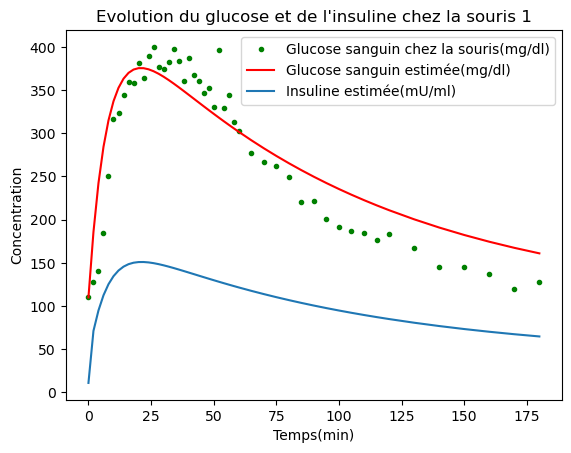

Optimization terminated successfully.
         Current function value: 107823.298497
         Iterations: 97
         Function evaluations: 210
Optimization terminated successfully.
         Current function value: 107823.298468
         Iterations: 57
         Function evaluations: 176
[8.48286102e-03 7.64769845e-11 1.11143658e-01 1.77165516e+00
 3.61540923e+00]


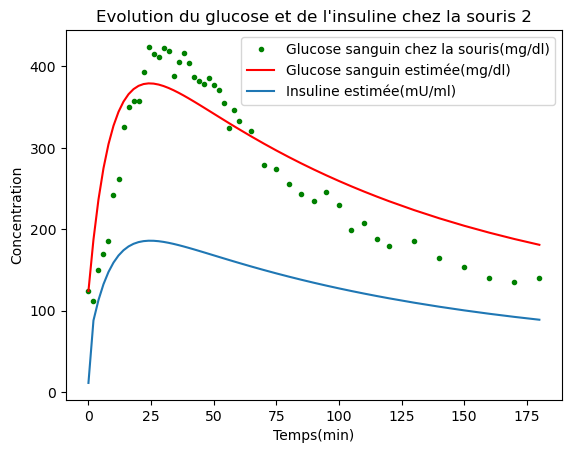

Optimization terminated successfully.
         Current function value: 189633.270927
         Iterations: 215
         Function evaluations: 531
[7.89458543e-03 8.72055032e-11 9.04884082e-02 1.75442030e+00
 4.00899812e+00]


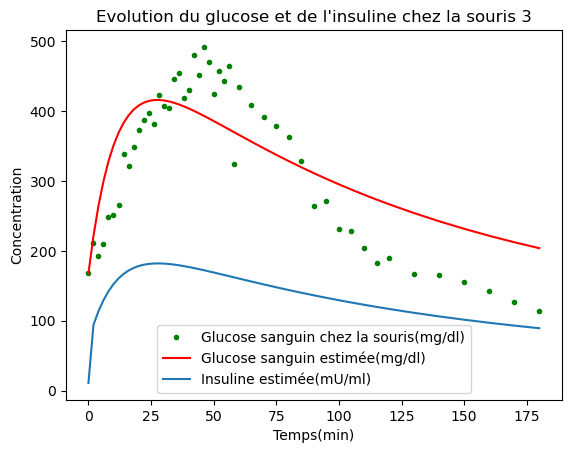

[1.02889171e-02 7.92842430e-11 1.16429847e-01 1.38493169e+00
 3.46241737e+00]


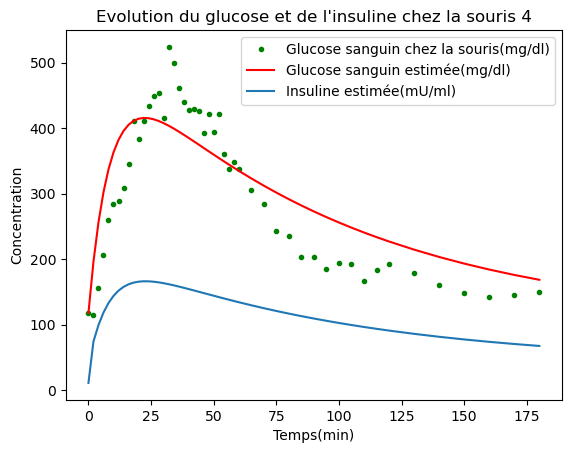

Optimization terminated successfully.
         Current function value: 63588.244506
         Iterations: 105
         Function evaluations: 186
Optimization terminated successfully.
         Current function value: 63588.237254
         Iterations: 122
         Function evaluations: 265
[1.06708082e-02 5.89703773e-11 1.63944441e-01 1.59848734e+00
 3.35691924e+00]


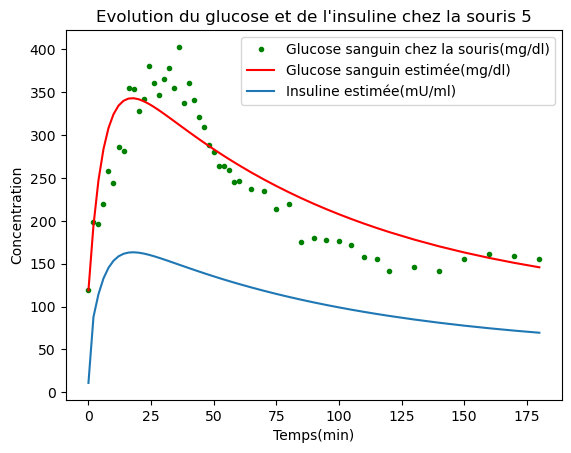

Optimization terminated successfully.
         Current function value: 156592.811612
         Iterations: 97
         Function evaluations: 173
Optimization terminated successfully.
         Current function value: 156592.777690
         Iterations: 77
         Function evaluations: 183
[8.70886588e-03 9.05372311e-11 1.17836422e-01 1.44463866e+00
 3.76888757e+00]


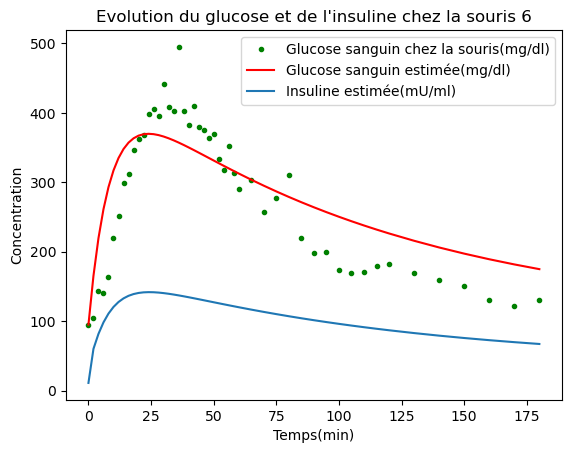

[9.45646137e-03 8.26929480e-11 1.05052423e-01 1.53267969e+00
 3.27647813e+00]


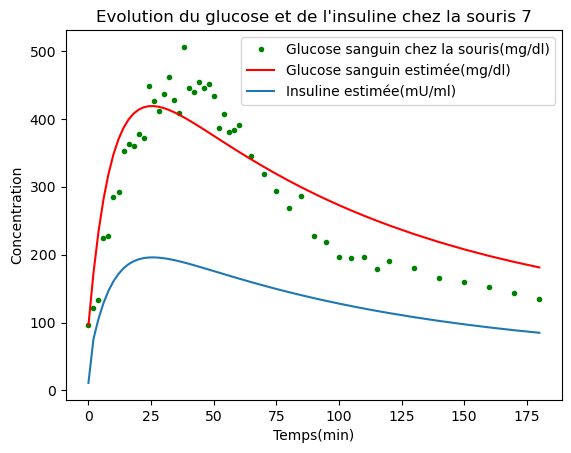

Optimization terminated successfully.
         Current function value: 56275.833341
         Iterations: 110
         Function evaluations: 194
Optimization terminated successfully.
         Current function value: 56275.828084
         Iterations: 165
         Function evaluations: 296
[1.36006227e-02 1.34400038e-10 1.77613148e-01 7.32608676e-01
 2.60863236e+00]


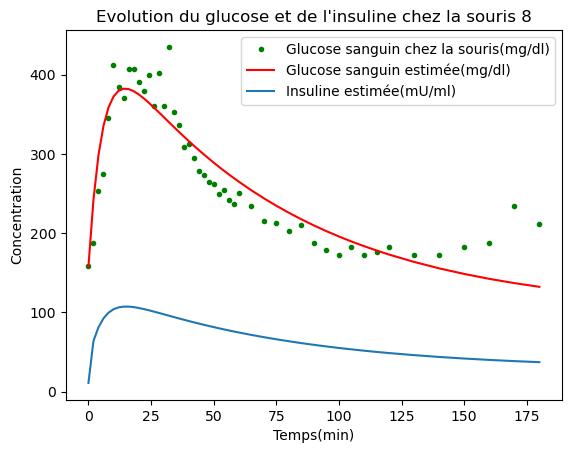

Optimization terminated successfully.
         Current function value: 40243.003603
         Iterations: 115
         Function evaluations: 225
Optimization terminated successfully.
         Current function value: 40243.000179
         Iterations: 71
         Function evaluations: 168
[8.82500029e-03 6.27857815e-11 1.26681347e-01 1.79756477e+00
 3.81096663e+00]


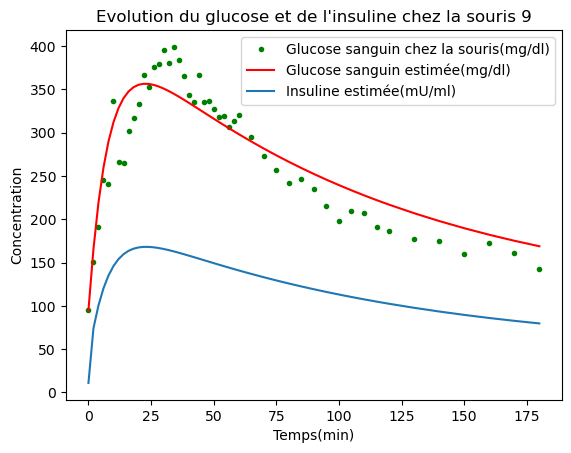

Optimization terminated successfully.
         Current function value: 42739.746416
         Iterations: 98
         Function evaluations: 178
Optimization terminated successfully.
         Current function value: 42739.740997
         Iterations: 75
         Function evaluations: 176
[9.69664623e-03 5.26600251e-11 1.51416259e-01 1.81392688e+00
 3.63602361e+00]


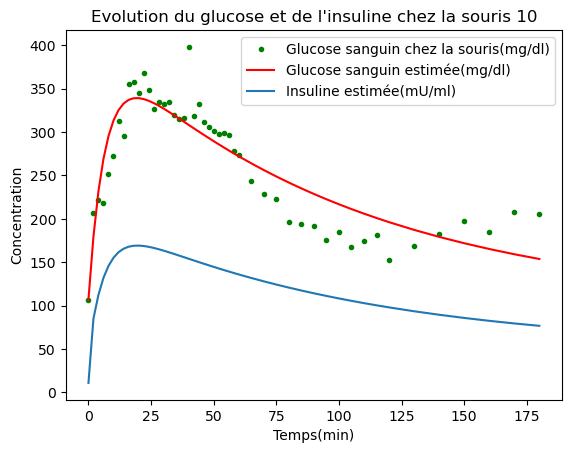

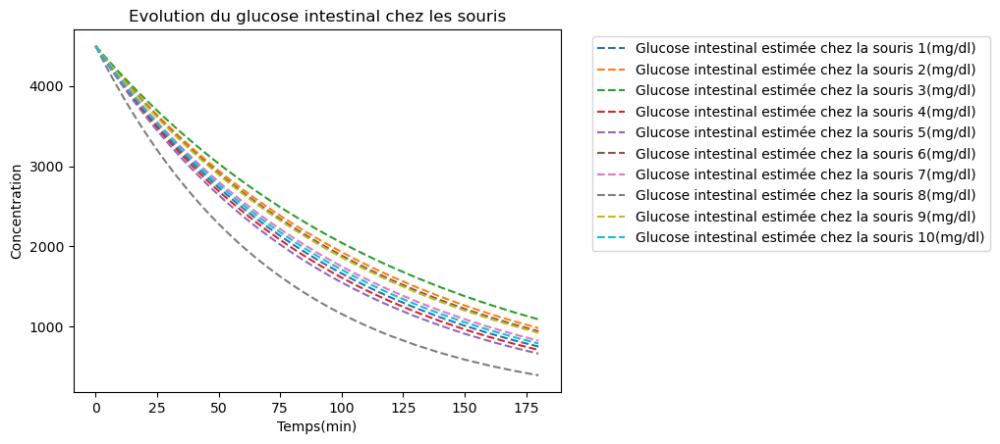

In [251]:
a = 8e-3
b= 8e-11
c= 0.10
d= 1.7
e= 4

p = [a,b,c,d,e]

pes0 = []

arr = np.zeros((13,5))
#p= [a2,b2,c2,d2,e2]
#estimation des paramètres puis affichage
for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p1 = fmin(distance_n,param_n,args=(data[i],t,y0))
    p = fmin(distance_n,p1,args=(data[i],t,y0))
    print(p)
    arr[i-1] = p
    #P = odeint(in_model,y0,t,args=(a,b,c,d,e)).T
    Pestim = odeint(in_model,y0,t,args=(p[0],p[1],p[2],p[3],p[4])).T


    plt.plot(t,data[i],'g.',label="Glucose sanguin chez la souris(mg/dl)")
    plt.plot(t,Pestim[1],'r',label="Glucose sanguin estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mU/ml)")

    pes0.append(Pestim[0])
    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Evolution du glucose et de l'insuline chez la souris "+str(i))
    plt.legend()
    plt.savefig("souris"+str(i)+".png")
    plt.show()

for i in range(10):
    plt.plot(t,pes0[i],'--',label="Glucose intestinal estimée chez la souris "+str(i+1)+"(mg/dl)")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose intestinal chez les souris")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.savefig("initintest"+str(i)+".png")
plt.show()

In [252]:
arrm = np.zeros((5))
art = arr.T

for i in range(5):
    arr[11,i] = art[i].mean()
    arr[12,i] = art[i].std()

In [253]:
arrm = np.zeros((5))
art = arr.T

for i in range(5):
    arr[11,i] = art[i].mean()
    arr[12,i] = art[i].std()
index1 = ["a","b","c","d","e"]
index2 = ["souris 1","souris 2","souris 3","souris 4","souris 5","souris 6","souris 7","souris 8","souris 9","souris 10","souris moyenne","moyenne","écart-type"]
df = pd.DataFrame(arr, index = index2,columns = index1)

df

,a,b,c,d,e
souris 1,0.009972,6.586107e-11,0.132175,1.598301,3.974587
souris 2,0.008483,7.647698e-11,0.111144,1.771655,3.615409
souris 3,0.007895,8.720550e-11,0.090488,1.754420,4.008998
souris 4,0.010289,7.928424e-11,0.116430,1.384932,3.462417
souris 5,0.010671,5.897038e-11,0.163944,1.598487,3.356919
souris 6,0.008709,9.053723e-11,0.117836,1.444639,3.768888
souris 7,0.009456,8.269295e-11,0.105052,1.532680,3.276478
souris 8,0.013601,1.344000e-10,0.177613,0.732609,2.608632
souris 9,0.008825,6.278578e-11,0.126681,1.797565,3.810967
souris 10,0.009697,5.266003e-11,0.151416,1.813927,3.636024


## 3. Modèle avancé

Normalement le modèle à compartiments simples a du mal à fonctionner : est-ce le cas chez vous ? Le modèle précédent suppose une absorption constante et donc un nombre constant de transporteurs du glucose dans l’intestin. Mais le bolus de glucose chemine le long de l’axe intestinal au cours du temps et la densité de transporteurs va diminuer : l’absorption au cours du temps devrait donc diminuer.  

Nous allons introduire une modification au modèle pour prendre en compte ce processus :  

— soit U la vitesse absorption : le glucose intestinal va quitter le compartiment intestinal à la vitesse U ∗ Gi ou Gi désigne le glucose intestinal  

— Nous supposerons que la quantité de transporteurs diminue exponentiellement. Si lebolus parcours l’axe gastrointestinal à vitesse constante alors la vitesse de transport dans le sang va diminuer également de façon exponentielle : dU/dt = −kU.  

— La vitesse d’absorption à la sortie de l’estomac et l’entrée de l’intestin est inconnue (donc à déterminer), elle correspond à la vitesse initiale U0.  


1. Adapter vos équations avec ces nouvelles informations.

In [254]:
def av_model(y,t,U0,k,b,c,d,e):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

2. Relancer la recherche de paramètres par minimisation sur le même jeu de données full_ogtt.txt (attention il n’y a pas forcément le même nombre de paramètres que dans la Partie I)

In [255]:
#Paramètres
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.0009
U0 = 1e-2
k = 1e-2
b= 8e-11
c= 0.12
d= 1.5
e= 5.1

b= 8e-11
c= 0.10
d= 1.7
e= 4



#Fonction de distance

def distance_av(param,obs,t,y0):
    U0,k,b,c,d,e= param
    P = odeint(av_model,y0,t,args=(U0,k,b,c,d,e,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0)+ 1e8*(k<0) + 1e8*(b<0) +1e8*(c<0)+1e8*(d<0) + 1e8*(e<0)



Optimization terminated successfully.
         Current function value: 8723.641922
         Iterations: 165
         Function evaluations: 304
[5.85610292e-03 2.02274800e-02 8.95193134e-11 4.34208303e-02
 1.36371195e+00 1.10679880e+00]


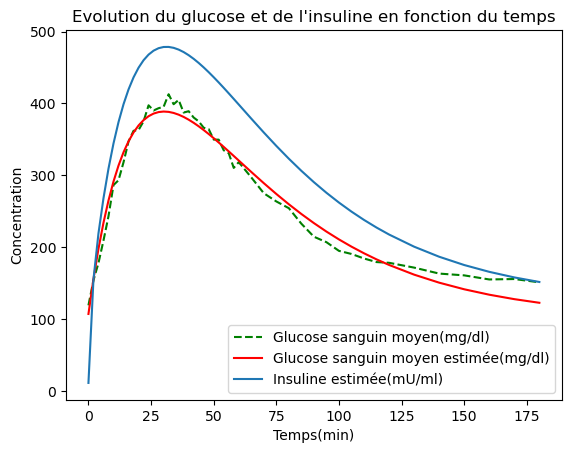

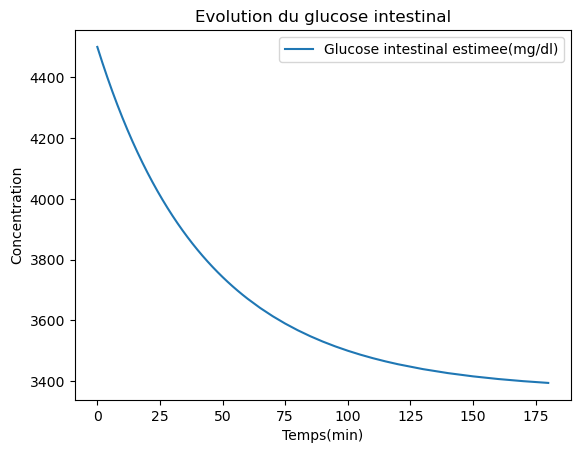

In [259]:
#Test sur moyenne
#Paramètres
param_n = [U0,k,b,c,d,e]

#estimation des paramètres
#P = odeint(av_model,y0,t,args=(U0,k,b,c,d,e)).T

p= fmin(distance_av,param_n,args=(data[11],t,y0))
print(p)


PestimM = odeint(av_model,y0,t,args=(p[0],p[1],p[2],p[3],p[4],p[5])).T

plt.plot(t,data[11],'g--',label="Glucose sanguin moyen(mg/dl)")
plt.plot(t,PestimM[1],'r',label="Glucose sanguin moyen estimée(mg/dl)")
#plt.plot(t,P[2],label="Insuline mg/dl)")
plt.plot(t,PestimM[2],label="Insuline estimée(mU/ml)")


plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose et de l'insuline en fonction du temps")
plt.legend()
plt.savefig("glv21.png")
plt.show()

plt.plot(t,PestimM[0],label="Glucose intestinal estimee(mg/dl)")


plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose intestinal")
plt.legend()
plt.savefig("glv22.png")
plt.show()

for i in range(6):
    arr[10,i] = p[i]

Optimization terminated successfully.
         Current function value: 15914.209234
         Iterations: 155
         Function evaluations: 272
Optimization terminated successfully.
         Current function value: 15914.208862
         Iterations: 224
         Function evaluations: 411
[5.80262744e-03 2.33288799e-02 4.07164756e-11 4.04437364e-02
 1.48716549e+00 4.47653200e+00]


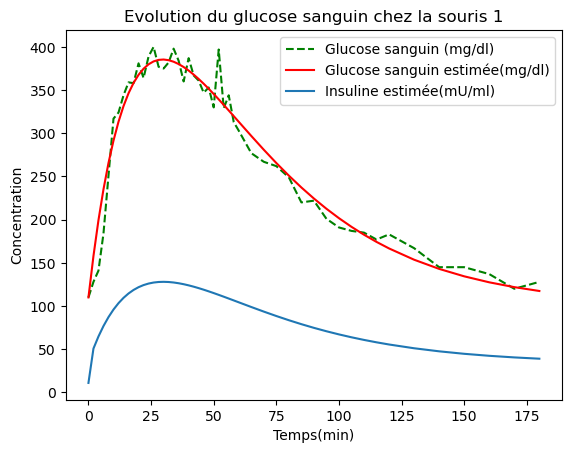

Optimization terminated successfully.
         Current function value: 32015.822399
         Iterations: 177
         Function evaluations: 335
Optimization terminated successfully.
         Current function value: 32015.810640
         Iterations: 468
         Function evaluations: 966
[5.09769186e-03 2.66612682e-02 7.73372331e-12 2.89899529e-02
 2.27314906e+00 1.35739247e+00]


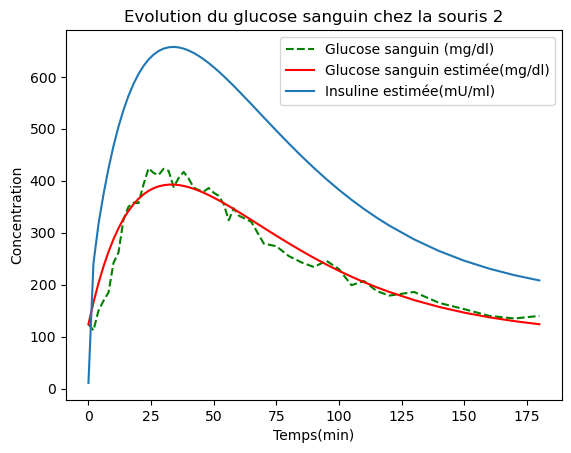

Optimization terminated successfully.
         Current function value: 71775.843512
         Iterations: 195
         Function evaluations: 338
[4.67354398e-03 2.39299637e-02 1.05216774e-10 2.40408576e-02
 1.87938401e+00 6.23903624e+00]


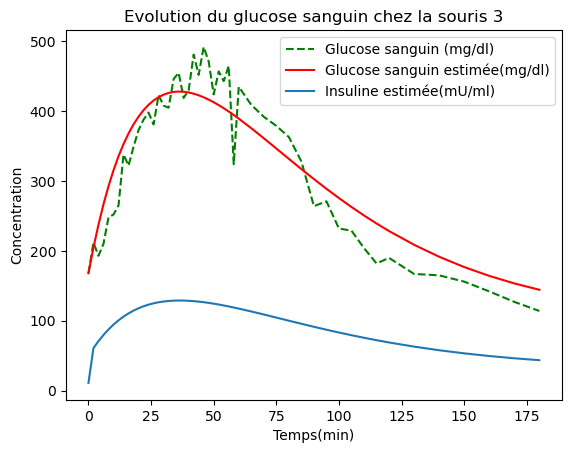

/usr/lib/python3/dist-packages/scipy/integrate/_odepack_py.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


Optimization terminated successfully.
         Current function value: 60086.955411
         Iterations: 400
         Function evaluations: 674
Optimization terminated successfully.
         Current function value: 59138.615008
         Iterations: 112
         Function evaluations: 201
[6.48900317e-03 3.01420129e-02 1.24985784e-19 3.18496768e-02
 1.70014651e-08 1.40374569e-01]


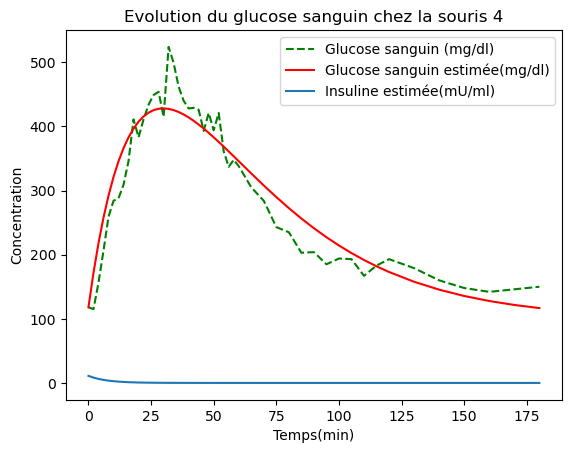

Optimization terminated successfully.
         Current function value: 25707.640405
         Iterations: 161
         Function evaluations: 283
[5.97482925e-03 2.02551186e-02 9.78349389e-11 5.67934045e-02
 1.83835222e+00 2.84025276e+00]


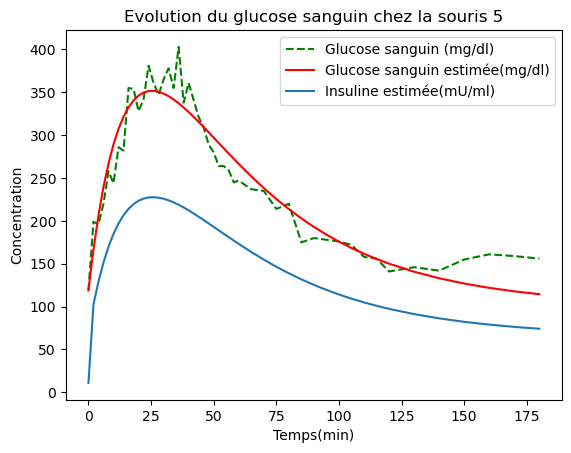

Optimization terminated successfully.
         Current function value: 55615.159830
         Iterations: 170
         Function evaluations: 301
Optimization terminated successfully.
         Current function value: 55615.159222
         Iterations: 192
         Function evaluations: 350
[5.53497995e-03 2.90094130e-02 9.61328194e-11 3.04380064e-02
 5.73612579e-01 2.12255412e+00]


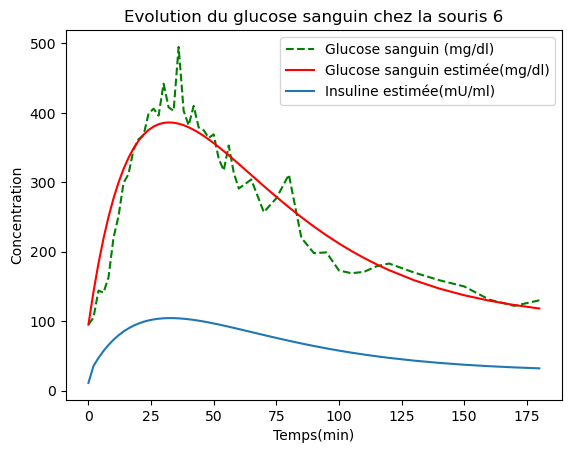

Optimization terminated successfully.
         Current function value: 34892.117812
         Iterations: 226
         Function evaluations: 381
Optimization terminated successfully.
         Current function value: 34892.102684
         Iterations: 89
         Function evaluations: 235
[6.25101621e-03 2.80976276e-02 8.24656058e-11 2.91348371e-02
 1.66813307e-01 3.16474177e+00]


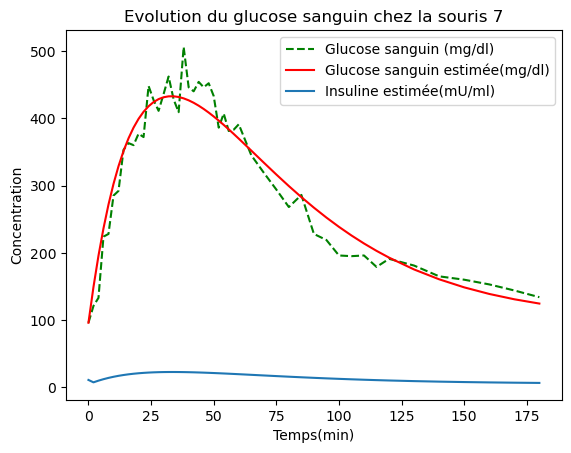

Optimization terminated successfully.
         Current function value: 46064.631406
         Iterations: 140
         Function evaluations: 245
Optimization terminated successfully.
         Current function value: 46064.622739
         Iterations: 86
         Function evaluations: 229
[1.12109502e-02 8.44886488e-03 7.97123180e-11 1.28762918e-01
 1.72305024e+00 3.72330981e+00]


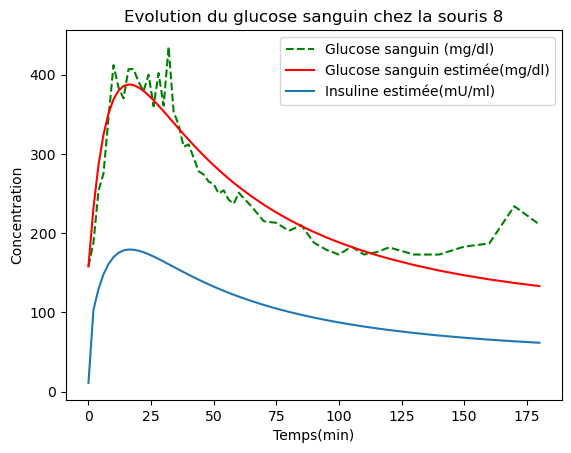

Optimization terminated successfully.
         Current function value: 16032.856926
         Iterations: 85
         Function evaluations: 212
[5.83297616e-03 1.31287502e-02 7.01312569e-11 5.78901181e-02
 3.61530600e+00 1.55670949e+00]


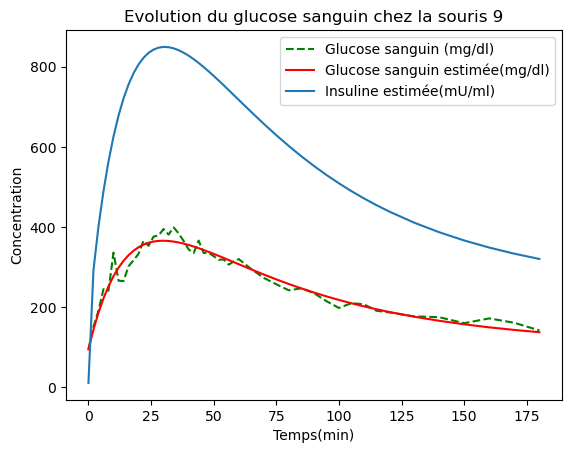

Optimization terminated successfully.
         Current function value: 32412.622522
         Iterations: 156
         Function evaluations: 274
Optimization terminated successfully.
         Current function value: 32412.617711
         Iterations: 84
         Function evaluations: 219
[7.07213461e-03 9.21824953e-03 1.04669239e-10 8.99799456e-02
 2.13130239e+00 4.06221641e+00]


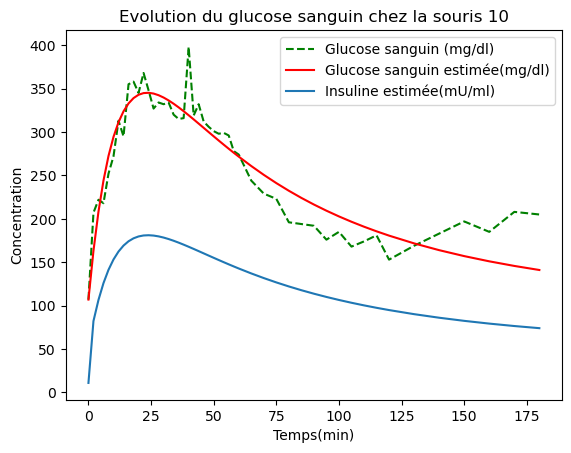

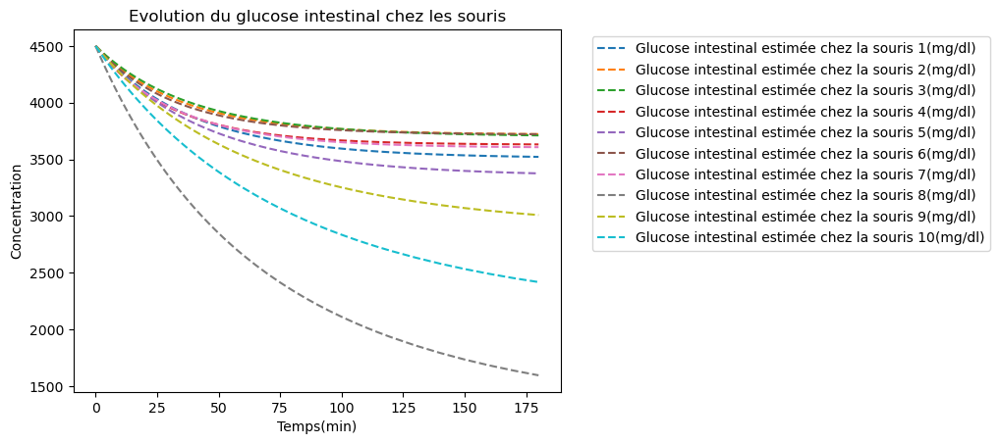

In [260]:
#Test sur souris
arr = np.zeros((13,6))
pesadv = []
#estimation des paramètres puis affichage
for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p1 = fmin(distance_av,param_n,args=(data[i],t,y0))
    p = fmin(distance_av,p1,args=(data[i],t,y0))

    print(p)
    
    arr[i-1] = p
    
    P = odeint(av_model,y0,t,args=(U0,k,b,c,d,e)).T
    Pestim = odeint(av_model,y0,t,args=(p[0],p[1],p[2],p[3],p[4],p[5])).T

    plt.plot(t,data[i],'g--',label="Glucose sanguin (mg/dl)")
    plt.plot(t,Pestim[1],'r',label="Glucose sanguin estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mU/ml)")

    pesadv.append(Pestim[0])
    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Evolution du glucose sanguin chez la souris "+str(i))
    plt.legend()
    plt.savefig("sourisadv"+str(i)+".png")
    plt.show()

for i in range(10):
    plt.plot(t,pesadv[i],'--',label="Glucose intestinal estimée chez la souris "+str(i+1)+"(mg/dl)")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose intestinal chez les souris")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.savefig("initintest"+str(i)+".png")
plt.show()

In [261]:
arrm = np.zeros((6))
art = arr.T

for i in range(6):
    arr[11,i] = art[i].mean()
    arr[12,i] = art[i].std()
index1 = ["U0","k","b","c","d","e"]
index2 = ["souris 1","souris 2","souris 3","souris 4","souris 5","souris 6","souris 7","souris 8","souris 9","souris 10","souris moyenne","moyenne","écart-type"]
df = pd.DataFrame(arr, index = index2,columns = index1)

df

,U0,k,b,c,d,e
souris 1,0.005803,0.023329,4.071648e-11,0.040444,1.487165e+00,4.476532
souris 2,0.005098,0.026661,7.733723e-12,0.028990,2.273149e+00,1.357392
souris 3,0.004674,0.023930,1.052168e-10,0.024041,1.879384e+00,6.239036
souris 4,0.006489,0.030142,1.249858e-19,0.031850,1.700147e-08,0.140375
souris 5,0.005975,0.020255,9.783494e-11,0.056793,1.838352e+00,2.840253
souris 6,0.005535,0.029009,9.613282e-11,0.030438,5.736126e-01,2.122554
souris 7,0.006251,0.028098,8.246561e-11,0.029135,1.668133e-01,3.164742
souris 8,0.011211,0.008449,7.971232e-11,0.128763,1.723050e+00,3.723310
souris 9,0.005833,0.013129,7.013126e-11,0.057890,3.615306e+00,1.556709
souris 10,0.007072,0.009218,1.046692e-10,0.089980,2.131302e+00,4.062216


In [134]:
U0m = [arr[:,0].mean(),arr[:,0].std()]
km = [arr[:,1].mean(),arr[:,1].std()]
bm = [arr[:,2].mean(),arr[:,2].std()]
cm = [arr[:,3].mean(),arr[:,3].std()]
dm = [arr[:,4].mean(),arr[:,4].std()]
em = [arr[:,5].mean(),arr[:,5].std()]

params_moy = [arr[11,0],arr[11,1],arr[11,2],arr[11,3],arr[11,4],arr[11,5]]
params_std = [arr[12,0],arr[12,1],arr[12,2],arr[12,3],arr[12,4],arr[12,5]]

print(params_moy)
print(params_std)

[0.005368911983877168, 0.017880586810872814, 5.954865108977016e-11, 0.043211098707612895, 1.3116805575878618, 2.3684552651455464]
[0.002274670102526823, 0.008835253292293024, 3.795384577479298e-11, 0.0312530319627338, 0.9949650079311843, 1.7200704075407567]


Optimization terminated successfully.
         Current function value: 8723.641904
         Iterations: 127
         Function evaluations: 218
Optimization terminated successfully.
         Current function value: 8723.634122
         Iterations: 275
         Function evaluations: 686
[5.85640063e-03 2.02243125e-02 6.53252368e-11 4.34274786e-02
 1.07289937e+00 2.66450534e+00]


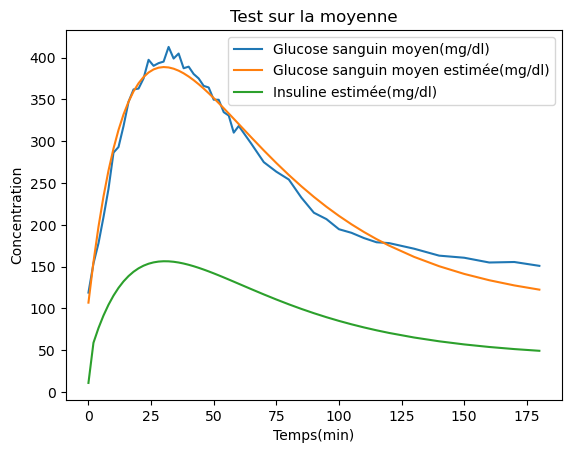

In [138]:
#estimation des paramètres

P = odeint(av_model,y0,t,args=(params_moy[0],params_moy[1],params_moy[2],params_moy[3],params_moy[4],params_moy[5])).T

p1= fmin(distance_av,params_moy,args=(data[11],t,y0))
p= fmin(distance_av,p1,args=(data[11],t,y0))


print(p)

PestimM = odeint(av_model,y0,t,args=(p[0],p[1],p[2],p[3],p[4],p[5])).T

plt.plot(t,data[11],label="Glucose sanguin moyen(mg/dl)")
plt.plot(t,PestimM[1],label="Glucose sanguin moyen estimée(mg/dl)")
#plt.plot(t,P[2],label="Insuline mg/dl)")
plt.plot(t,PestimM[2],label="Insuline estimée(mg/dl)")


plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Test sur la moyenne")
plt.legend()
plt.show()



Optimization terminated successfully.
         Current function value: 15914.210191
         Iterations: 140
         Function evaluations: 239
[5.80262737e-03 2.33305154e-02 5.55644856e-11 4.04418737e-02
 9.91215120e-01 2.34227183e+00]


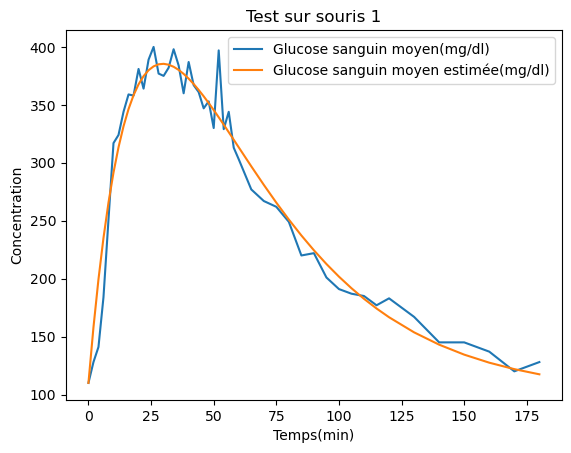

Optimization terminated successfully.
         Current function value: 32015.808831
         Iterations: 135
         Function evaluations: 234
Optimization terminated successfully.
         Current function value: 32015.804399
         Iterations: 139
         Function evaluations: 283
[5.09795153e-03 2.66556017e-02 5.65882882e-11 2.89968993e-02
 1.38844600e+00 2.08866801e+00]


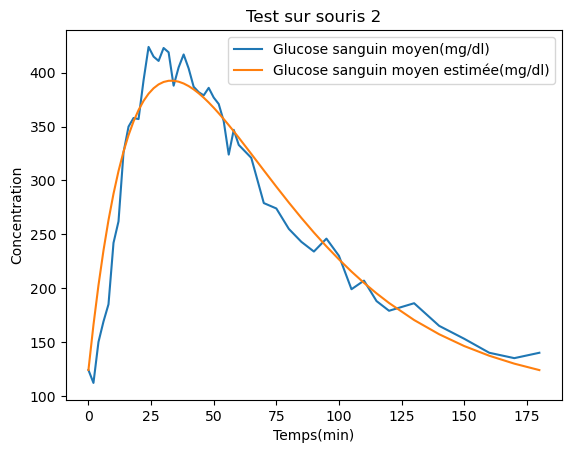

Optimization terminated successfully.
         Current function value: 71775.819390
         Iterations: 158
         Function evaluations: 272
Optimization terminated successfully.
         Current function value: 71775.809442
         Iterations: 294
         Function evaluations: 528
[4.67345265e-03 2.39216403e-02 5.72794110e-11 2.40475878e-02
 1.18145011e+00 3.43395325e+00]


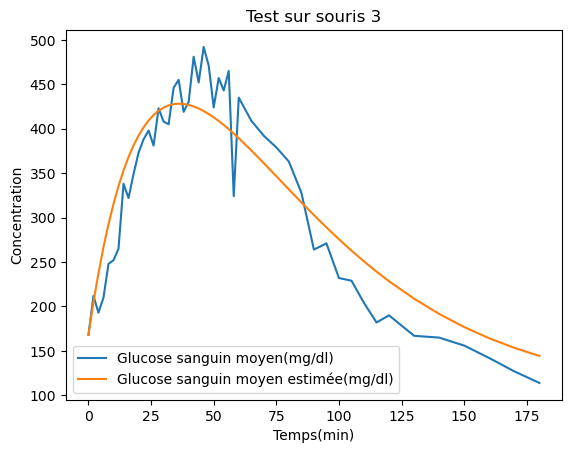

Optimization terminated successfully.
         Current function value: 59138.609616
         Iterations: 145
         Function evaluations: 244
Optimization terminated successfully.
         Current function value: 59138.602564
         Iterations: 78
         Function evaluations: 174
[6.48893704e-03 3.01407818e-02 3.84183009e-11 3.18503725e-02
 1.14492600e+00 2.42436542e+00]


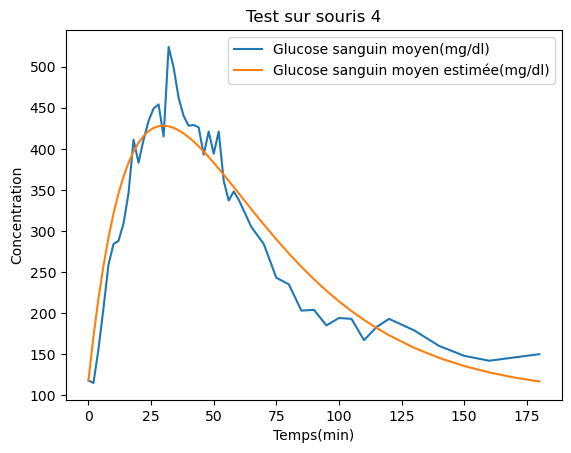

Optimization terminated successfully.
         Current function value: 25707.643455
         Iterations: 165
         Function evaluations: 281
Optimization terminated successfully.
         Current function value: 25707.642709
         Iterations: 98
         Function evaluations: 215
[5.97508545e-03 2.02537239e-02 5.17420634e-11 5.67978595e-02
 1.53097960e+00 1.22533123e+00]


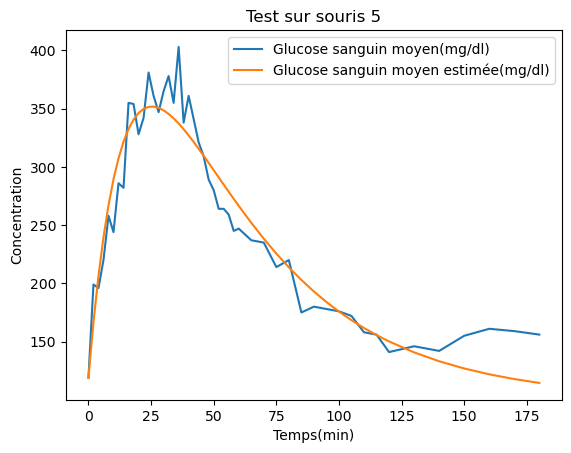

Optimization terminated successfully.
         Current function value: 55612.936653
         Iterations: 277
         Function evaluations: 466
[5.23698702e-03 5.10440454e-03 1.60766864e-08 4.50011475e-02
 6.74766105e+01 5.75892157e-08]


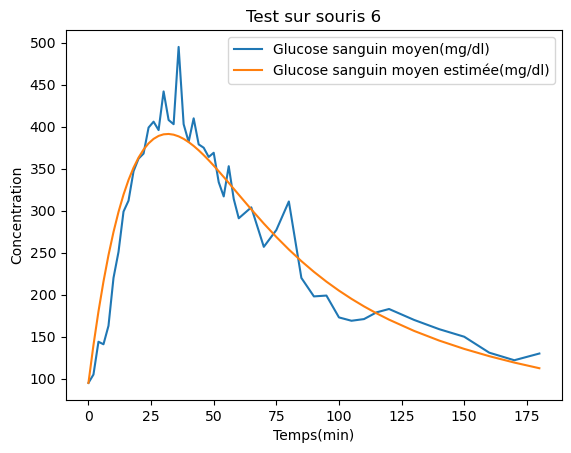

Optimization terminated successfully.
         Current function value: 34892.105156
         Iterations: 253
         Function evaluations: 644
[6.25111062e-03 2.80942510e-02 8.81379333e-11 2.91385481e-02
 7.48219442e-01 2.10401381e+00]


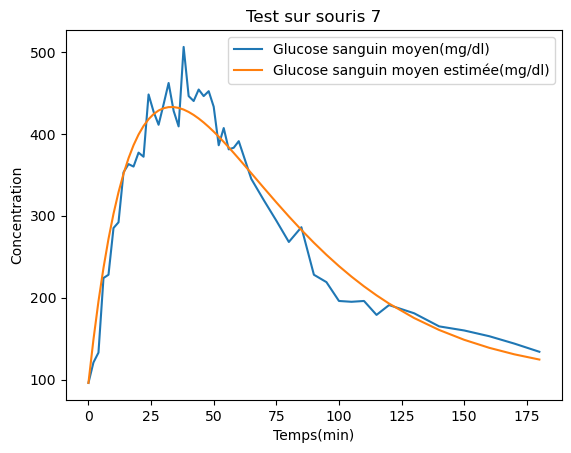

Optimization terminated successfully.
         Current function value: 46064.596257
         Iterations: 217
         Function evaluations: 363
[5.27074283e-03 3.35482121e-09 2.36680851e-08 7.76047253e-03
 3.76850965e+02 2.85110714e-02]


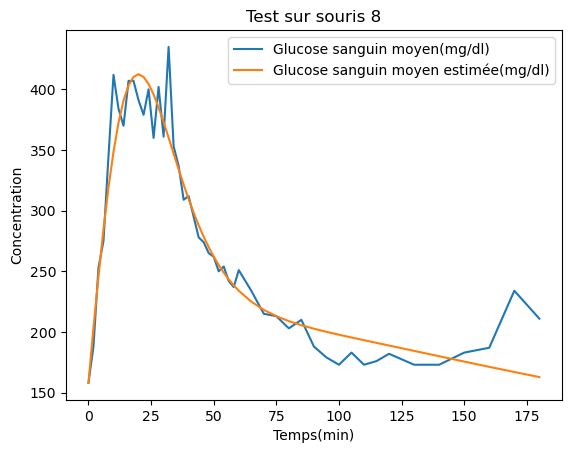

[5.83288495e-03 1.31291948e-02 5.14200698e-11 5.78879102e-02
 1.21949182e+00 2.15556156e+00]


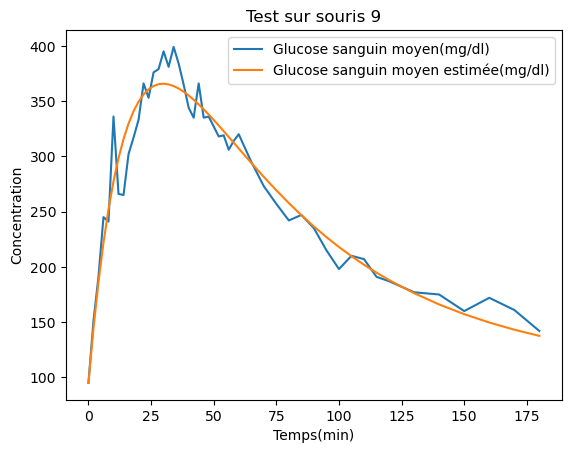

Optimization terminated successfully.
         Current function value: 32412.617023
         Iterations: 209
         Function evaluations: 347
Optimization terminated successfully.
         Current function value: 32412.615972
         Iterations: 243
         Function evaluations: 435
[7.07212820e-03 9.21831731e-03 6.02270030e-12 8.99797327e-02
 1.51163565e+00 2.07503913e+00]


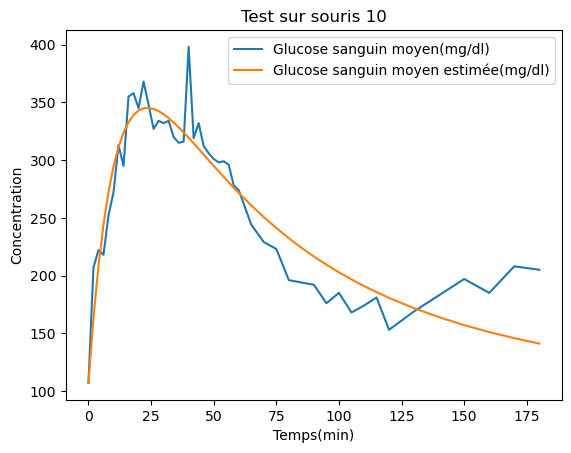

Optimization terminated successfully.
         Current function value: 10063.651257
         Iterations: 144
         Function evaluations: 252
[5.61193566e-03 2.11767403e-02 3.56184341e-11 4.07559317e-02
 1.37205699e+00 2.71933327e+00]


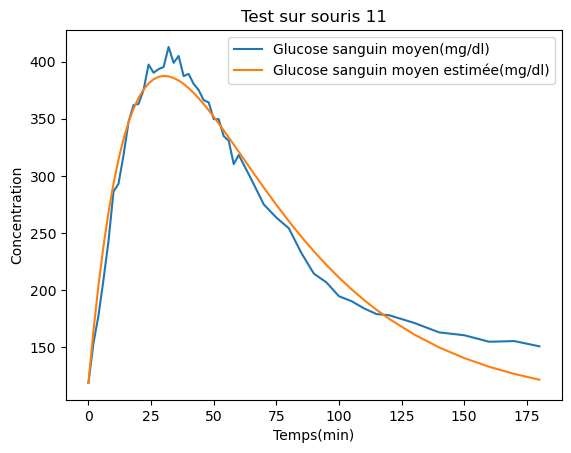

In [139]:
#estimation des paramètres puis affichage

arr2 = np.zeros((13,6))

for i in range(1,nbs+2):
    y0 = [G0, data[i,0],11]
    p1 = fmin(distance_av,params_moy,args=(data[i],t,y0))
    p = fmin(distance_av,p1,args=(data[i],t,y0))

    print(p)
    
    arr2[i-1] = p
    
    P = odeint(av_model,y0,t,args=(params_moy[0],params_moy[1],params_moy[2],params_moy[3],params_moy[4],params_moy[5])).T
    Pestim = odeint(av_model,y0,t,args=(p[0],p[1],p[2],p[3],p[4],p[5])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline mg/dl)")
    #plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

3. Discuter de l’amélioration de votre modèle et éventuellement des résultats biologiques : notamment on a donné 4500mg/dl de glucose en oral au souris, vont-elles tout absorber ?

In [140]:
art = arr2.T

for i in range(6):
    arr2[11,i] = art[i].mean()
    arr2[12,i] = art[i].std()
index1 = ["U0","k","b","c","d","e"]
index2 = ["souris 1","souris 2","souris 3","souris 4","souris 5","souris 6","souris 7","souris 8","souris 9","souris 10","souris moyenne","moyenne","écart-type"]
df = pd.DataFrame(arr2, index = index2,columns = index1)

df

,U0,k,b,c,d,e
souris 1,0.005803,2.333052e-02,5.556449e-11,0.040442,0.991215,2.342272e+00
souris 2,0.005098,2.665560e-02,5.658829e-11,0.028997,1.388446,2.088668e+00
souris 3,0.004673,2.392164e-02,5.727941e-11,0.024048,1.181450,3.433953e+00
souris 4,0.006489,3.014078e-02,3.841830e-11,0.031850,1.144926,2.424365e+00
souris 5,0.005975,2.025372e-02,5.174206e-11,0.056798,1.530980,1.225331e+00
souris 6,0.005237,5.104405e-03,1.607669e-08,0.045001,67.476610,5.758922e-08
souris 7,0.006251,2.809425e-02,8.813793e-11,0.029139,0.748219,2.104014e+00
souris 8,0.005271,3.354821e-09,2.366809e-08,0.007760,376.850965,2.851107e-02
souris 9,0.005833,1.312919e-02,5.142007e-11,0.057888,1.219492,2.155562e+00
souris 10,0.007072,9.218317e-03,6.022700e-12,0.089980,1.511636,2.075039e+00


In [143]:
U0m2 = [arr2[:,0].mean(),arr2[:,0].std()]
km2 = [arr2[:,1].mean(),arr2[:,1].std()]
bm2 = [arr2[:,2].mean(),arr2[:,2].std()]
cm2 = [arr2[:,3].mean(),arr2[:,3].std()]
dm2 = [arr2[:,4].mean(),arr2[:,4].std()]
em2 = [arr2[:,5].mean(),arr2[:,5].std()]

params_moy2 = [arr2[11,0],arr2[11,1],arr2[11,2],arr2[11,3],arr2[11,4],arr2[11,5]]
params_std2 = [arr2[12,0],arr2[12,1],arr2[12,2],arr2[12,3],arr2[12,4],arr2[12,5]]

for i in range(len(params_moy)):
    print("v"+str(i)+" reso_1 : "+str(params_moy[i])+" et ect reso_1 :"+str(params_std[i])+"rapport : "+str(params_std[i]/params_moy[i]))
    print("v"+str(i)+" reso_2 : "+str(params_moy2[i])+" et ect reso_2 :"+str(params_std2[i])+"rapport : "+str(params_std2[i]/params_moy2[i]))

v0 reso_1 : 0.005368911983877168 et ect reso_1 :0.002274670102526823rapport : 0.423674314154833
v0 reso_2 : 0.004870295639005539 et ect reso_2 :0.0016460139213585483rapport : 0.3379700214040079
v1 reso_1 : 0.017880586810872814 et ect reso_1 :0.008835253292293024rapport : 0.4941254661128062
v1 reso_2 : 0.015463474957361226 et ect reso_2 :0.01000326004545096rapport : 0.6468959967299597
v2 reso_1 : 5.954865108977016e-11 et ect reso_1 :3.795384577479298e-11rapport : 0.6373586148505228
v2 reso_2 : 3.0911971682868046e-09 et ect reso_2 :7.2544495745752376e-09rapport : 2.3468090774021317
v3 reso_1 : 0.043211098707612895 et ect reso_1 :0.0312530319627338rapport : 0.7232639969237271
v3 reso_2 : 0.03481987196280601 et ect reso_2 :0.021962720794440605rapport : 0.630752485761602
v4 reso_1 : 1.3116805575878618 et ect reso_1 :0.9949650079311843rapport : 0.758542163467676
v4 reso_2 : 35.031999680042176 et ect reso_2 :99.73354530709877rapport : 2.8469269872686493
v5 reso_1 : 2.3684552651455464 et ect r

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


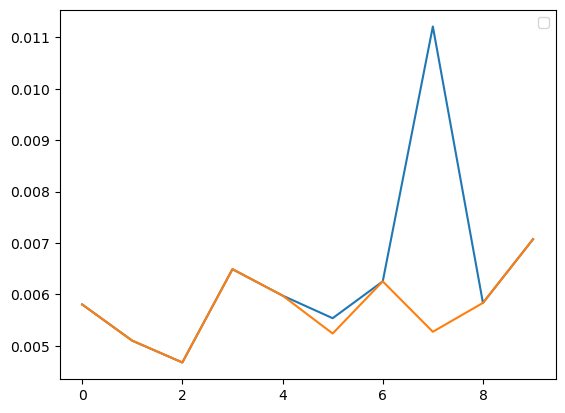

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


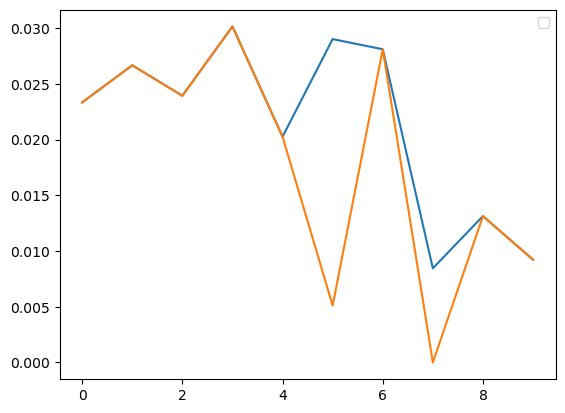

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


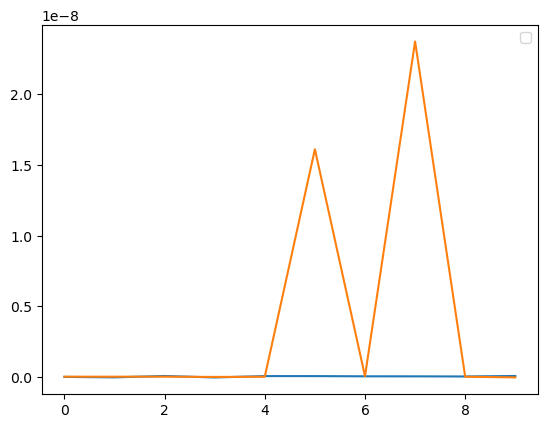

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


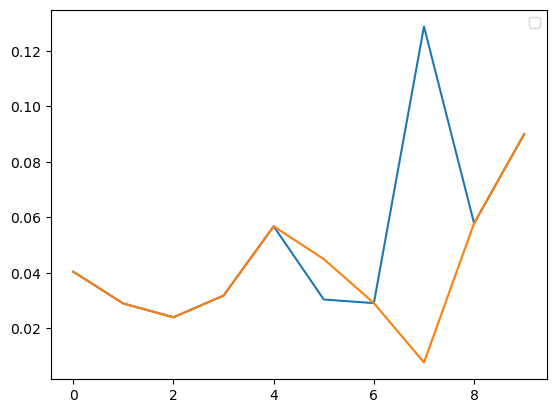

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


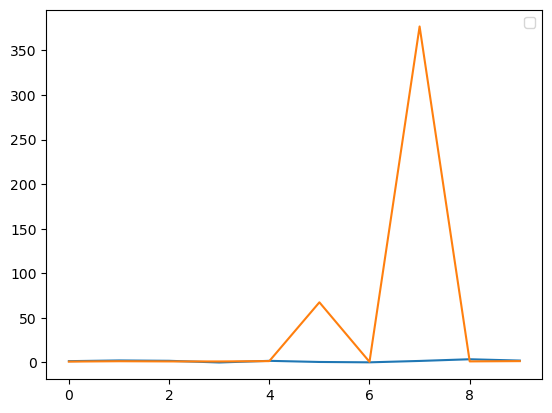

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


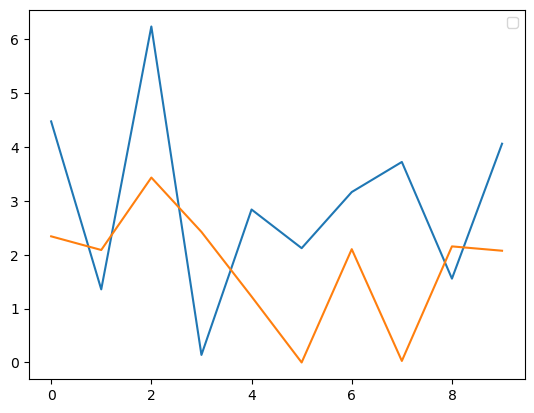

In [146]:
for i in range(6):
    t = np.arange(0,10,1)
    plt.plot(t,arr[:10,i])
    plt.plot(t,arr2[:10,i])
    plt.legend()
    plt.show()

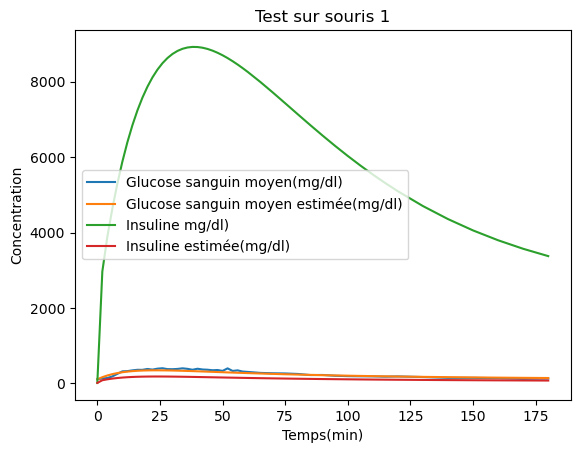

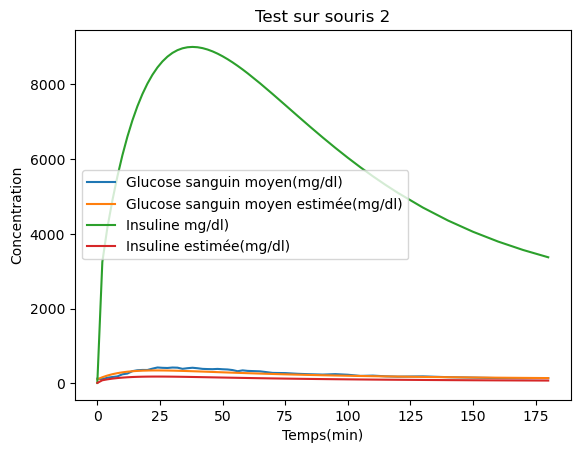

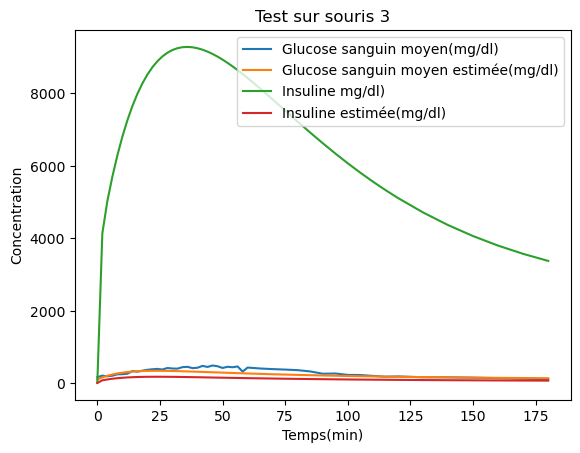

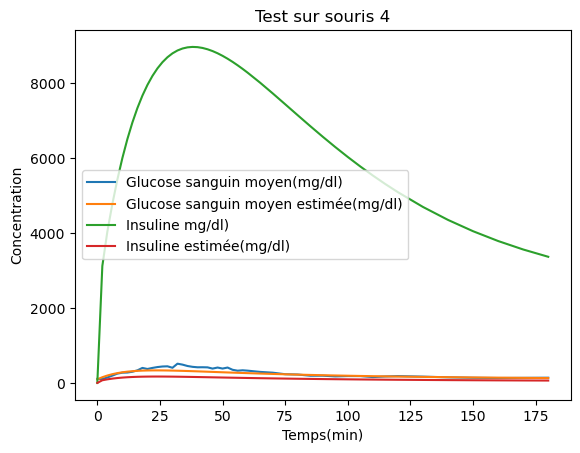

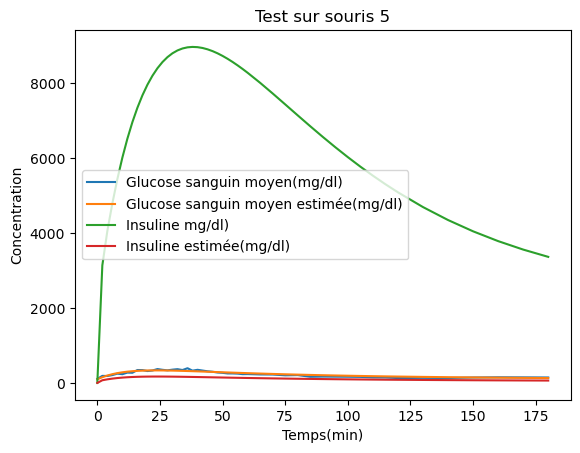

...

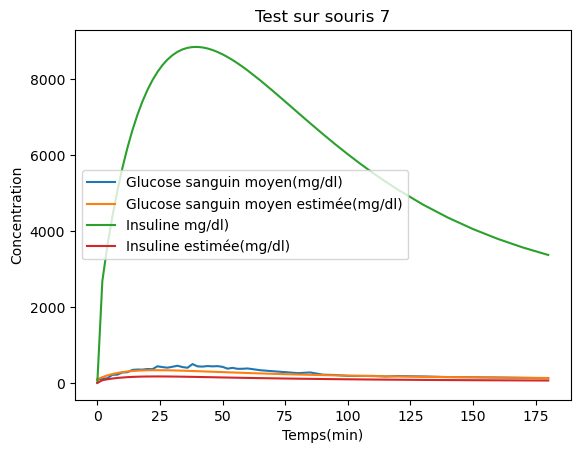

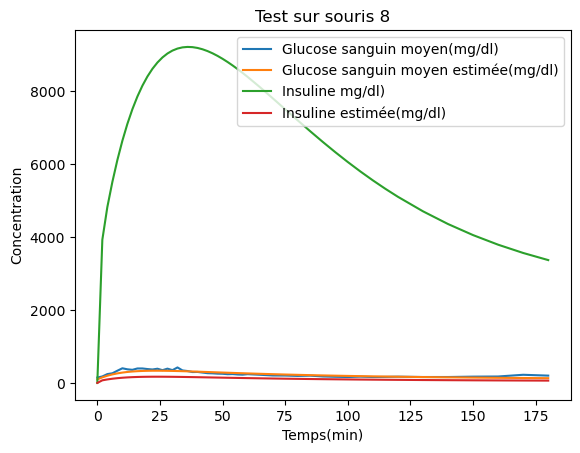

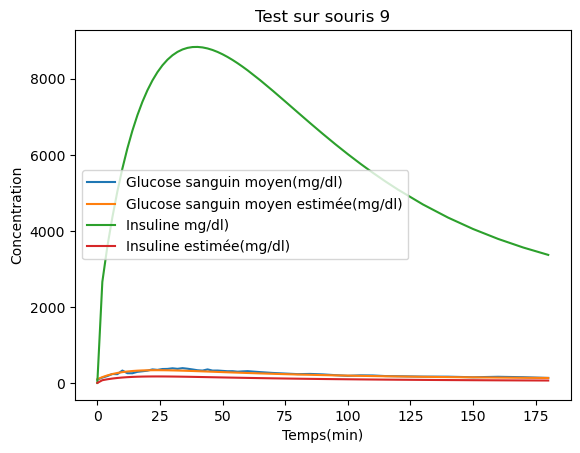

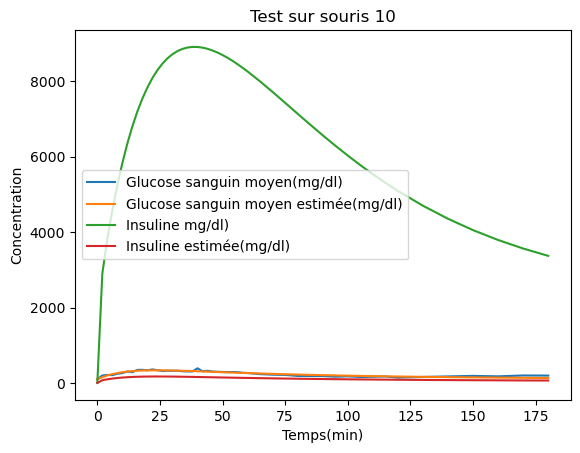

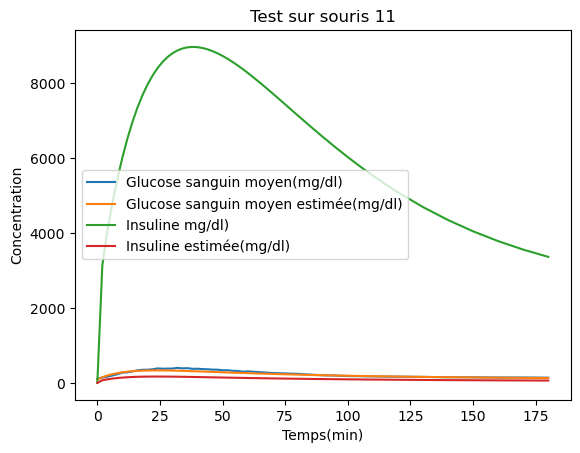

In [152]:
for i in range(1,nbs+2):
    y0 = [G0, data[i,0],11]
    
    P = odeint(av_model,y0,t,args=(params_moy2[0],params_moy2[1],params_moy2[2],params_moy2[3],params_moy2[4],params_moy2[5])).T
    
    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

Le nombre de paramètres inconnus peut être important, et donc le problème de recherche certains de ces paramètres peuvent être sur-déterminés (i.e ces paramètres sont dépendants et plusieurs autres valeurs de jeux de paramètres donnent la même sortie du modèle). Ainsi il faut essayer de réduire le nombre les paramètres. Une option est de fixer un(des) paramètre(s) (il ne sont plus estimés) puis de vérifier si on arrive encore à ajuster les données avec le modèle. Si c’est le cas alors ce paramètre peut rester fixe - il est sur-déterminé ou la sortie du modèle n’est pas sensible à ce paramètre.

Ne pas hésiter à tester des modèles (et à faire varier les paramètres de départ pour votre minimisation). Il faut essayer d’en trouver un, le plus simple, ayant un nombre minimal de paramètres libres (normalement 4 c’est optimal). Enfin, il n’y a que le glucose donc l’information sur l’insuline ne pourra pas être obtenue. Servez vous de cela pour limiter le nombre de paramètres sur la dynamique de l’insuline.

Répéter l’approche précédente en essayant de fournir un modèle qui n’est pas (trop) sur-déterminé. C’est sur ce dernier modèle final que vous ferez le rapport - (mais vous aurez fait plein de tests/codes avant !). Vous présenterez votre méthode pour aboutir au modèle final avec vos différents tests et vos conclusions. Nous attendons des figures de fit pour chaque souris, mais aussi vos commentaires/remarques sur les paramètres estimés.

In [153]:
#Si on choisit entre U0  et k, il faudrait voir et supposer que 
#les souris ont soit une vitesse d'absorption initiale identique 
#ou une vitesse de transport sanguin (sortie) identique

#Faire la fixation  des paramètres un par un 
print(params_moy2[0])

0.004870295639005539


Optimization terminated successfully.
         Current function value: 15914.209732
         Iterations: 180
         Function evaluations: 314
[5.80281573e-03 2.33273803e-02 9.97236038e-11 4.04469404e-02
 4.38038712e-02]


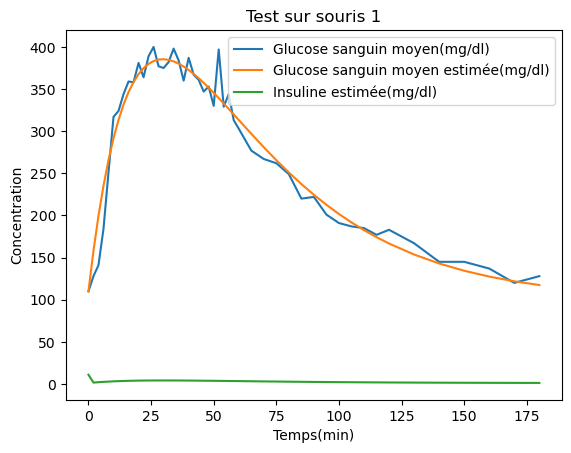

[5.09780732e-03 2.66531195e-02 7.88774013e-11 2.89975183e-02
 4.42548945e-01]


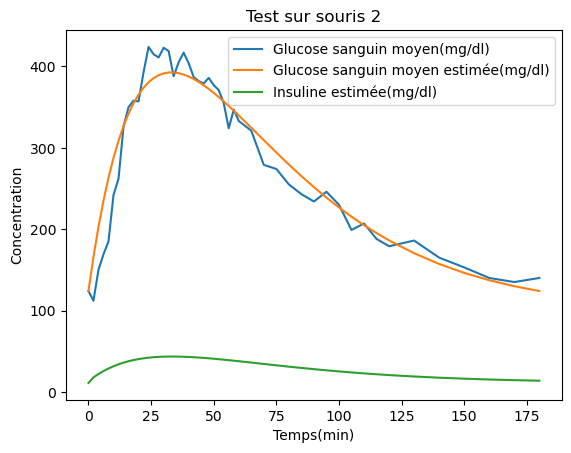

Optimization terminated successfully.
         Current function value: 71775.821878
         Iterations: 181
         Function evaluations: 329
[4.67339190e-03 2.39258856e-02 6.03489850e-11 2.40441332e-02
 7.73084002e-01]


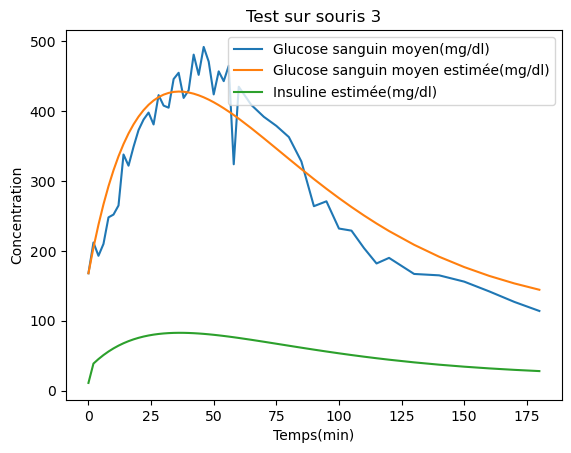

Optimization terminated successfully.
         Current function value: 59138.621854
         Iterations: 213
         Function evaluations: 360
[6.48897859e-03 3.01423625e-02 9.45429964e-11 3.18494130e-02
 1.63821008e-01]


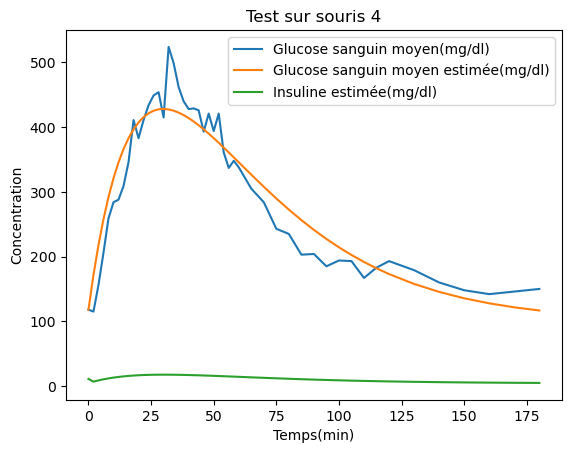

[5.97500683e-03 2.02572698e-02 9.09420405e-11 5.67918932e-02
 3.82871954e-01]


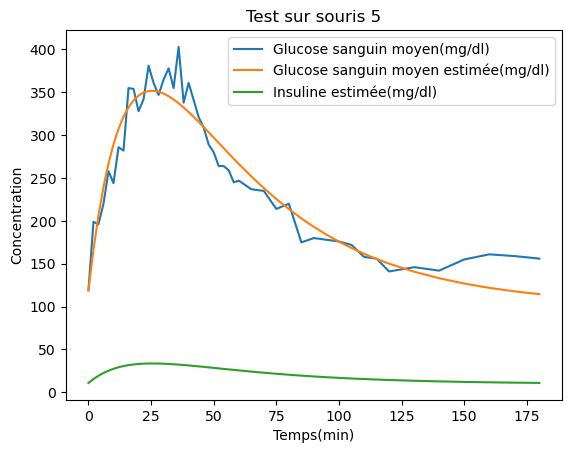

Optimization terminated successfully.
         Current function value: 55615.159186
         Iterations: 244
         Function evaluations: 425
[5.53508627e-03 2.90166290e-02 2.21067144e-12 3.04325617e-02
 2.68935135e-02]


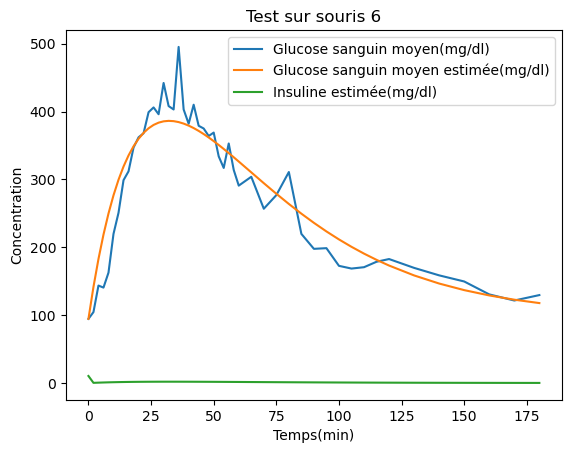

Optimization terminated successfully.
         Current function value: 34892.101332
         Iterations: 164
         Function evaluations: 306
[6.25078930e-03 2.81050363e-02 1.77962338e-11 2.91269412e-02
 5.59964558e-01]


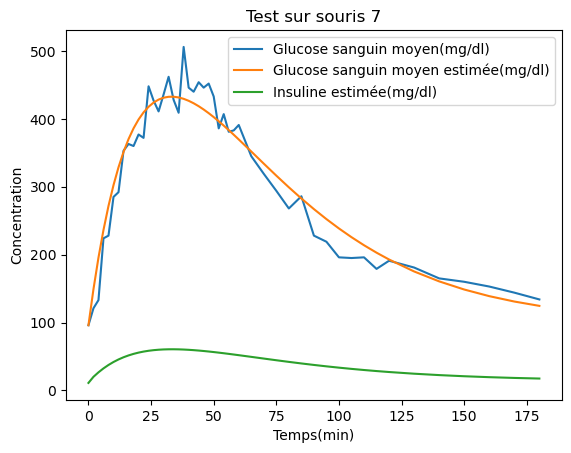

Optimization terminated successfully.
         Current function value: 46064.627325
         Iterations: 107
         Function evaluations: 205
[1.12109374e-02 8.44809219e-03 1.03010750e-10 1.28765769e-01
 1.06472524e+00]


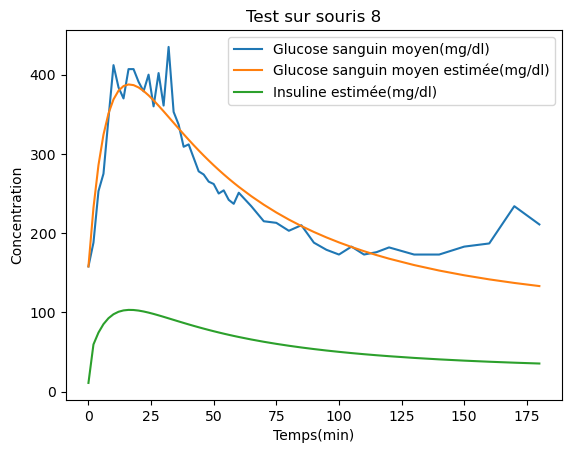

Optimization terminated successfully.
         Current function value: 16032.856113
         Iterations: 138
         Function evaluations: 231
[5.83288276e-03 1.31290329e-02 5.32857600e-11 5.78885819e-02
 1.86728356e+00]


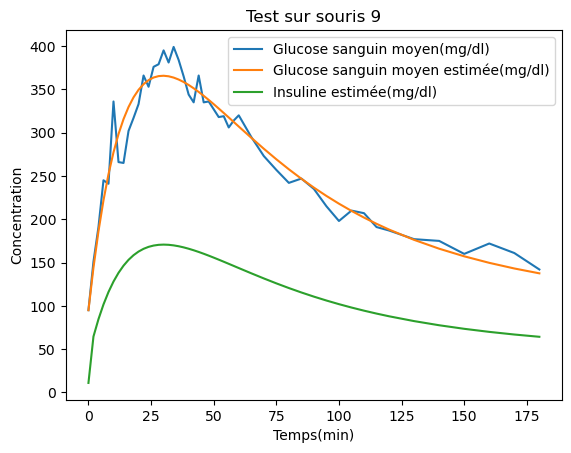

Optimization terminated successfully.
         Current function value: 32412.620576
         Iterations: 131
         Function evaluations: 222
[7.07206800e-03 9.21857127e-03 8.85063528e-11 8.99784087e-02
 1.94299483e+00]


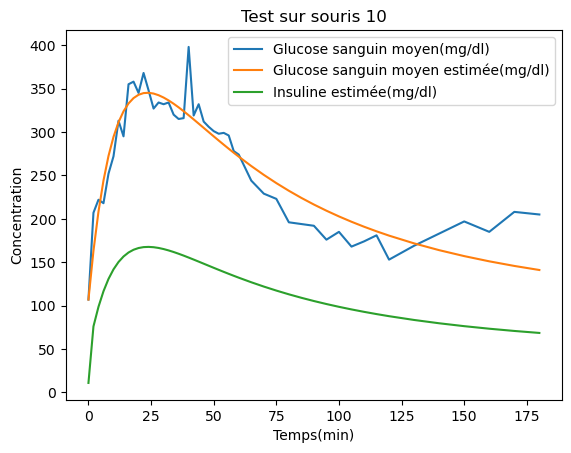

In [161]:
#Ici  on va tester la fixation de U0 : donc on suppose une vitesse d'absorption initiale identique chez la souris
#Paramètres
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= 8e-11
c= 0.12
d= 1.5
e= params_moy[5]

b= 8e-11
c= 0.10
d= 1.7
e= 4


para = [U0,k,b,c,d]

def av_model_e_fix(y,t,U0,k,b,c,d):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    e = 4
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_e_fix(param,obs,t,y0):
    U0,k,b,c,d= param
    P = odeint(av_model_e_fix,y0,t,args=(U0,k,b,c,d,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0)+1e8*(k<0) + 1e8*(b<0) +1e8*(c<0)+1e8*(d<0)


for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p = fmin(distance_av_e_fix,para,args=(data[i],t,y0))
    print(p)
    Pestim = odeint(av_model_e_fix,y0,t,args=(p[0],p[1],p[2],p[3],p[4])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

Optimization terminated successfully.
         Current function value: 17341.253032
         Iterations: 257
         Function evaluations: 434
Optimization terminated successfully.
         Current function value: 17341.251683
         Iterations: 55
         Function evaluations: 139
[2.93171766e-02 2.52700611e-10 3.10550135e-02 1.51104531e-03
 4.19252683e+00]


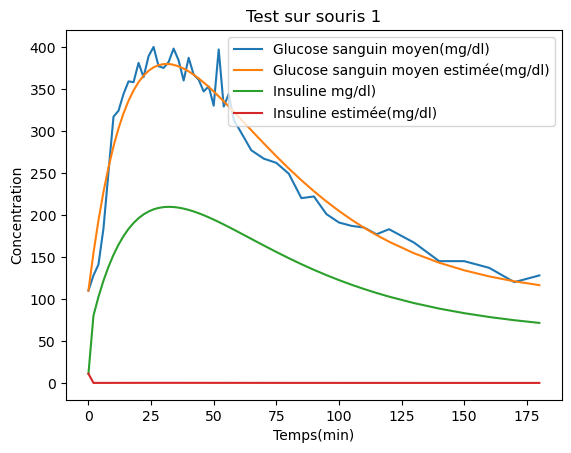

Optimization terminated successfully.
         Current function value: 33022.607323
         Iterations: 420
         Function evaluations: 910
[2.31923189e-02 9.52679133e-11 3.42471745e-02 4.39690035e-01
 1.09284935e+01]


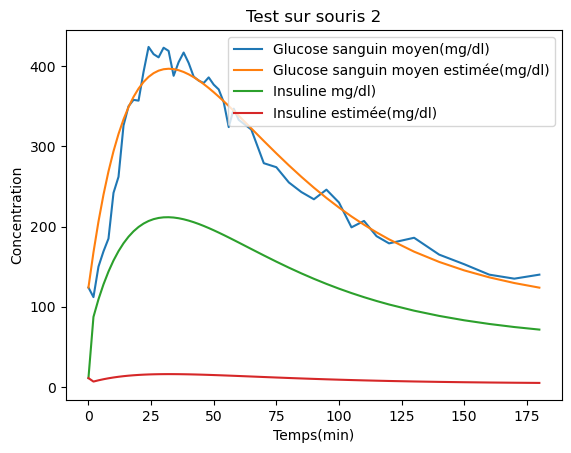

Optimization terminated successfully.
         Current function value: 82259.883380
         Iterations: 136
         Function evaluations: 237
Optimization terminated successfully.
         Current function value: 82259.854612
         Iterations: 166
         Function evaluations: 319
[2.14955716e-02 7.51692139e-11 3.01257723e-02 1.48642308e+00
 5.26239610e+00]


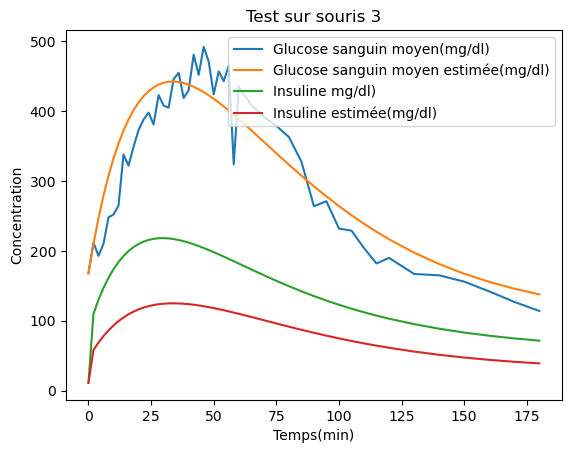

Optimization terminated successfully.
         Current function value: 77915.129123
         Iterations: 205
         Function evaluations: 362
Optimization terminated successfully.
         Current function value: 77915.129122
         Iterations: 48
         Function evaluations: 121
[2.76649221e-02 1.51565132e-10 2.80512668e-02 8.01528878e-04
 1.73118880e+00]


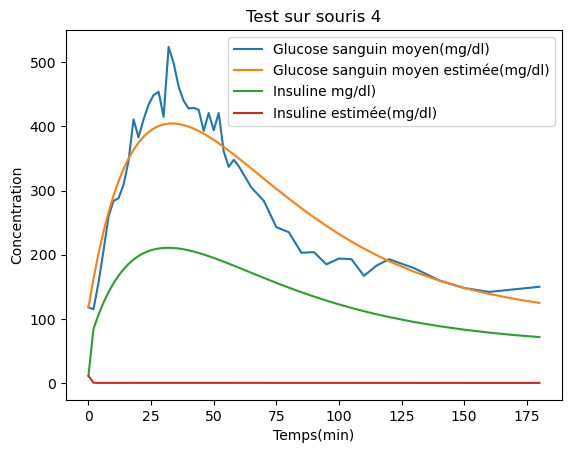

Optimization terminated successfully.
         Current function value: 27183.112872
         Iterations: 172
         Function evaluations: 301
Optimization terminated successfully.
         Current function value: 27183.112865
         Iterations: 58
         Function evaluations: 141
[2.50617033e-02 9.86601886e-13 4.46442924e-02 1.73506294e+00
 9.11327377e+00]


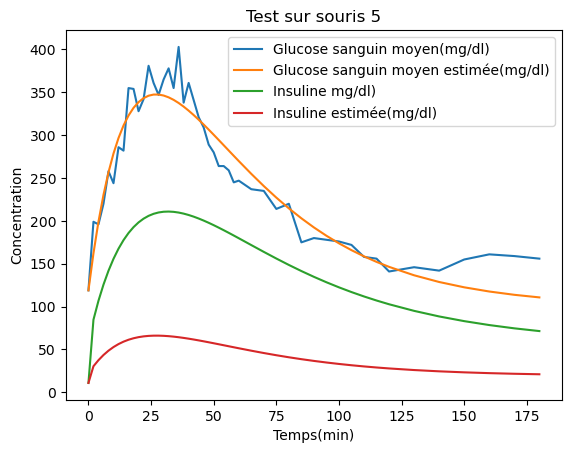

Optimization terminated successfully.
         Current function value: 56052.566597
         Iterations: 169
         Function evaluations: 322
Optimization terminated successfully.
         Current function value: 56052.553040
         Iterations: 179
         Function evaluations: 513
[2.83689532e-02 6.34269528e-12 3.00196831e-02 4.63064440e-01
 7.40722453e+00]


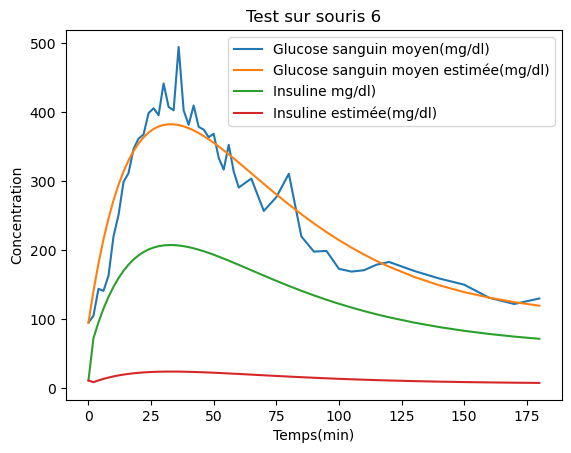

Optimization terminated successfully.
         Current function value: 49146.845824
         Iterations: 463
         Function evaluations: 801
Optimization terminated successfully.
         Current function value: 23574.034574
         Iterations: 392
         Function evaluations: 664
[3.37711532e-03 1.14246952e-08 3.44956670e-02 1.02897624e+02
 3.72795473e-10]


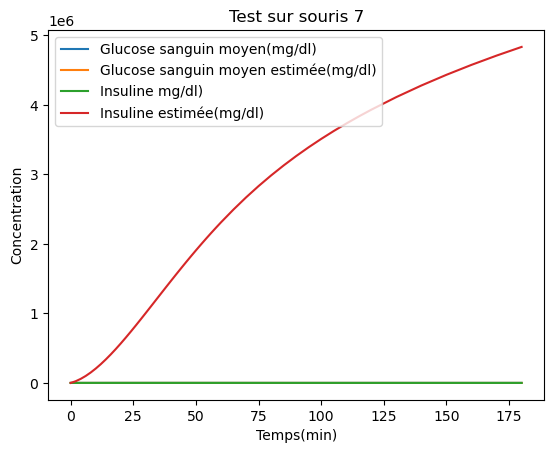

[2.04563700e-02 7.58713533e-11 5.14892591e-02 3.54780115e-01
 5.23574784e+00]


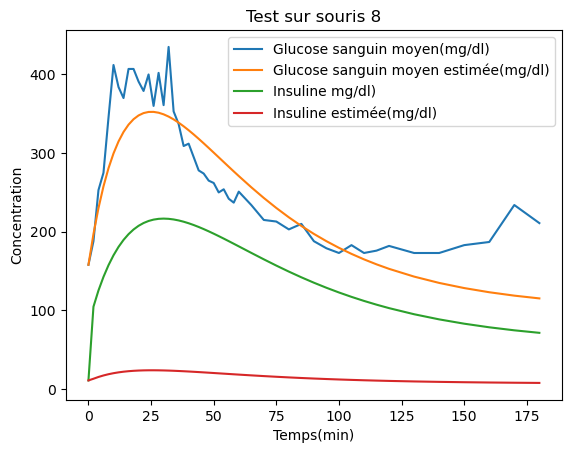

Optimization terminated successfully.
         Current function value: 17114.869676
         Iterations: 200
         Function evaluations: 354
Optimization terminated successfully.
         Current function value: 17114.868010
         Iterations: 67
         Function evaluations: 169
[1.50499159e-02 8.89263741e-11 4.99785525e-02 5.81952002e-03
 7.69768758e+00]


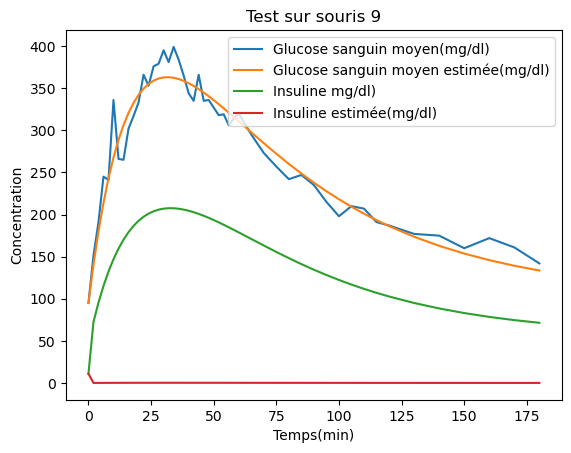

Optimization terminated successfully.
         Current function value: 40080.963020
         Iterations: 96
         Function evaluations: 176
Optimization terminated successfully.
         Current function value: 40080.958220
         Iterations: 188
         Function evaluations: 329
[1.34604962e-02 9.22575985e-11 6.15071103e-02 1.62709379e+00
 4.69621696e+00]


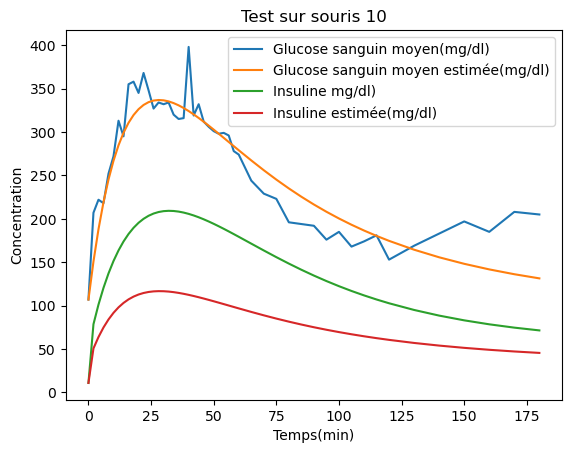

In [162]:
#Ici  on va tester la fixation de UÀ : donc on suppose une vitesse d'absorption initiale identique chez la souris
#Paramètres
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= 8e-11
c= 0.12
d= 1.5
e= 5.1

b= 8e-11
c= 0.10
d= 1.7
e= 4


para = [k,b,c,d,e]

def av_model_u0_fix(y,t,k,b,c,d,e):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    U0 = params_moy[0]
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_u0_fix(param,obs,t,y0):
    k,b,c,d,e= param
    P = odeint(av_model_u0_fix,y0,t,args=(k,b,c,d,e,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(k<0) + 1e8*(b<0) +1e8*(c<0)+1e8*(d<0) + 1e8*(e<0)


for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p1 = fmin(distance_av_u0_fix,para,args=(data[i],t,y0))
    p = fmin(distance_av_u0_fix,p1,args=(data[i],t,y0))

    print(p)
    
    P = odeint(av_model_u0_fix,y0,t,args=(params_moy[1],params_moy[2],params_moy[3],params_moy[4],params_moy[5])).T
    Pestim = odeint(av_model_u0_fix,y0,t,args=(p[0],p[1],p[2],p[3],p[4])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

Optimization terminated successfully.
         Current function value: 29881.498306
         Iterations: 92
         Function evaluations: 175
Optimization terminated successfully.
         Current function value: 29881.498306
         Iterations: 92
         Function evaluations: 175
[6.92071277e-03 6.60239038e-11 7.30138685e-02 2.43600280e+00
 4.89013511e+00]


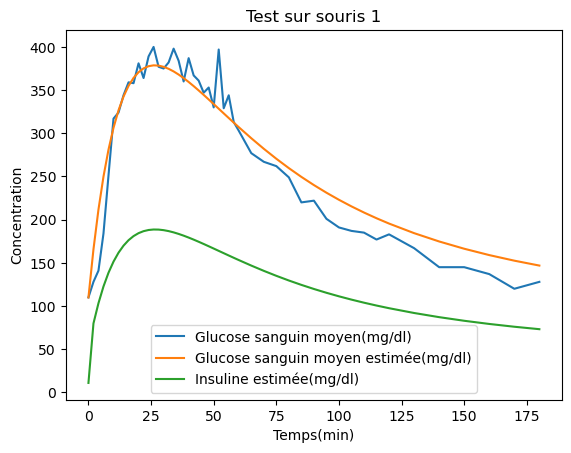

Optimization terminated successfully.
         Current function value: 50623.727373
         Iterations: 91
         Function evaluations: 173
Optimization terminated successfully.
         Current function value: 50623.727373
         Iterations: 91
         Function evaluations: 173
[5.89299900e-03 8.42696338e-11 5.87037439e-02 1.99394007e+00
 5.54099200e+00]


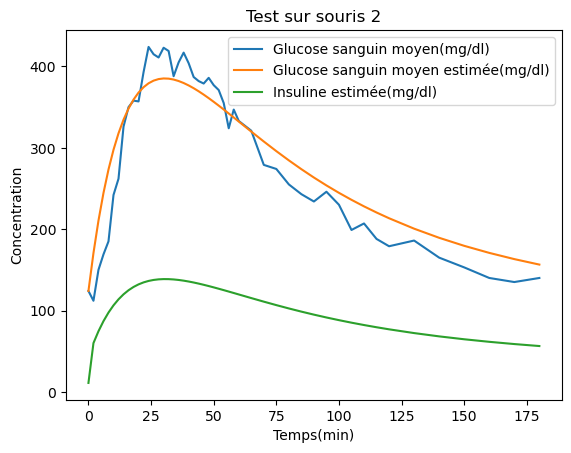

Optimization terminated successfully.
         Current function value: 105655.179463
         Iterations: 123
         Function evaluations: 216
Optimization terminated successfully.
         Current function value: 105655.179463
         Iterations: 123
         Function evaluations: 216
[5.21861946e-03 7.45248570e-11 4.43111405e-02 2.51129892e+00
 5.63239720e+00]


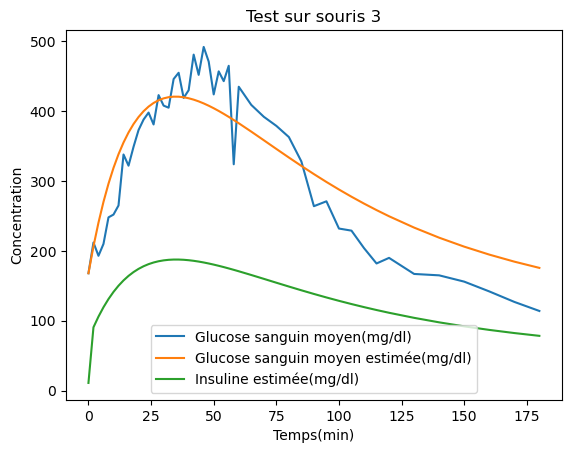

Optimization terminated successfully.
         Current function value: 95184.683114
         Iterations: 100
         Function evaluations: 181
Optimization terminated successfully.
         Current function value: 95184.683114
         Iterations: 100
         Function evaluations: 181
[7.44664311e-03 9.75109833e-11 6.68831193e-02 1.97882489e+00
 4.15388990e+00]


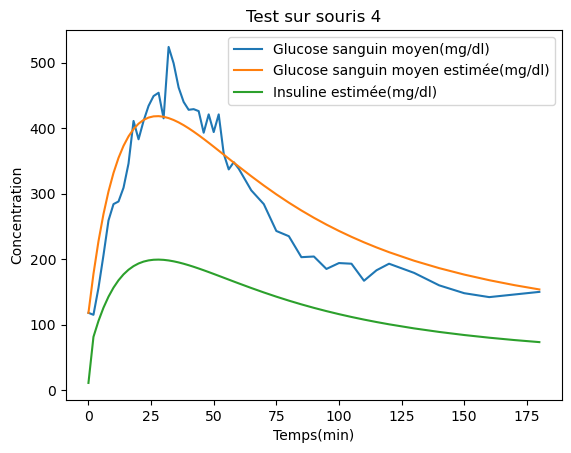

Optimization terminated successfully.
         Current function value: 35499.010336
         Iterations: 97
         Function evaluations: 174
Optimization terminated successfully.
         Current function value: 35499.010336
         Iterations: 97
         Function evaluations: 174
[7.11867867e-03 1.00673151e-10 9.00544816e-02 1.88802960e+00
 4.47906168e+00]


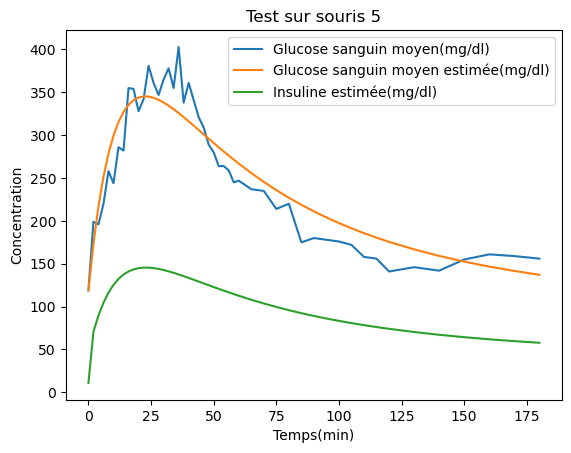

Optimization terminated successfully.
         Current function value: 86498.868415
         Iterations: 97
         Function evaluations: 208
Optimization terminated successfully.
         Current function value: 86498.868415
         Iterations: 97
         Function evaluations: 208
[6.15412236e-03 8.31184238e-11 6.33088351e-02 2.32367081e+00
 4.70250660e+00]


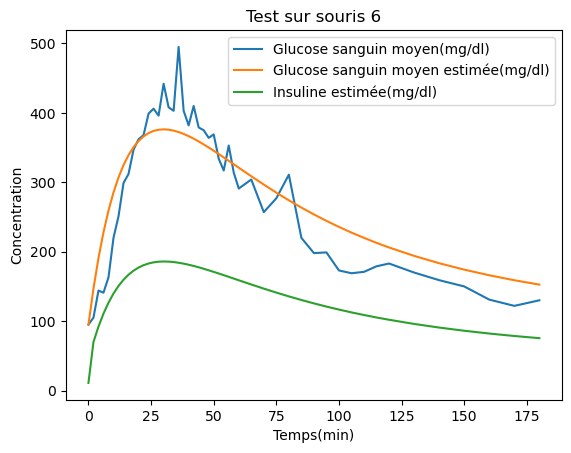

[6.95602026e-03 8.22855893e-11 5.91090219e-02 2.15693747e+00
 5.47495997e+00]


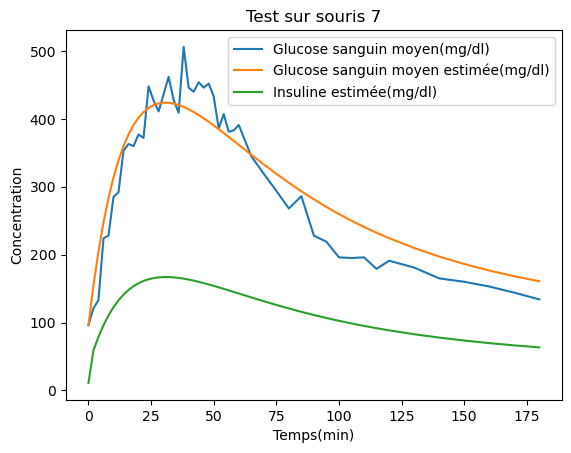

Optimization terminated successfully.
         Current function value: 46421.673158
         Iterations: 83
         Function evaluations: 160
Optimization terminated successfully.
         Current function value: 46421.673158
         Iterations: 83
         Function evaluations: 160
[1.08114994e-02 9.26718105e-11 1.20780637e-01 1.80504462e+00
 3.14385856e+00]


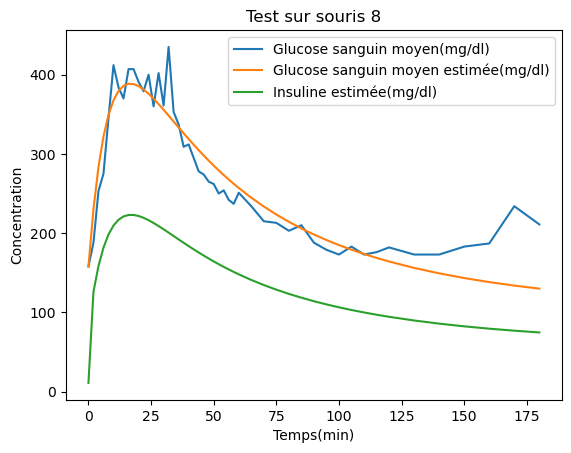

Optimization terminated successfully.
         Current function value: 17513.894376
         Iterations: 94
         Function evaluations: 178
Optimization terminated successfully.
         Current function value: 17513.894376
         Iterations: 94
         Function evaluations: 178
[6.20345077e-03 7.93446389e-11 6.83179216e-02 2.60798217e+00
 4.57184618e+00]


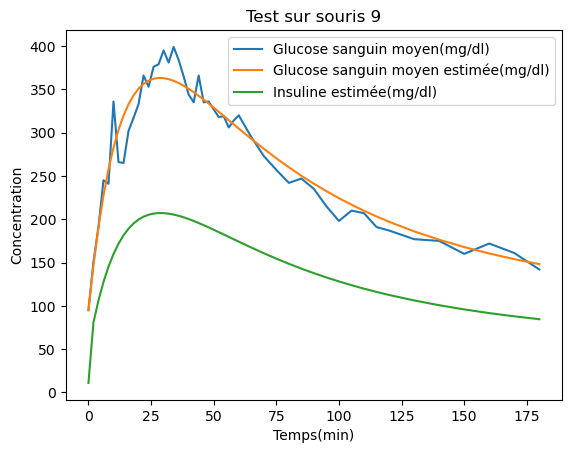

Optimization terminated successfully.
         Current function value: 32506.475763
         Iterations: 100
         Function evaluations: 177
Optimization terminated successfully.
         Current function value: 32506.475763
         Iterations: 100
         Function evaluations: 177
[6.93158641e-03 9.01347030e-11 8.63105624e-02 1.94546025e+00
 4.96020447e+00]


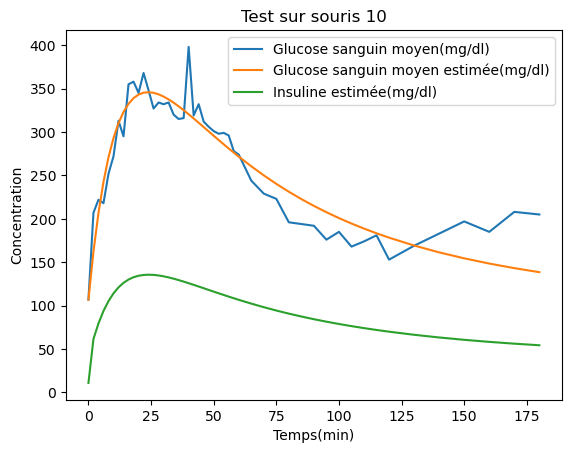

In [165]:
#Ici, on va supposer que k est fixé : la vitesse de sortie

#Ici  on va tester la fixation de k : donc on suppose une vitesse d'absorption initiale identique chez la souris
#Paramètres
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= 8e-11
c= 0.12
d= 1.5
e= 5.1

b= 8e-11
c= 0.10
d= 1.7
e= 4


para = [U0,b,c,d,e]

def av_model_k_fix(y,t,U0,b,c,d,e):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    k = 1e-2
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_k_fix(param,obs,t,y0):
    U0,b,c,d,e= param
    P = odeint(av_model_k_fix,y0,t,args=(U0,b,c,d,e,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0) + 1e8*(b<0) +1e8*(c<0)+1e8*(d<0) + 1e8*(e<0)


for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p1 = fmin(distance_av_k_fix,para,args=(data[i],t,y0))
    p = fmin(distance_av_k_fix,para,args=(data[i],t,y0))
    print(p)
    
    #P = odeint(av_model_k_fix,y0,t,args=(params_moy[0],params_moy[2],params_moy[3],params_moy[4],params_moy[5])).T
    Pestim = odeint(av_model_k_fix,y0,t,args=(p[0],p[1],p[2],p[3],p[4])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

Optimization terminated successfully.
         Current function value: 29881.502988
         Iterations: 77
         Function evaluations: 142
Optimization terminated successfully.
         Current function value: 29881.502988
         Iterations: 77
         Function evaluations: 142
[6.92068039e-03 7.60553867e-11 7.30130624e-02 2.67396145e+00]


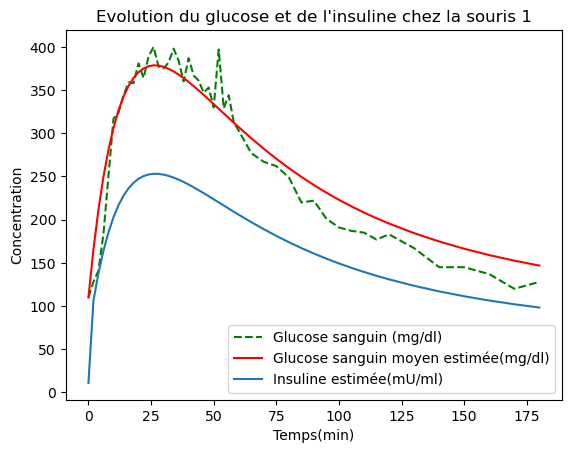

Optimization terminated successfully.
         Current function value: 50623.724467
         Iterations: 70
         Function evaluations: 135
Optimization terminated successfully.
         Current function value: 50623.724467
         Iterations: 70
         Function evaluations: 135
[5.89291145e-03 9.68472618e-11 5.87031238e-02 2.24685525e+00]


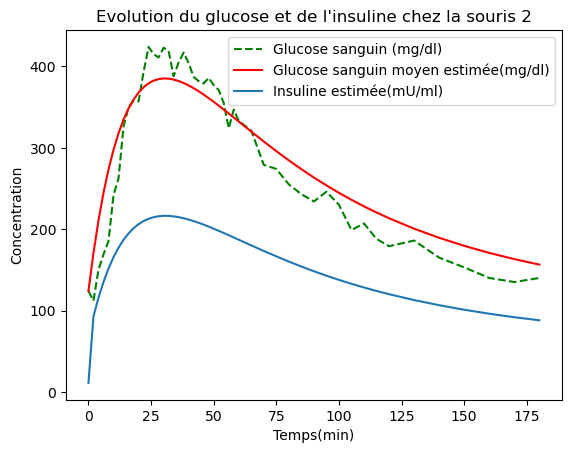

Optimization terminated successfully.
         Current function value: 105655.204436
         Iterations: 90
         Function evaluations: 157
Optimization terminated successfully.
         Current function value: 105655.204436
         Iterations: 90
         Function evaluations: 157
[5.21863177e-03 9.84807907e-11 4.43110892e-02 2.14430766e+00]


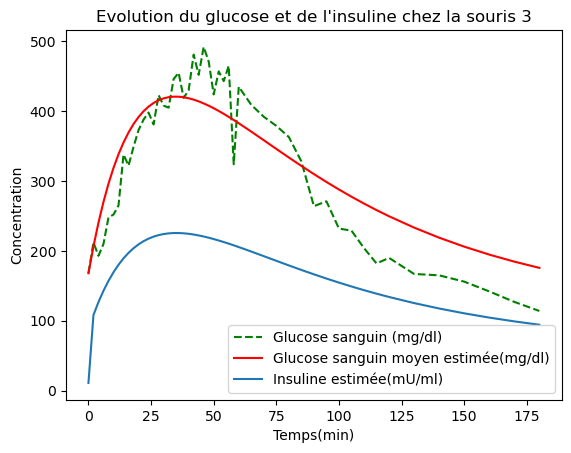

Optimization terminated successfully.
         Current function value: 95184.700608
         Iterations: 80
         Function evaluations: 143
Optimization terminated successfully.
         Current function value: 95184.700608
         Iterations: 80
         Function evaluations: 143
[7.44662252e-03 9.77554364e-11 6.68826989e-02 2.39461170e+00]


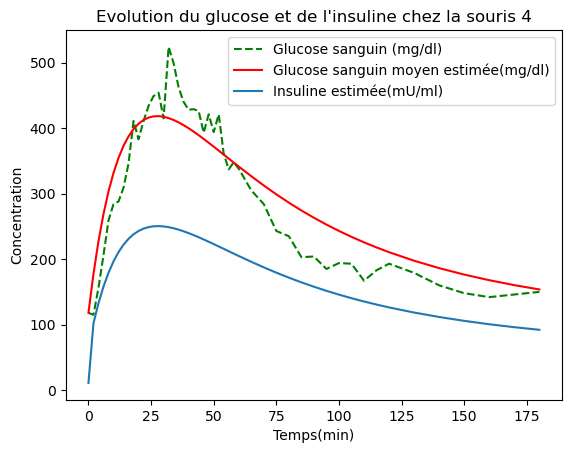

Optimization terminated successfully.
         Current function value: 35499.016823
         Iterations: 73
         Function evaluations: 137
Optimization terminated successfully.
         Current function value: 35499.016823
         Iterations: 73
         Function evaluations: 137
[7.11873426e-03 9.53642641e-11 9.00544907e-02 2.23467272e+00]


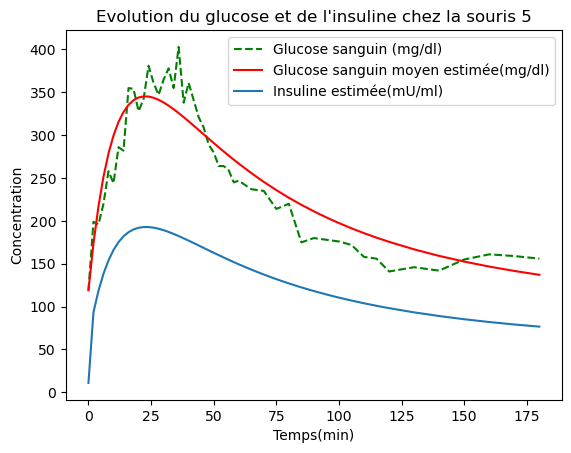

Optimization terminated successfully.
         Current function value: 86498.882900
         Iterations: 80
         Function evaluations: 143
Optimization terminated successfully.
         Current function value: 86498.882900
         Iterations: 80
         Function evaluations: 143
[6.15437848e-03 1.01844441e-10 6.33108642e-02 2.32326414e+00]


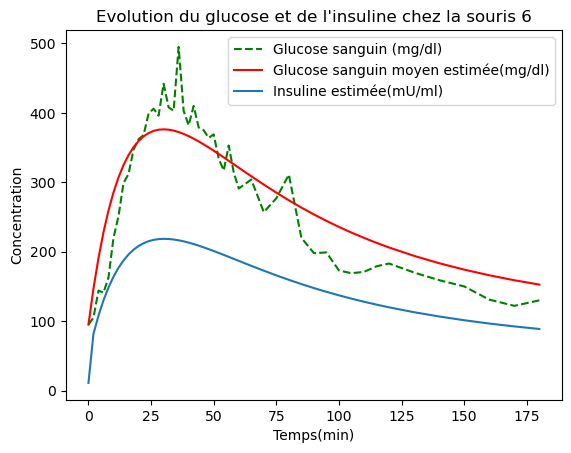

Optimization terminated successfully.
         Current function value: 65364.037268
         Iterations: 91
         Function evaluations: 173
Optimization terminated successfully.
         Current function value: 65364.037268
         Iterations: 91
         Function evaluations: 173
[6.95678673e-03 9.31718549e-11 5.91146045e-02 2.04059477e+00]


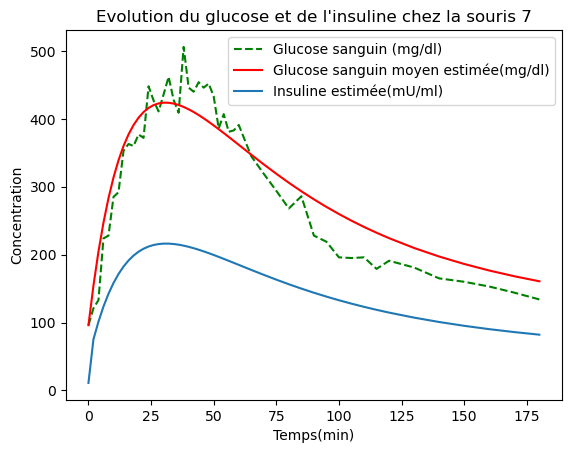

Optimization terminated successfully.
         Current function value: 46421.665465
         Iterations: 84
         Function evaluations: 162
Optimization terminated successfully.
         Current function value: 46421.665465
         Iterations: 84
         Function evaluations: 162
[1.08115481e-02 8.40113244e-11 1.20781053e-01 1.43773753e+00]


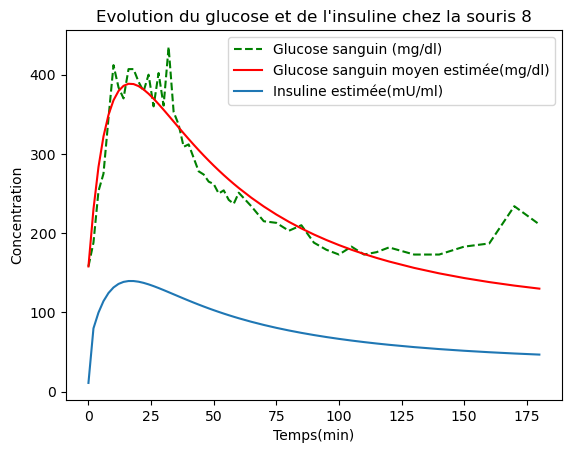

Optimization terminated successfully.
         Current function value: 17513.894650
         Iterations: 77
         Function evaluations: 137
Optimization terminated successfully.
         Current function value: 17513.894650
         Iterations: 77
         Function evaluations: 137
[6.20342589e-03 9.65291948e-11 6.83172782e-02 2.03145248e+00]


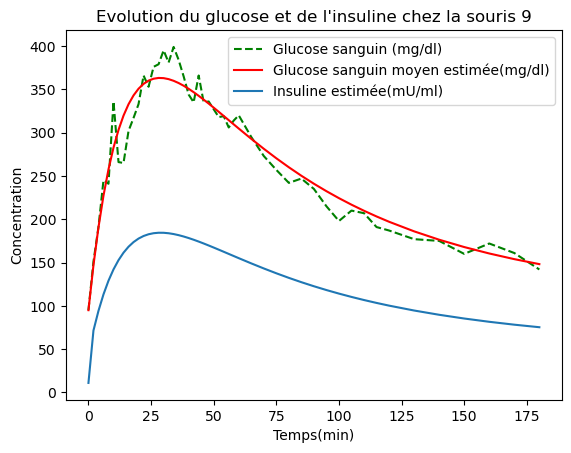

Optimization terminated successfully.
         Current function value: 32506.474897
         Iterations: 77
         Function evaluations: 142
Optimization terminated successfully.
         Current function value: 32506.474897
         Iterations: 77
         Function evaluations: 142
[6.93163389e-03 8.32387149e-11 8.63111858e-02 2.25653237e+00]


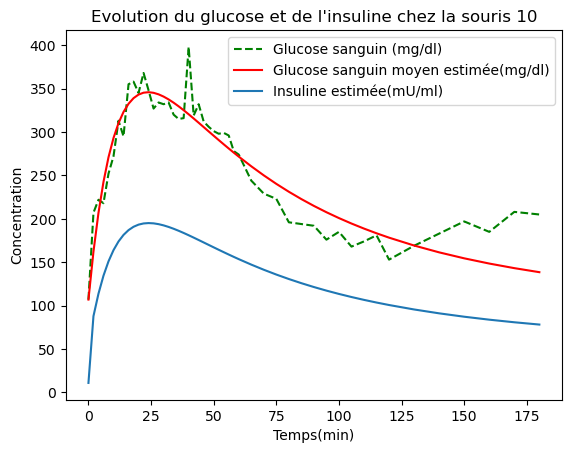

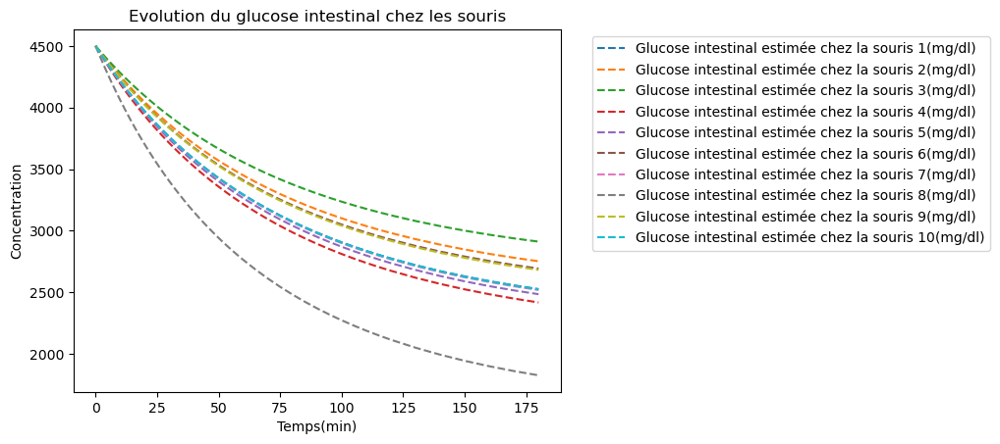

In [263]:
#Ici, on va supposer que k est fixé : la vitesse de sortie

#Ici  on va tester la fixation de k : donc on suppose une vitesse d'absorption initiale identique chez la souris
#Paramètres
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= 8e-11
c= 0.12
d= 1.5
e= 5.1

b= 8e-11
c= 0.10
d= 1.7
e= 4


para = [U0,b,c,d]

def av_model_ke_fix(y,t,U0,b,c,d):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    k = 1e-2
    e = 4
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_ke_fix(param,obs,t,y0):
    U0,b,c,d= param
    P = odeint(av_model_ke_fix,y0,t,args=(U0,b,c,d,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0) + 1e8*(b<0) +1e8*(c<0)+1e8*(d<0) 

arrke = np.zeros((13,4))
peske=[]

for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p1 = fmin(distance_av_ke_fix,para,args=(data[i],t,y0))
    p = fmin(distance_av_ke_fix,para,args=(data[i],t,y0))
    print(p)
    
    arrke[i-1] = p
    
    #P = odeint(av_model_k_fix,y0,t,args=(params_moy[0],params_moy[2],params_moy[3],params_moy[4],params_moy[5])).T
    Pestim = odeint(av_model_ke_fix,y0,t,args=(p[0],p[1],p[2],p[3])).T

    plt.plot(t,data[i],'g--',label="Glucose sanguin (mg/dl)")
    plt.plot(t,Pestim[1],'r',label="Glucose sanguin moyen estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mU/ml)")


    peske.append(Pestim[0])
    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Evolution du glucose et de l'insuline chez la souris "+str(i))
    plt.legend()
    plt.savefig("kefix"+str(i)+".png")
    plt.show()

for i in range(10):
    plt.plot(t,peske[i],'--',label="Glucose intestinal estimée chez la souris "+str(i+1)+"(mg/dl)")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose intestinal chez les souris")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.savefig("keintest"+str(i)+".png")
plt.show()


Optimization terminated successfully.
         Current function value: 19080.832891
         Iterations: 75
         Function evaluations: 138
Optimization terminated successfully.
         Current function value: 19080.831177
         Iterations: 97
         Function evaluations: 191
[6.73597236e-03 8.42392117e-11 6.92383045e-02 1.80250030e+00]


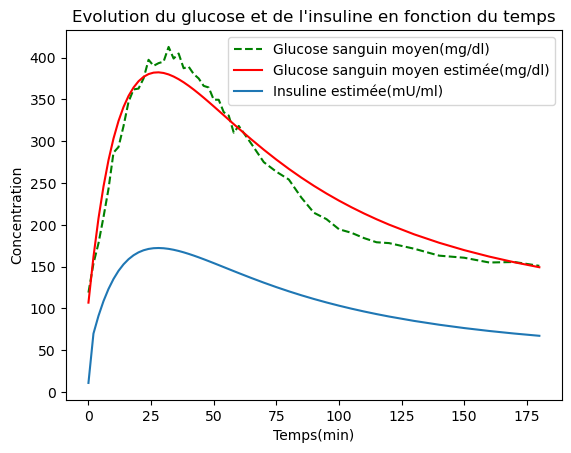

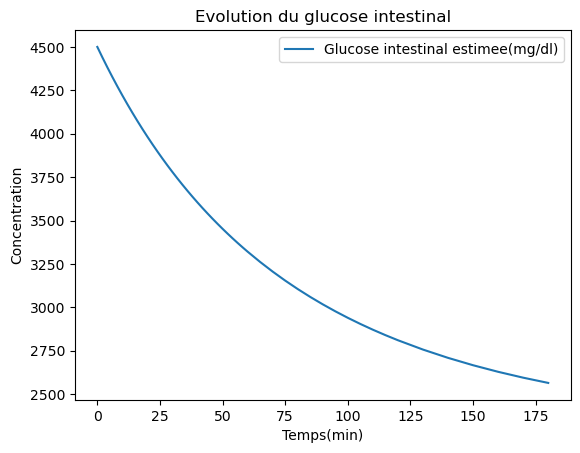

In [175]:
param_n = [U0,b,c,d]

#estimation des paramètres
#P = odeint(av_model,y0,t,args=(U0,k,b,c,d,e)).T

p1= fmin(distance_av_ke_fix,param_n,args=(data[11],t,y0))
p= fmin(distance_av_ke_fix,p1,args=(data[11],t,y0))

print(p)


PestimM = odeint(av_model_ke_fix,y0,t,args=(p[0],p[1],p[2],p[3])).T

plt.plot(t,data[11],'g--',label="Glucose sanguin moyen(mg/dl)")
plt.plot(t,PestimM[1],'r',label="Glucose sanguin moyen estimée(mg/dl)")
#plt.plot(t,P[2],label="Insuline mg/dl)")
plt.plot(t,PestimM[2],label="Insuline estimée(mU/ml)")


plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose et de l'insuline en fonction du temps")
plt.legend()
plt.savefig("glvke1.png")
plt.show()

plt.plot(t,PestimM[0],label="Glucose intestinal estimee(mg/dl)")


plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose intestinal")
plt.legend()
plt.savefig("glvke2.png")
plt.show()

for i in range(4):
    arrke[10,i] = p[i] 

In [178]:
art = arrke.T

for i in range(4):
    arrke[11,i] = art[i].mean()
    arrke[12,i] = art[i].std()
index1 = ["U0","b","c","d"]
index2 = ["souris 1","souris 2","souris 3","souris 4","souris 5","souris 6","souris 7","souris 8","souris 9","souris 10","souris moyenne","moyenne","écart-type"]
df = pd.DataFrame(arrke, index = index2,columns = index1)

df

,U0,b,c,d
souris 1,0.006921,7.605539e-11,0.073013,2.673961
souris 2,0.005893,9.684726e-11,0.058703,2.246855
souris 3,0.005219,9.848079e-11,0.044311,2.144308
souris 4,0.007447,9.775544e-11,0.066883,2.394612
souris 5,0.007119,9.536426e-11,0.090054,2.234673
souris 6,0.006154,1.018444e-10,0.063311,2.323264
souris 7,0.006957,9.317185e-11,0.059115,2.040595
souris 8,0.010812,8.401132e-11,0.120781,1.437738
souris 9,0.006203,9.652919e-11,0.068317,2.031452
souris 10,0.006932,8.323871e-11,0.086311,2.256532


In [156]:
#Ici, on va supposer que d est fixé 

#Ici  on va tester la fixation de d
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= 8e-11
c= 0.12
d= params_moy1[4]
e= 5.1

para = [U0,k,b,c,e]

def av_model_d_fix(y,t,U0,k,b,c,e):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    d = params_moy2[4]
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_d_fix(param,obs,t,y0):
    U0,k,b,c,e= param
    P = odeint(av_model_d_fix,y0,t,args=(U0,k,b,c,e,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0) + 1e8*(k<0) +1e8*(b<0)+1e8*(c<0) + 1e8*(e<0)


for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p = fmin(distance_av_d_fix,para,args=(data[i],t,y0))
    print(p)
    
    P = odeint(av_model_d_fix,y0,t,args=(U0,k,b,c,e)).T
    Pestim = odeint(av_model_d_fix,y0,t,args=(p[0],p[1],p[2],p[3],p[4])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

NameError: name 'params_moy1' is not defined

Optimization terminated successfully.
         Current function value: 15914.203654
         Iterations: 210
         Function evaluations: 356
[0.00580268 0.02332871 0.04044429 1.33579367 0.1723996 ]


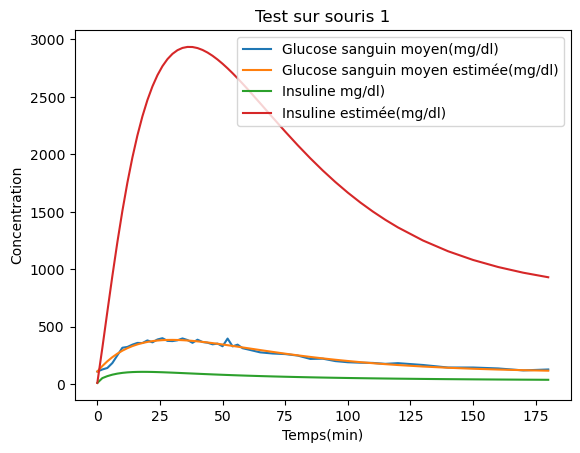

Optimization terminated successfully.
         Current function value: 32015.807679
         Iterations: 252
         Function evaluations: 441
[0.00509792 0.02665363 0.02899856 0.02595938 2.80252982]


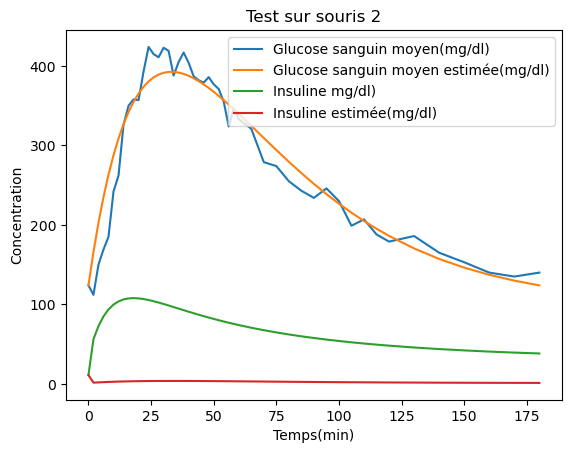

Optimization terminated successfully.
         Current function value: 71775.806156
         Iterations: 164
         Function evaluations: 316
[4.67347265e-03 2.39249081e-02 2.40467549e-02 1.23586750e-01
 6.30189400e+00]


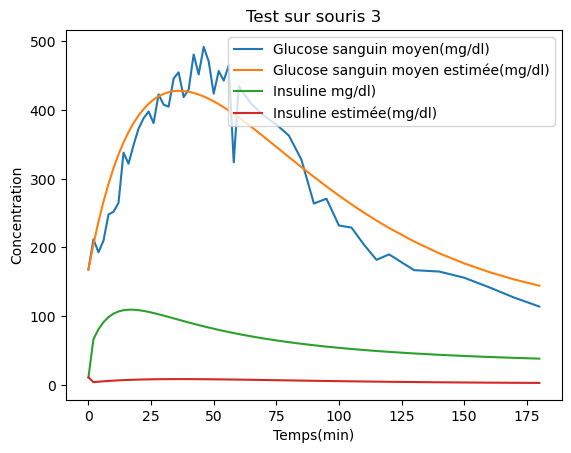

Optimization terminated successfully.
         Current function value: 59138.585970
         Iterations: 238
         Function evaluations: 408
[6.48897082e-03 3.01420571e-02 3.18495410e-02 7.34797688e-03
 6.95359719e+00]


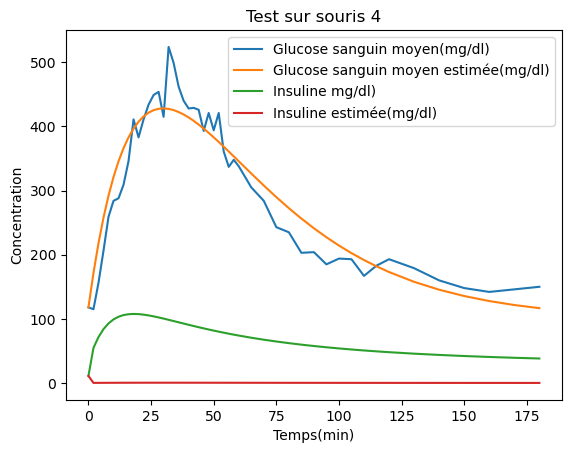

Optimization terminated successfully.
         Current function value: 25707.643955
         Iterations: 138
         Function evaluations: 250
[5.97498258e-03 2.02544044e-02 5.67962456e-02 1.14773856e+00
 6.27941396e+00]


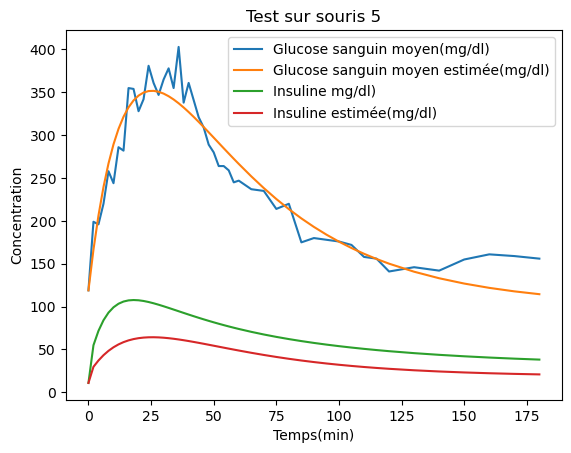

Optimization terminated successfully.
         Current function value: 55615.173370
         Iterations: 177
         Function evaluations: 294
[0.00553499 0.02900804 0.03043938 2.85620257 0.65641388]


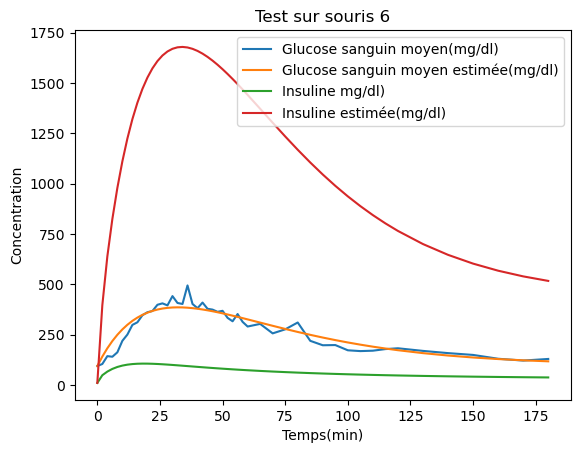

[6.24945797e-03 2.39232290e-02 3.32573976e-02 7.20627490e-03
 1.15340103e-06]


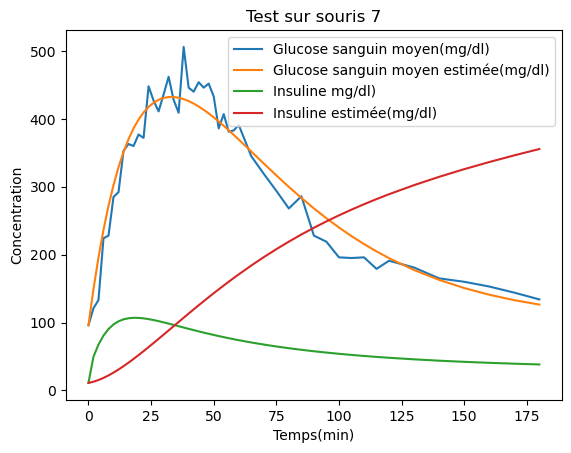

Optimization terminated successfully.
         Current function value: 46064.627812
         Iterations: 102
         Function evaluations: 193
[0.01121084 0.00844871 0.12876197 1.4178076  5.29708865]


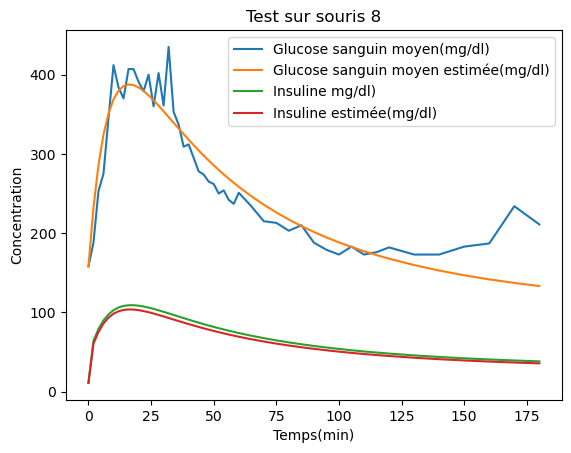

Optimization terminated successfully.
         Current function value: 16032.853229
         Iterations: 147
         Function evaluations: 250
[5.83295407e-03 1.31288560e-02 5.78893971e-02 1.51111264e+00
 8.04387142e+00]


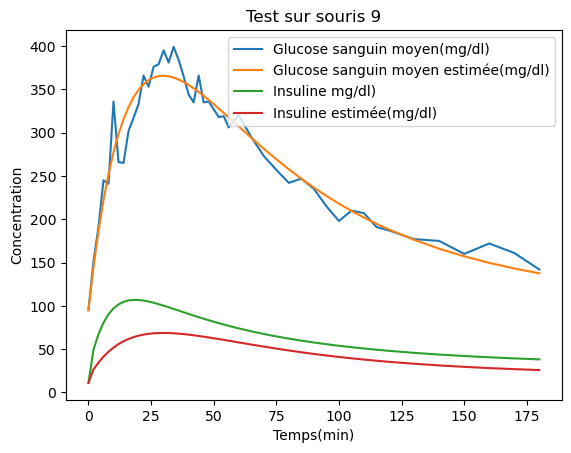

Optimization terminated successfully.
         Current function value: 32412.619515
         Iterations: 115
         Function evaluations: 203
[0.00707211 0.00921827 0.08997974 1.98321564 6.32184989]


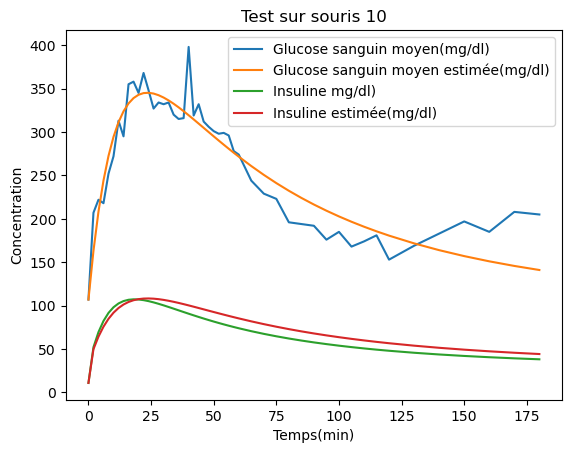

In [20]:
#Ici  on va tester la fixation de b
#dgs**2 pour fixer insuline
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= params_moy2[2]
c= 0.12
d= 1.5
e= 5.1

para = [U0,k,c,d,e]

def av_model_b_fix(y,t,U0,k,c,d,e):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    b = params_moy2[2]
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_b_fix(param,obs,t,y0):
    U0,k,c,d,e= param
    P = odeint(av_model_b_fix,y0,t,args=(U0,k,c,d,e,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0) + 1e8*(k<0) +1e8*(c<0)+1e8*(d<0) + 1e8*(e<0)


for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p = fmin(distance_av_b_fix,para,args=(data[i],t,y0))
    print(p)
    
    P = odeint(av_model_b_fix,y0,t,args=(U0,k,c,d,e)).T
    Pestim = odeint(av_model_b_fix,y0,t,args=(p[0],p[1],p[2],p[3],p[4])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

Optimization terminated successfully.
         Current function value: 15914.210361
         Iterations: 141
         Function evaluations: 245
[0.00580266 0.02332916 0.04044379 3.62133146]


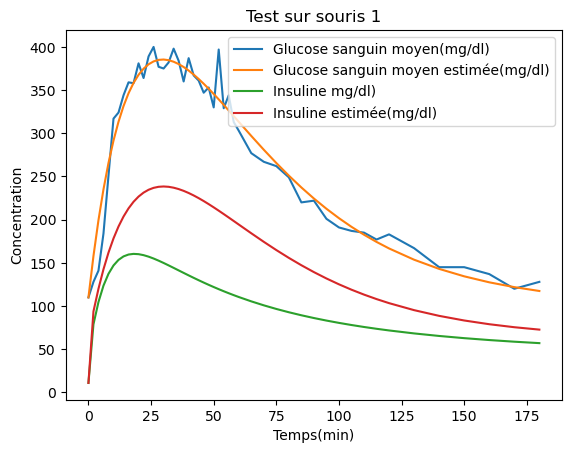

Optimization terminated successfully.
         Current function value: 32015.810760
         Iterations: 154
         Function evaluations: 272
[5.09794831e-03 2.66530951e-02 2.89992862e-02 1.06201783e+01]


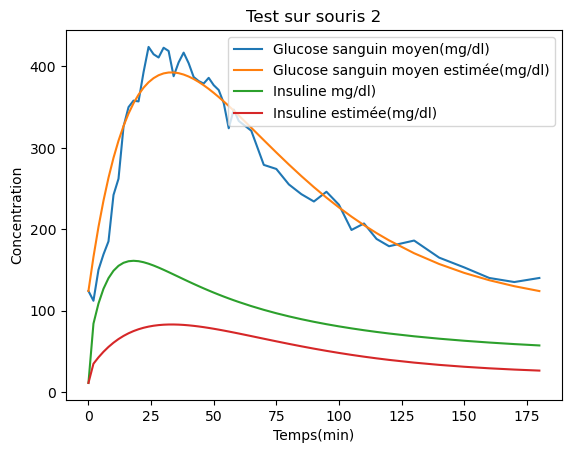

Optimization terminated successfully.
         Current function value: 71775.822761
         Iterations: 152
         Function evaluations: 275
[4.67330531e-03 2.39235907e-02 2.40452084e-02 1.08339146e+01]


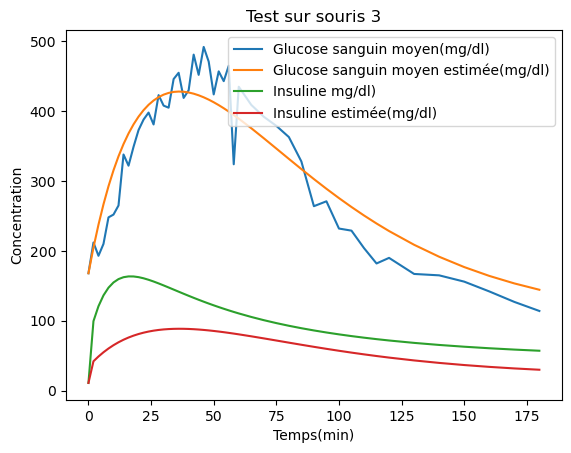

Optimization terminated successfully.
         Current function value: 59138.623830
         Iterations: 138
         Function evaluations: 238
[0.00648894 0.03014177 0.0318496  4.96315532]


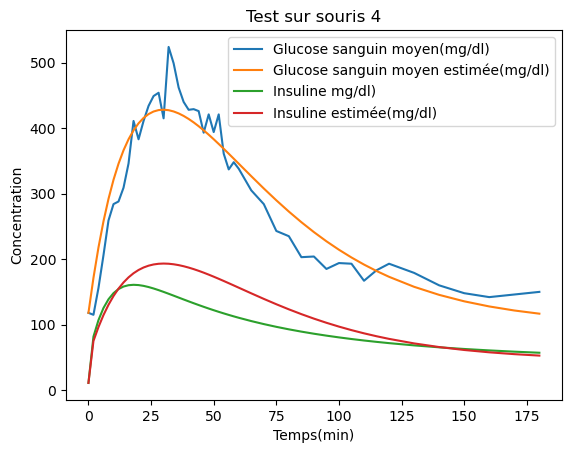

Optimization terminated successfully.
         Current function value: 25707.641724
         Iterations: 130
         Function evaluations: 253
[0.00597497 0.02025443 0.05679569 5.32785377]


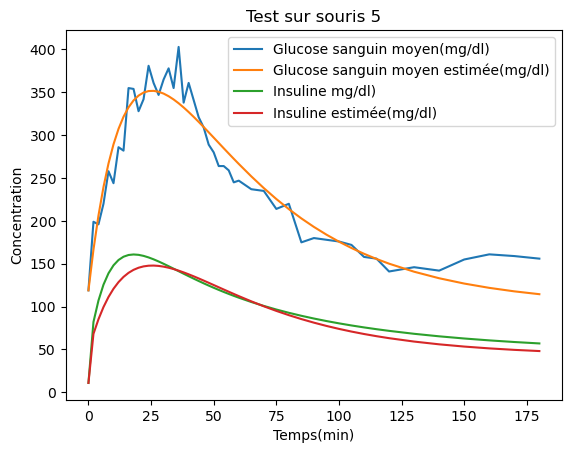

Optimization terminated successfully.
         Current function value: 55615.162843
         Iterations: 244
         Function evaluations: 427
[5.53501489e-03 2.90095570e-02 3.04380449e-02 7.54194392e+00]


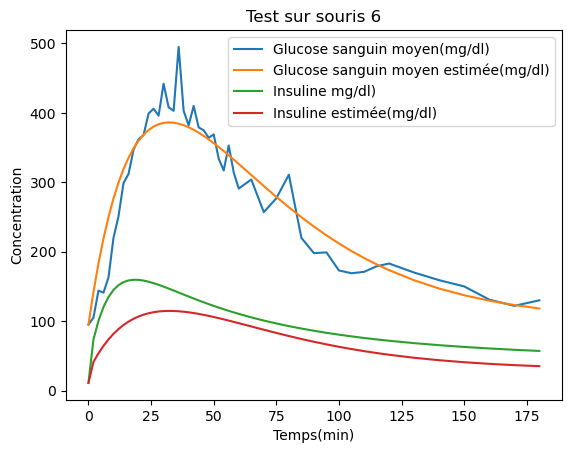

[6.25100580e-03 2.80977314e-02 2.91349038e-02 1.61335086e+01]


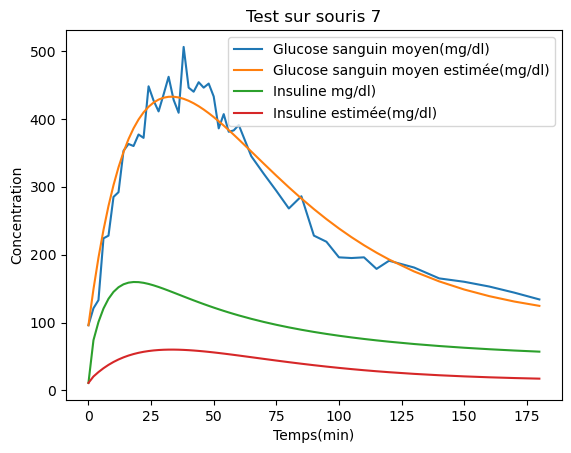

Optimization terminated successfully.
         Current function value: 46064.628075
         Iterations: 95
         Function evaluations: 183
[0.01120984 0.0084498  0.1287512  5.26261092]


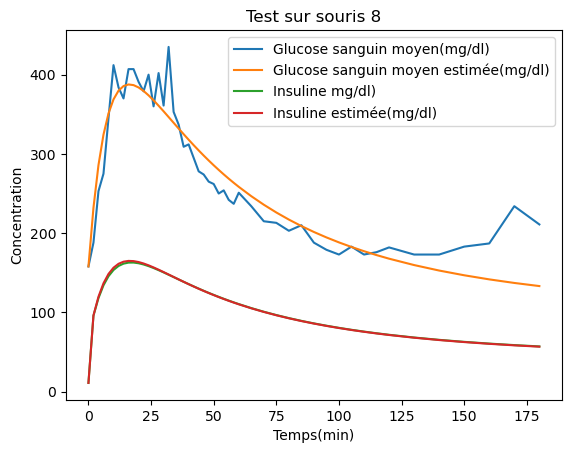

[5.83314168e-03 1.31282562e-02 5.78928034e-02 7.20994296e+00]


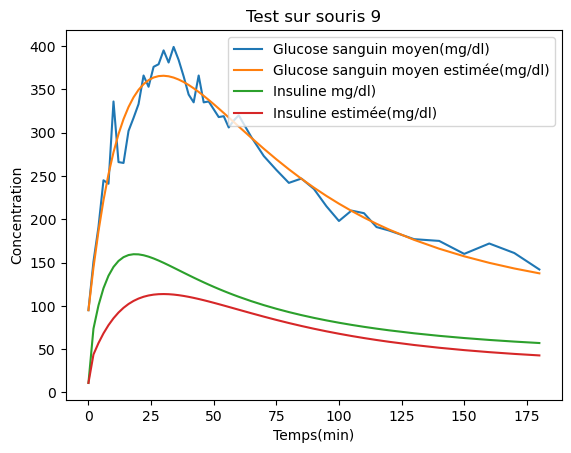

Optimization terminated successfully.
         Current function value: 32412.621586
         Iterations: 112
         Function evaluations: 202
[0.00707215 0.00921836 0.08997961 7.06101612]


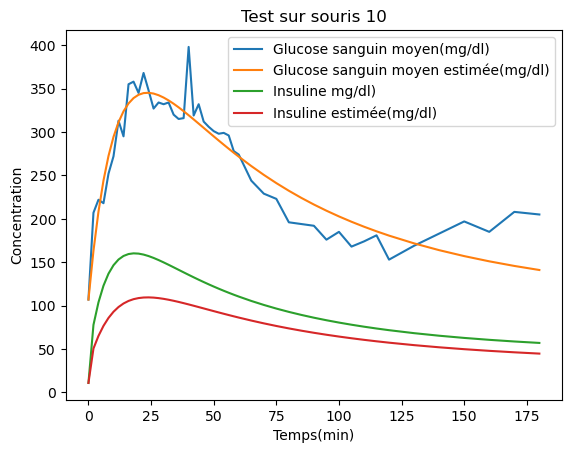

In [21]:
#fixation de b et d

G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= params_moy2[2]
c= 0.12
d= params_moy2[4]
e= 5.1

para = [U0,k,c,e]

def av_model_db_fix(y,t,U0,k,c,e):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    b = params_moy2[2]
    d = params_moy2[4]
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_db_fix(param,obs,t,y0):
    U0,k,c,e= param
    P = odeint(av_model_db_fix,y0,t,args=(U0,k,c,e,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0) + 1e8*(k<0) +1e8*(c<0)+ 1e8*(e<0)


for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p = fmin(distance_av_db_fix,para,args=(data[i],t,y0))
    print(p)
    
    P = odeint(av_model_db_fix,y0,t,args=(U0,k,c,e)).T
    Pestim = odeint(av_model_db_fix,y0,t,args=(p[0],p[1],p[2],p[3])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

[0.00580259 0.02332832 0.04044258 2.17961567]


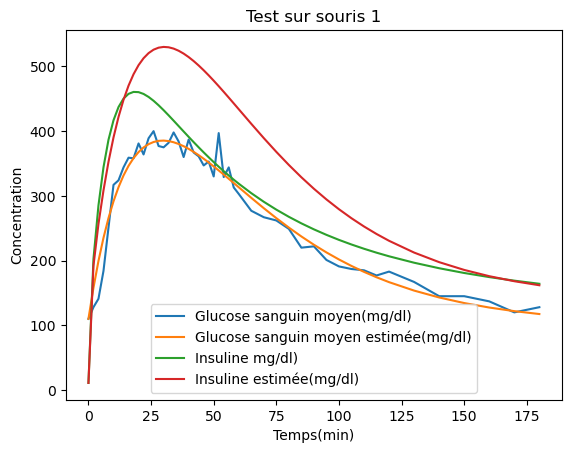

Optimization terminated successfully.
         Current function value: 32015.812751
         Iterations: 406
         Function evaluations: 682
[5.09797072e-03 2.66533611e-02 2.89989920e-02 3.80460280e-06]


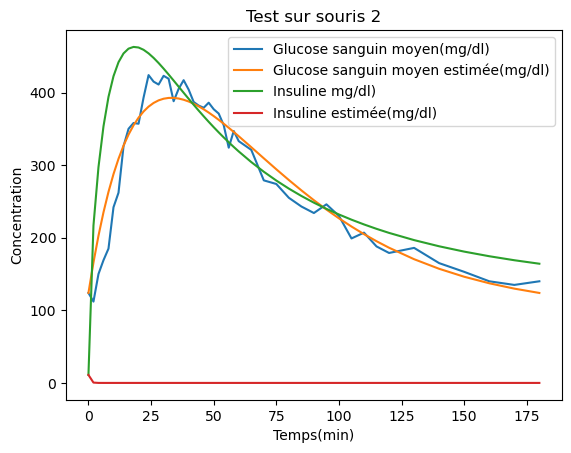

Optimization terminated successfully.
         Current function value: 71961.034995
         Iterations: 198
         Function evaluations: 348
[4.67353029e-03 2.25336562e-02 2.51925174e-02 9.34427395e-08]


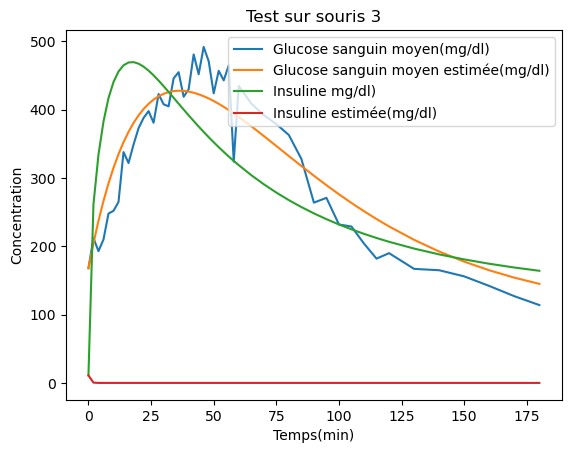

Optimization terminated successfully.
         Current function value: 59139.350332
         Iterations: 266
         Function evaluations: 577
[0.00648892 0.03014221 0.03184711 1.94721903]


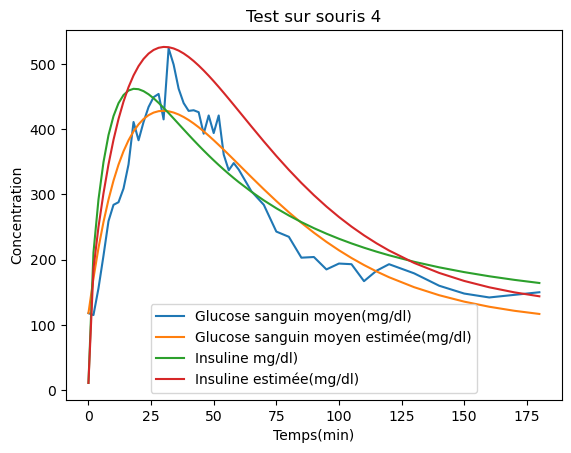

Optimization terminated successfully.
         Current function value: 25707.846776
         Iterations: 223
         Function evaluations: 510
[0.005975   0.02025604 0.05679138 1.81862939]


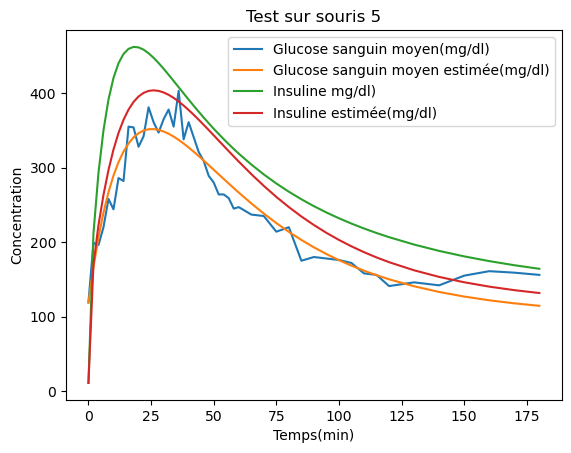

Optimization terminated successfully.
         Current function value: 55615.643624
         Iterations: 173
         Function evaluations: 309
[0.00553506 0.02900955 0.03043555 2.96119482]


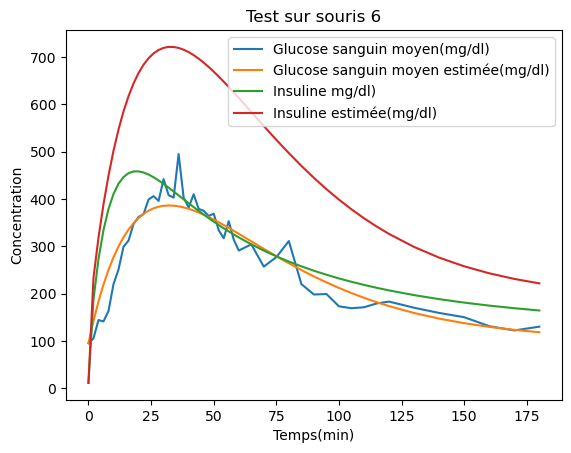

Optimization terminated successfully.
         Current function value: 34892.138936
         Iterations: 224
         Function evaluations: 373
[0.00625091 0.02809669 0.02913523 0.07886234]


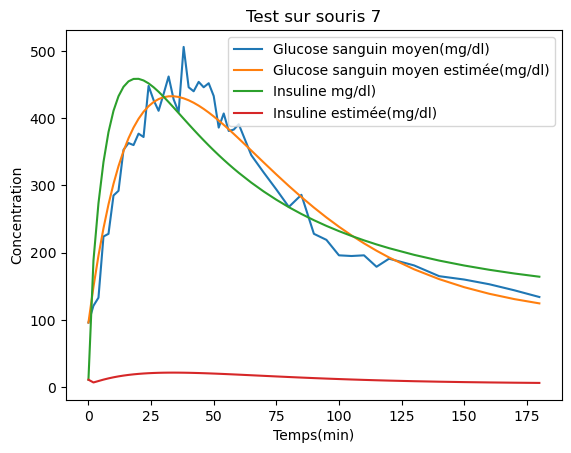

Optimization terminated successfully.
         Current function value: 46064.832168
         Iterations: 76
         Function evaluations: 134
[0.01121073 0.00844837 0.12876209 1.95972271]


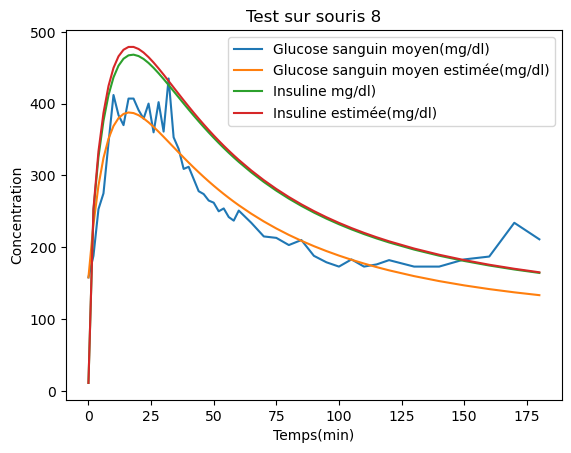

Optimization terminated successfully.
         Current function value: 16032.974408
         Iterations: 91
         Function evaluations: 164
[0.0058329  0.01312888 0.05788622 2.82723682]


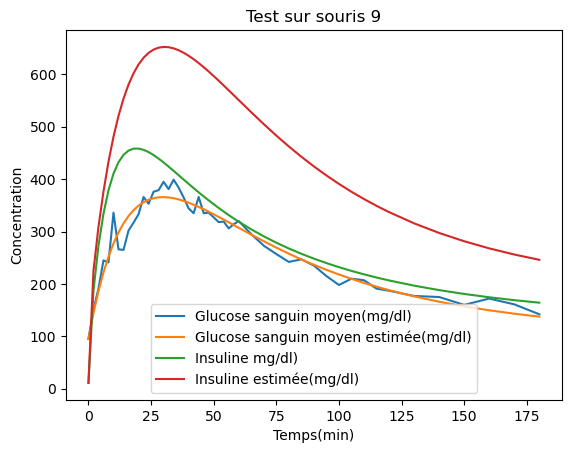

Optimization terminated successfully.
         Current function value: 32412.799946
         Iterations: 96
         Function evaluations: 174
[0.00707167 0.00921831 0.08997268 2.57341629]


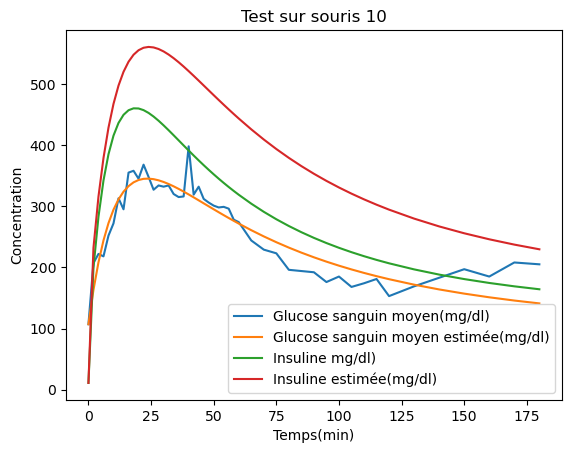

In [157]:
#Ici  on va tester la fixation de k et e
G0 = 4500
y0 = [G0, data[11,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2
b= params_moy2[2]
c= 0.12
d= 2
e= params_moy2[5]

para = [U0,k,c,d]

def av_model_eb_fix(y,t,U0,k,c,d):
    Gi = y[0]
    Gs = y[1]
    I = y[2]
    Gb = 100
    b = params_moy2[2]
    e = params_moy2[5]
    dgidt = -(U0*np.exp(-k*t))*Gi
    dgsdt = (U0*np.exp(-k*t))*Gi -b*I*Gs - c*max(0,Gs-Gb)
    didt = d*Gs-e*I
    return dgidt,dgsdt,didt

def distance_av_eb_fix(param,obs,t,y0):
    U0,k,c,d= param
    P = odeint(av_model_eb_fix,y0,t,args=(U0,k,c,d,)).T
    su =  np.sum((P[1]-obs)**2)
    return su + 1e8*(U0<0) + 1e8*(k<0) +1e8*(c<0)+1e8*(d<0)


for i in range(1,nbs+1):
    y0 = [G0, data[i,0],11]
    p = fmin(distance_av_eb_fix,para,args=(data[i],t,y0))
    print(p)
    
    P = odeint(av_model_eb_fix,y0,t,args=(U0,k,c,d)).T
    Pestim = odeint(av_model_eb_fix,y0,t,args=(p[0],p[1],p[2],p[3])).T

    plt.plot(t,data[i],label="Glucose sanguin moyen(mg/dl)")
    plt.plot(t,Pestim[1],label="Glucose sanguin moyen estimée(mg/dl)")
    plt.plot(t,P[2],label="Insuline mg/dl)")
    plt.plot(t,Pestim[2],label="Insuline estimée(mg/dl)")


    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Test sur souris "+str(i))
    plt.legend()
    plt.show()

## 4. Modèle pathologique

Nous avons effectué la même expérience - un challenge oral de glucose - a des souris (G0 = 2500 mg/dL) sur deux groupes de souris dont un groupe de souris KO qui sont invalidées pour un gène qui affecte quelque chose en lien avec la tolérance au glucose.  


Pour des raisons de coût (et du fait qu’il y avait d’autres expérimentations) il y a beaucoup moins de points de mesure au cours du temps. Il y a deux fichiers de données un control.txt et un ko.txt. Dans ces fichiers, la première colonne correspond au temps en minute (avec une mesure contrôle à -30), puis dans chaque colonne les mesures de glycémie pour une souris en mg/dL.

(16, 6)
(15, 6)


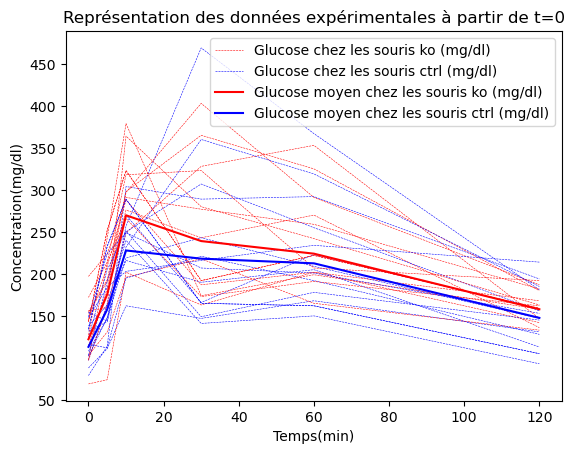

In [211]:
#Chargement des données
datact = np.loadtxt("control.txt",dtype=float).T[:,1:]
datako = np.loadtxt("ko.txt",dtype=float).T[:,1:]
nbs = 15
print(datact.shape)
print(datako.shape)

#Plot 
for i in range(1,nbs-1):
    plt.plot(datact[0],datact[i],'b--',linewidth = 0.4)
    plt.plot(datako[0],datako[i],'r--',linewidth = 0.4)
plt.plot(datact[0],datact[13],'b--',linewidth = 0.4)
plt.plot(datact[0],datako[13],'r--',linewidth = 0.4,label="Glucose chez les souris ko (mg/dl)")
plt.plot(datact[0],datact[14],'b--',linewidth = 0.4,label="Glucose chez les souris ctrl (mg/dl)")

moyko = np.zeros((6))
moyct = np.zeros((6))


datactbis = datact.T
datakobis = datako.T

for i in range(6):
    moyko[i] = datakobis[i].mean()
    moyct[i] = datactbis[i].mean()
    
plt.plot(datako[0],moyko,'r-',label="Glucose moyen chez les souris ko (mg/dl)")
plt.plot(datact[0],moyct,'b-',label="Glucose moyen chez les souris ctrl (mg/dl)")

plt.title("Représentation des données expérimentales à partir de t=0")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration(mg/dl)')
plt.legend()
plt.savefig("theopatho.png")
plt.show()


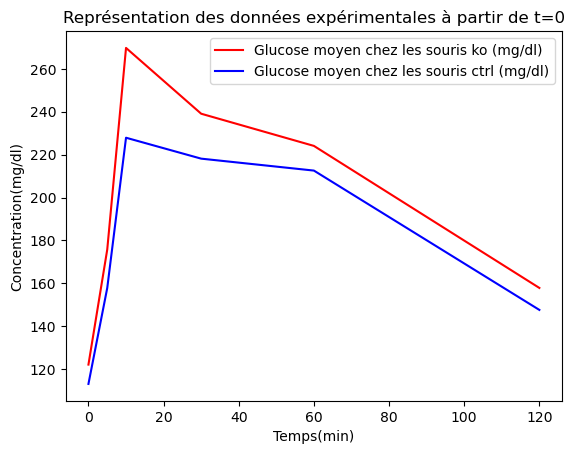

In [208]:
moyko = np.zeros((6))
moyct = np.zeros((6))


datactbis = datact.T
datakobis = datako.T

for i in range(6):
    moyko[i] = datakobis[i].mean()
    moyct[i] = datactbis[i].mean()
    
plt.plot(datako[0],moyko,'r-',label="Glucose moyen chez les souris ko (mg/dl)")
plt.plot(datact[0],moyct,'b-',label="Glucose moyen chez les souris ctrl (mg/dl)")

plt.title("Représentation des données expérimentales à partir de t=0")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration(mg/dl)')
plt.legend()
plt.savefig("theopathomoy.png")
plt.show()


En utilisant le modèle développé dans la partie précédente :  
1. trouver les paramètres décrivant les souris des groupes contrôle et KO

In [217]:
datako[0,0]

0.0

Optimization terminated successfully.
         Current function value: 2163.696440
         Iterations: 80
         Function evaluations: 148
Optimization terminated successfully.
         Current function value: 2163.696188
         Iterations: 96
         Function evaluations: 185
[5.38169950e-03 1.24534586e-10 8.69205493e-02 2.27803507e+00]


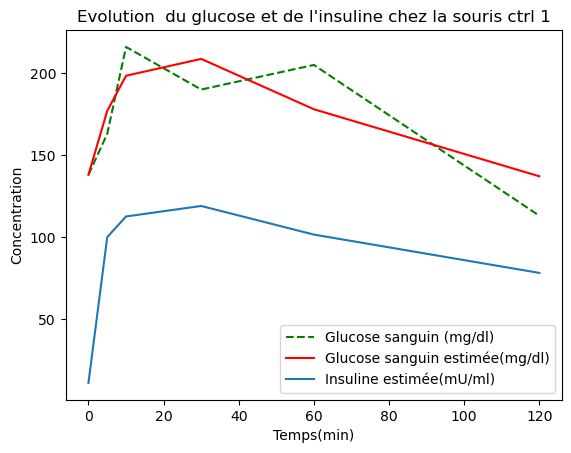

Optimization terminated successfully.
         Current function value: 1077.312111
         Iterations: 110
         Function evaluations: 219
Optimization terminated successfully.
         Current function value: 1077.312111
         Iterations: 47
         Function evaluations: 123
[2.93599108e-03 1.20613008e-10 7.40051537e-02 2.39757387e+00]


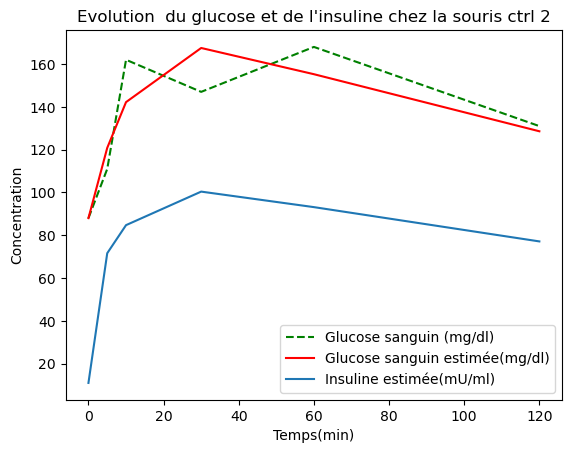

Optimization terminated successfully.
         Current function value: 3950.879195
         Iterations: 295
         Function evaluations: 521
Optimization terminated successfully.
         Current function value: 3508.713367
         Iterations: 52
         Function evaluations: 100
[1.51930009e-02 1.04087400e-18 2.94150405e-01 3.87528939e-04]


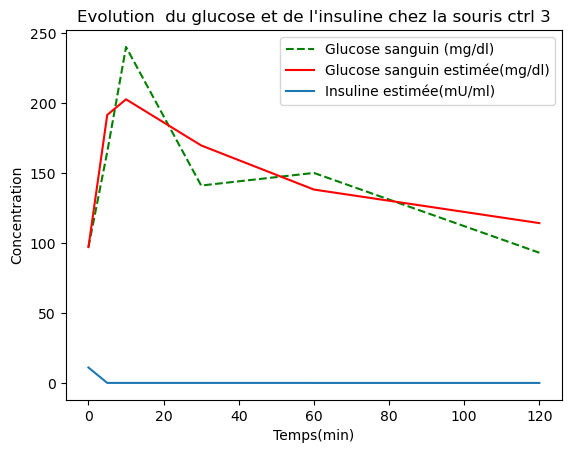

Optimization terminated successfully.
         Current function value: 9317.372630
         Iterations: 81
         Function evaluations: 142
Optimization terminated successfully.
         Current function value: 9317.372582
         Iterations: 51
         Function evaluations: 114
[8.49880616e-03 1.23195936e-10 5.49655692e-02 1.52452471e+00]


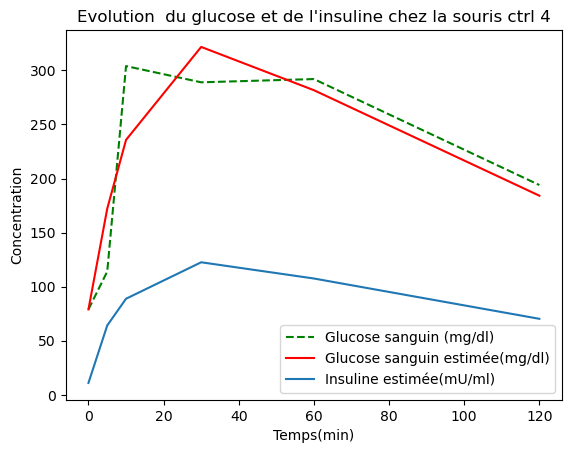

Optimization terminated successfully.
         Current function value: 18453.730454
         Iterations: 87
         Function evaluations: 153
Optimization terminated successfully.
         Current function value: 18453.728751
         Iterations: 124
         Function evaluations: 237
[8.55788662e-03 9.22376150e-11 3.88721799e-02 1.76405048e+00]


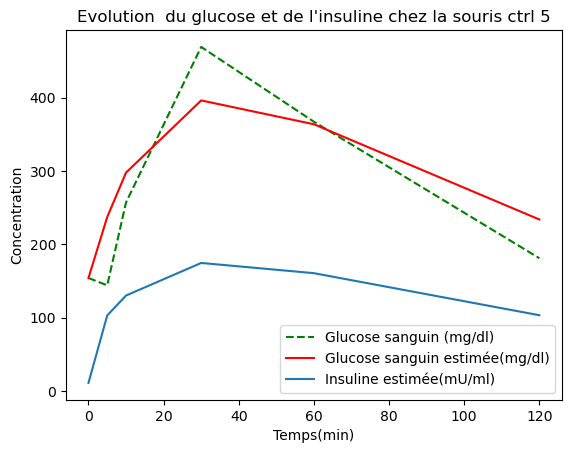

Optimization terminated successfully.
         Current function value: 2019.669856
         Iterations: 66
         Function evaluations: 122
Optimization terminated successfully.
         Current function value: 2019.669140
         Iterations: 69
         Function evaluations: 155
[7.65551146e-03 9.52126708e-11 5.95510743e-02 2.11683818e+00]


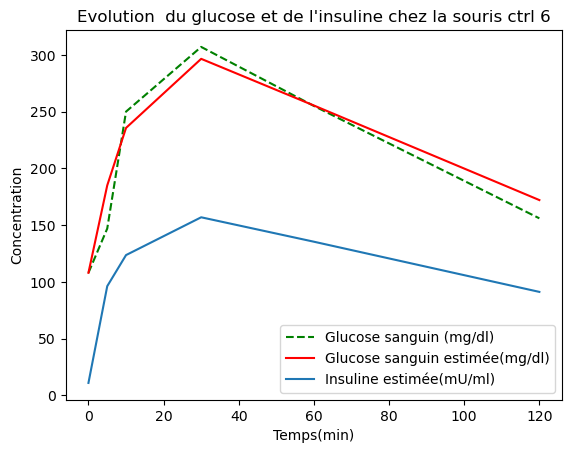

Optimization terminated successfully.
         Current function value: 2461.301119
         Iterations: 83
         Function evaluations: 157
Optimization terminated successfully.
         Current function value: 2461.301059
         Iterations: 51
         Function evaluations: 130
[4.01764254e-03 1.11958449e-10 6.07236095e-02 3.11194383e+00]


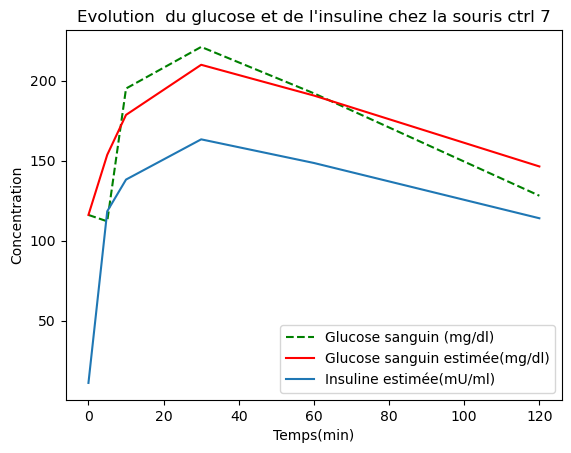

Optimization terminated successfully.
         Current function value: 524.172342
         Iterations: 64
         Function evaluations: 116
Optimization terminated successfully.
         Current function value: 524.172252
         Iterations: 64
         Function evaluations: 133
[6.47973395e-03 1.14248311e-10 7.35855535e-02 1.94048864e+00]


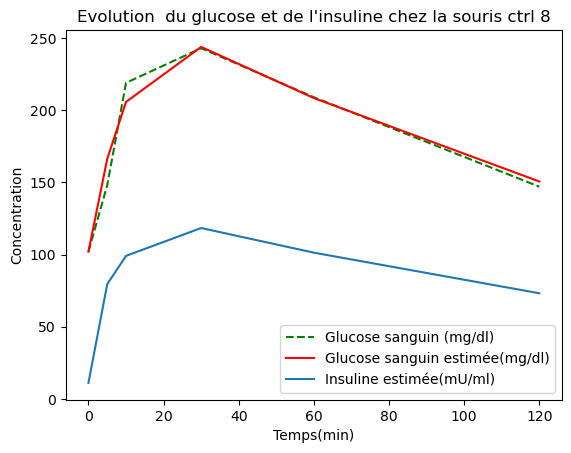

Optimization terminated successfully.
         Current function value: 4971.154062
         Iterations: 81
         Function evaluations: 151
Optimization terminated successfully.
         Current function value: 4971.153453
         Iterations: 152
         Function evaluations: 280
[6.49506058e-03 1.81893083e-16 3.88644978e-02 3.42494002e+00]


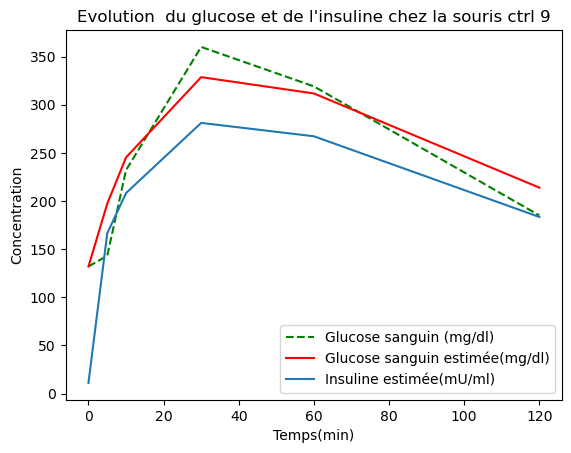

[1.19578201e-02 7.33557809e-11 1.48852678e-01 1.25582732e+00]


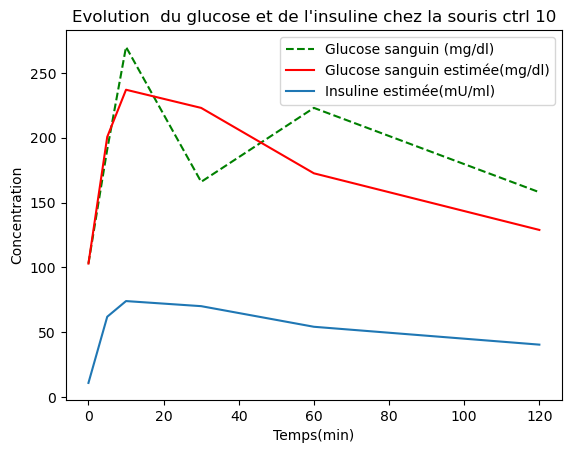

Optimization terminated successfully.
         Current function value: 771.320667
         Iterations: 92
         Function evaluations: 163
Optimization terminated successfully.
         Current function value: 771.320307
         Iterations: 86
         Function evaluations: 161
[2.13383369e-03 7.00031771e-11 1.96715840e-02 3.62000418e+00]


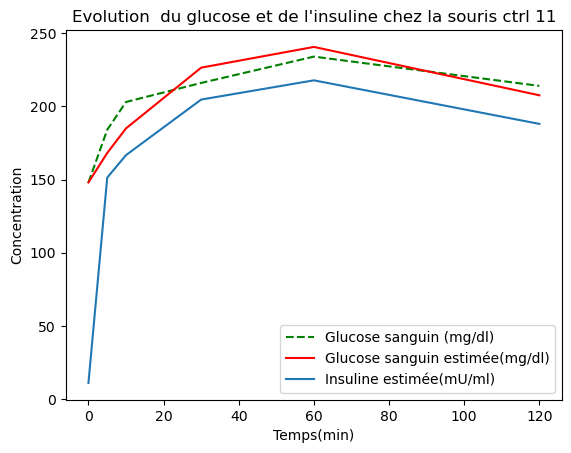

Optimization terminated successfully.
         Current function value: 1456.788657
         Iterations: 76
         Function evaluations: 134
Optimization terminated successfully.
         Current function value: 1456.787448
         Iterations: 50
         Function evaluations: 117
[1.01031139e-02 9.55847790e-11 1.23681517e-01 1.58756338e+00]


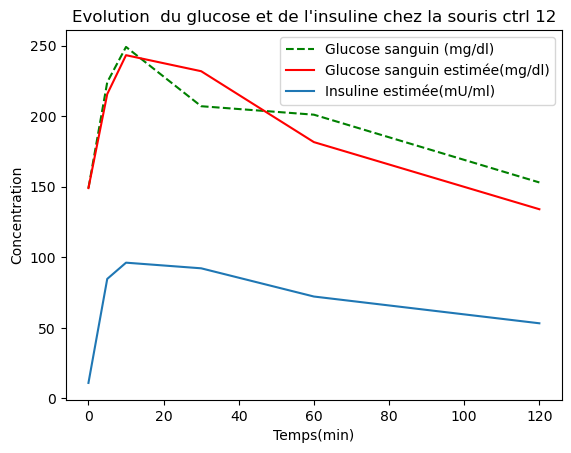

Optimization terminated successfully.
         Current function value: 2476.085126
         Iterations: 90
         Function evaluations: 165
Optimization terminated successfully.
         Current function value: 2476.085108
         Iterations: 97
         Function evaluations: 188
[2.36311350e-02 4.86656678e-12 2.79017949e-01 4.02736224e+00]


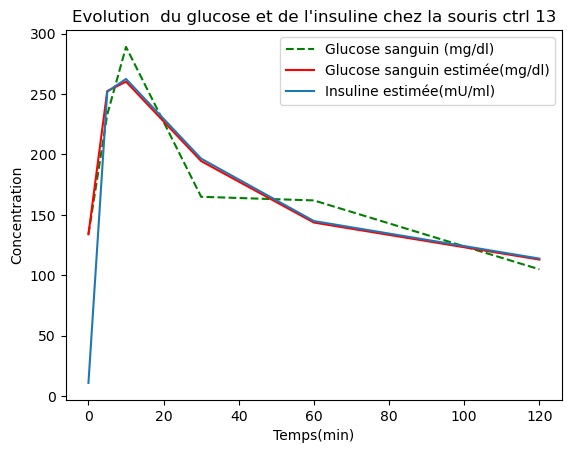

Optimization terminated successfully.
         Current function value: 3835.647885
         Iterations: 118
         Function evaluations: 203
Optimization terminated successfully.
         Current function value: 3835.647875
         Iterations: 20
         Function evaluations: 43
[1.50875704e-02 6.01517283e-11 2.30381738e-01 1.59799682e-03]


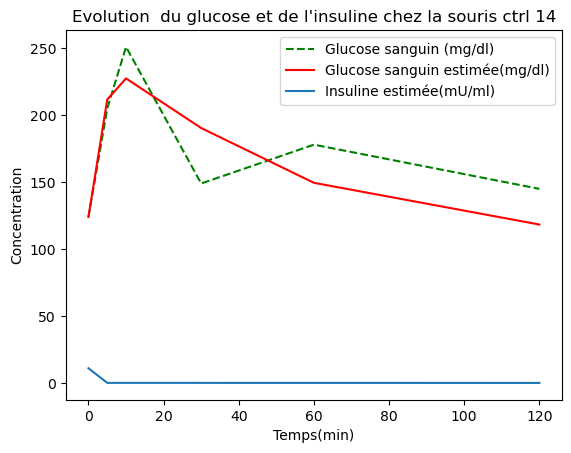

Optimization terminated successfully.
         Current function value: 2725.704099
         Iterations: 82
         Function evaluations: 154
Optimization terminated successfully.
         Current function value: 2725.703886
         Iterations: 89
         Function evaluations: 195
[1.82493867e-02 7.01049021e-12 1.95056565e-01 1.86457767e+00]


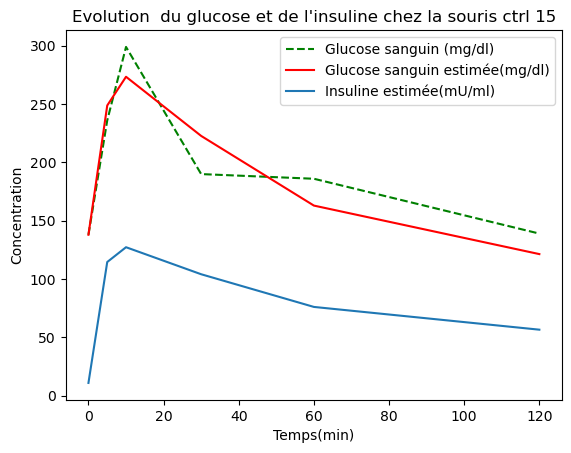

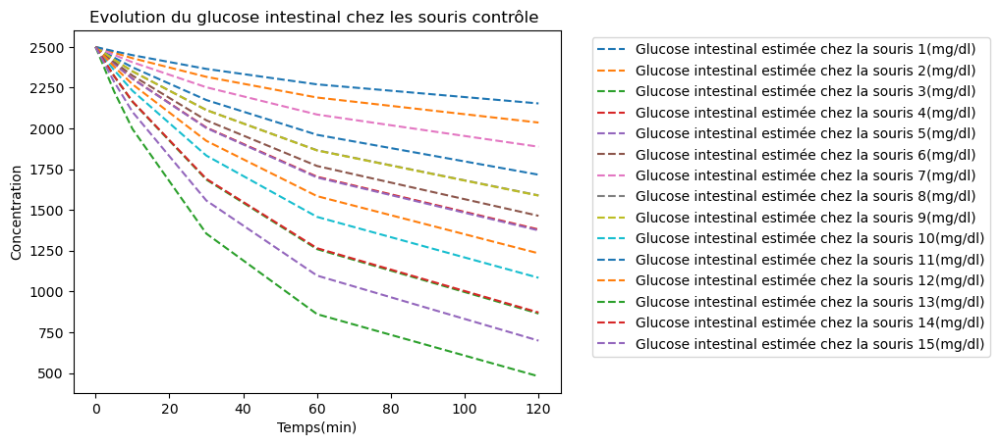

In [234]:
#k et e

G0 = 2500
y0 = [G0, datact[1,0],11]
t = data[0]
a = 0.009
U0 = 1e-2
k = 1e-2

b= 8e-11
c= 0.10
d= 1.7
e= 4
#av_model_db_fix : eq
#distance__av_db_fix : distance
para = [U0,b,c,d]
t = datact[0]

arrayct = np.zeros((17,4))
Pes = []

for i in range(1,16):
    y0 = [G0, datact[i,0],11]
    p1 = fmin(distance_av_ke_fix,para,args=(datact[i],t,y0))
    p = fmin(distance_av_ke_fix,p1,args=(datact[i],t,y0))

    print(p)
    
    arrayct[i-1] = p 
    
    #P = odeint(av_model_ke_fix,y0,t,args=(U0,k,c,e)).T
    Pestim = odeint(av_model_ke_fix,y0,t,args=(p[0],p[1],p[2],p[3])).T

    plt.plot(t,datact[i],'g--',label="Glucose sanguin (mg/dl)")
    plt.plot(t,Pestim[1],'r',label="Glucose sanguin estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline (mg/dl)",marker='x')
    plt.plot(t,Pestim[2],label="Insuline estimée(mU/ml)")


    Pes.append(Pestim[0])
    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Evolution  du glucose et de l'insuline chez la souris ctrl "+str(i))
    plt.savefig("ctrl"+str(i)+".png")
    plt.legend()
    plt.show()
    
for i in range(0,15):
    plt.plot(t,Pes[i],'--',label="Glucose intestinal estimée chez la souris "+str(i+1)+"(mg/dl)")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose intestinal chez les souris contrôle ")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.savefig("ctrlintest"+str(i)+".png")
plt.show()

Optimization terminated successfully.
         Current function value: 9156.762672
         Iterations: 208
         Function evaluations: 484
Optimization terminated successfully.
         Current function value: 9156.762672
         Iterations: 172
         Function evaluations: 440
[6.17097976e-03 1.04467879e-10 3.92818022e-02 1.63574200e+00]


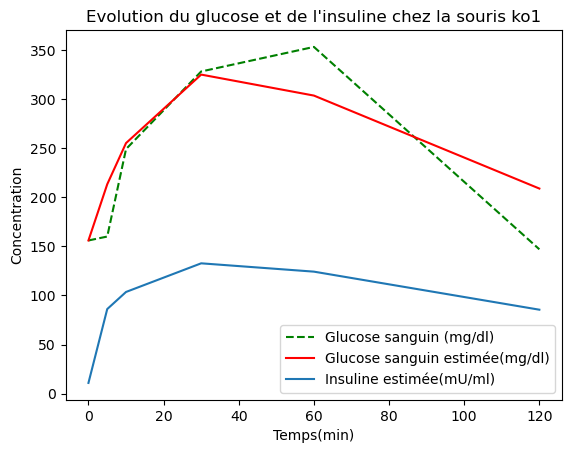

Optimization terminated successfully.
         Current function value: 4476.844101
         Iterations: 67
         Function evaluations: 126
Optimization terminated successfully.
         Current function value: 4476.843107
         Iterations: 59
         Function evaluations: 136
[6.96663355e-03 9.79969499e-11 6.47287890e-02 1.23030392e+00]


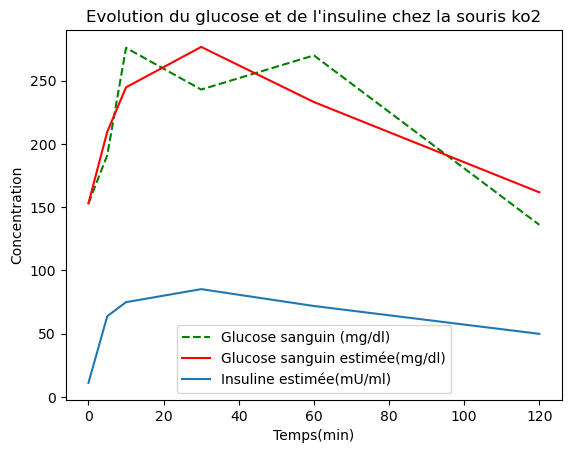

Optimization terminated successfully.
         Current function value: 1014.119982
         Iterations: 79
         Function evaluations: 147
Optimization terminated successfully.
         Current function value: 1014.119610
         Iterations: 47
         Function evaluations: 118
[5.45724081e-03 1.13243119e-10 8.83150379e-02 1.22191552e+00]


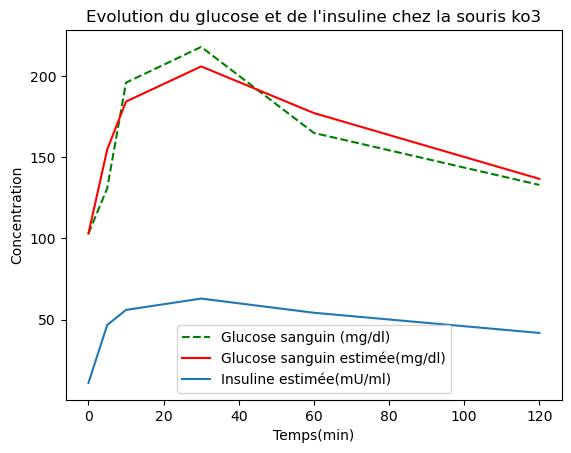

Optimization terminated successfully.
         Current function value: 2334.642839
         Iterations: 86
         Function evaluations: 161
Optimization terminated successfully.
         Current function value: 2334.642449
         Iterations: 117
         Function evaluations: 228
[8.37100091e-03 9.92692618e-15 4.71254177e-02 1.78078130e+00]


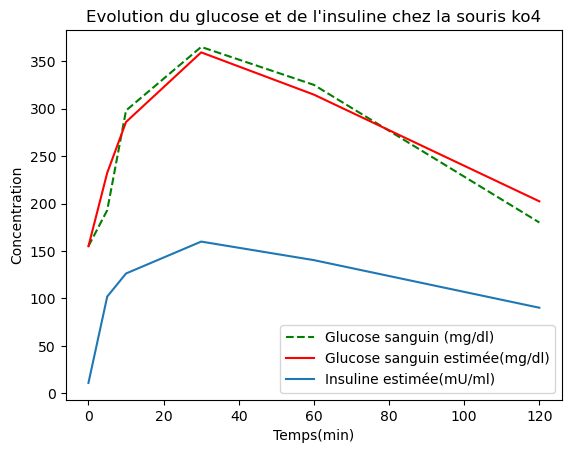

Optimization terminated successfully.
         Current function value: 5981.451114
         Iterations: 78
         Function evaluations: 141
Optimization terminated successfully.
         Current function value: 5981.450648
         Iterations: 59
         Function evaluations: 124
[3.96199312e-03 1.36555770e-10 6.47188442e-02 1.90175667e+00]


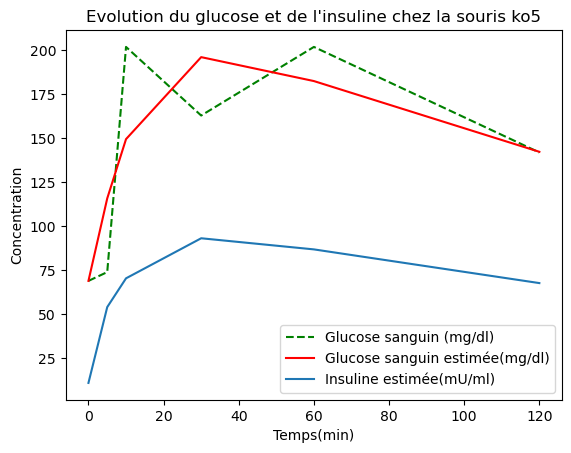

Optimization terminated successfully.
         Current function value: 10680.720259
         Iterations: 73
         Function evaluations: 135
Optimization terminated successfully.
         Current function value: 10680.719141
         Iterations: 49
         Function evaluations: 110
[1.39272419e-02 8.61142408e-11 9.67754679e-02 1.73337721e+00]


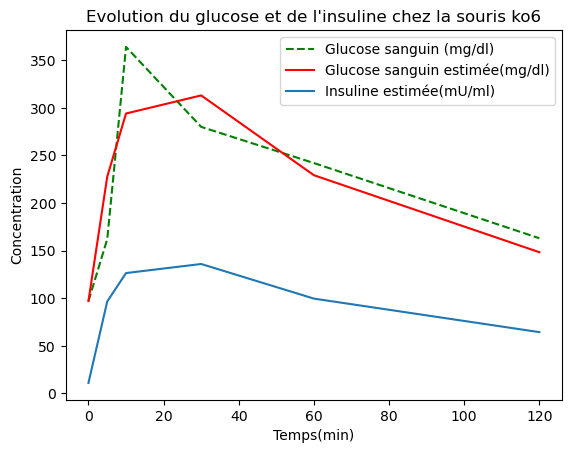

Optimization terminated successfully.
         Current function value: 1203.010111
         Iterations: 80
         Function evaluations: 146
Optimization terminated successfully.
         Current function value: 1203.009771
         Iterations: 60
         Function evaluations: 134
[5.93711752e-03 9.44464351e-11 5.09075275e-02 2.70432046e+00]


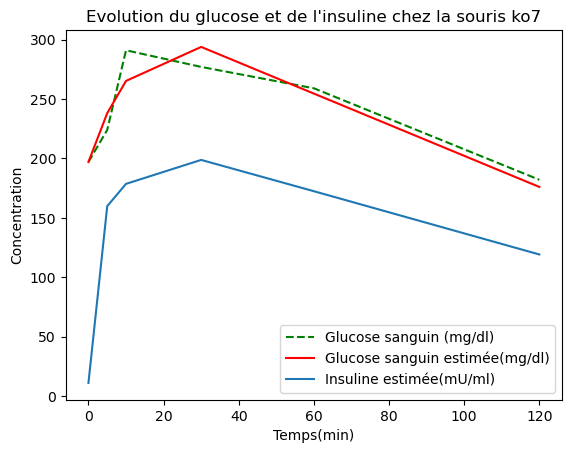

Optimization terminated successfully.
         Current function value: 2718.085378
         Iterations: 79
         Function evaluations: 146
Optimization terminated successfully.
         Current function value: 2718.085309
         Iterations: 61
         Function evaluations: 136
[1.08000650e-02 9.77864234e-11 5.62181339e-02 1.74271608e+00]


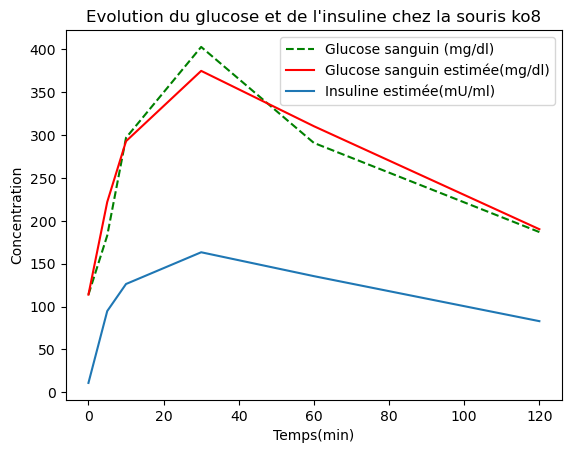

Optimization terminated successfully.
         Current function value: 4348.939105
         Iterations: 68
         Function evaluations: 126
Optimization terminated successfully.
         Current function value: 4348.939016
         Iterations: 88
         Function evaluations: 174
[1.04147787e-02 9.04697307e-11 7.90674804e-02 1.57699290e+00]


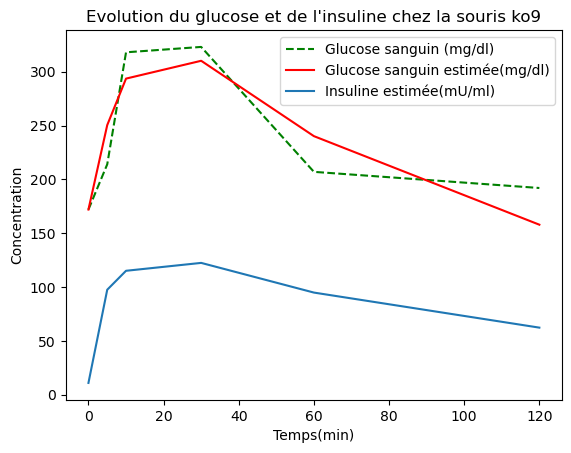

Optimization terminated successfully.
         Current function value: 5448.673130
         Iterations: 66
         Function evaluations: 121
Optimization terminated successfully.
         Current function value: 5448.672178
         Iterations: 68
         Function evaluations: 140
[1.21698149e-02 6.90438375e-11 1.42731319e-01 1.25894432e+00]


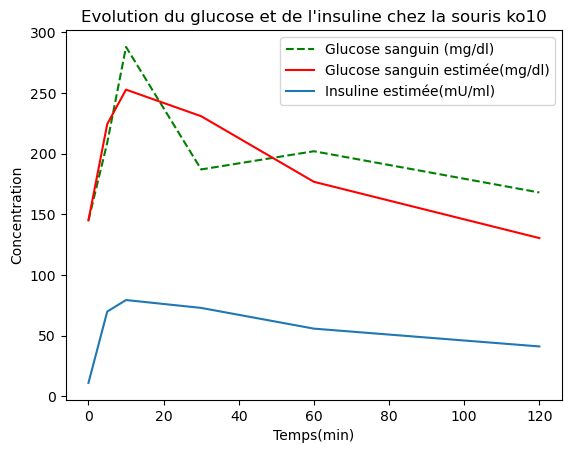

Optimization terminated successfully.
         Current function value: 12862.060591
         Iterations: 99
         Function evaluations: 181
Optimization terminated successfully.
         Current function value: 12862.060582
         Iterations: 64
         Function evaluations: 120
[2.43748475e-02 4.71652477e-12 2.01016255e-01 8.25874620e-02]


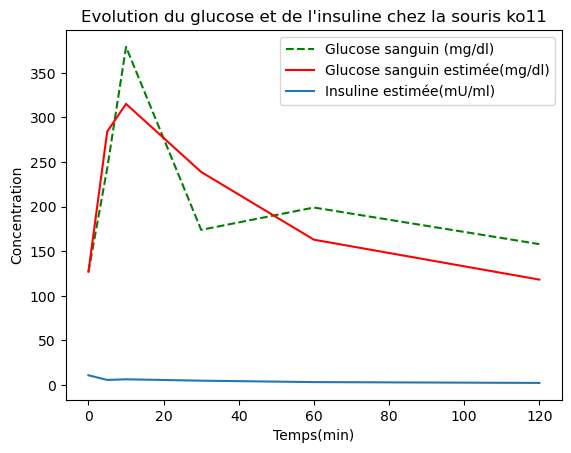

Optimization terminated successfully.
         Current function value: 4403.469290
         Iterations: 96
         Function evaluations: 177
Optimization terminated successfully.
         Current function value: 4403.469151
         Iterations: 56
         Function evaluations: 124
[1.55556037e-02 7.43177480e-12 1.92096128e-01 2.35200596e+00]


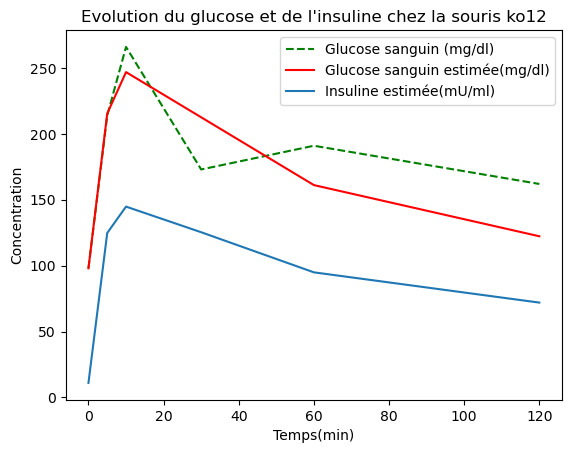

Optimization terminated successfully.
         Current function value: 7105.000083
         Iterations: 218
         Function evaluations: 498
[1.78786894e-02 7.01530293e-11 1.65958305e-01 1.05156159e+00]


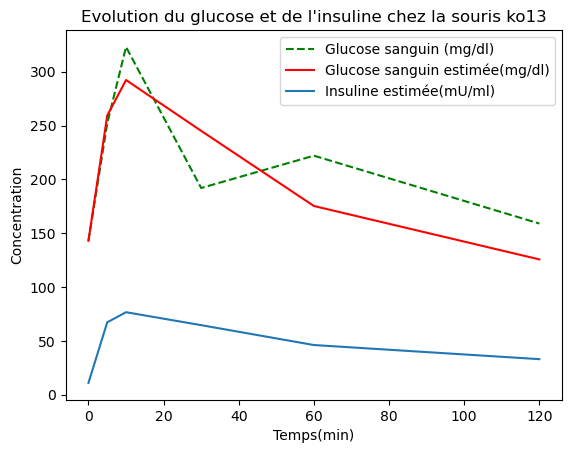

Optimization terminated successfully.
         Current function value: 2386.623515
         Iterations: 80
         Function evaluations: 147
Optimization terminated successfully.
         Current function value: 2386.623515
         Iterations: 42
         Function evaluations: 105
[1.34174858e-02 8.73140352e-11 1.43299967e-01 1.15189284e+00]


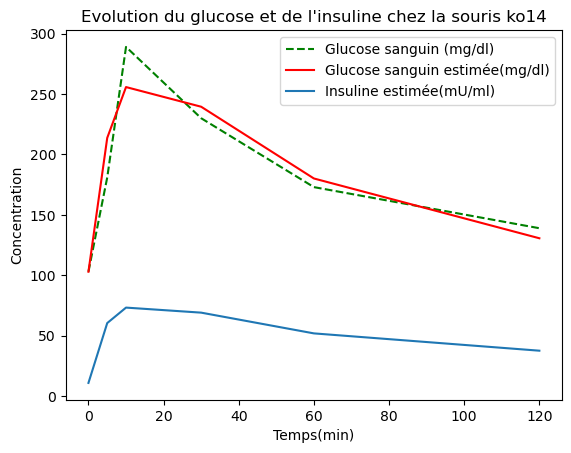

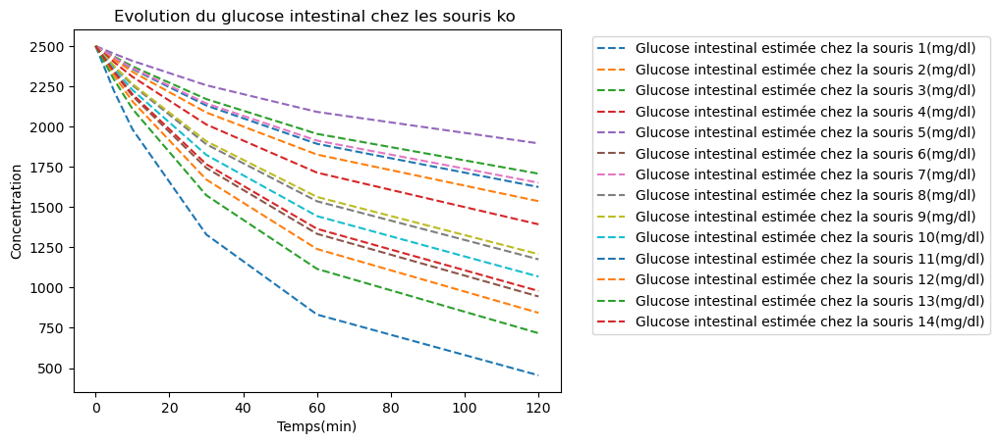

In [236]:
t = datako[0]
arrayko = np.zeros((16,4))
tt = np.linspace(0,150,100)
Pes2 = []
for i in range(1,15):
    y0 = [G0, datako[i,0],11]
    p1 = fmin(distance_av_ke_fix,para,args=(datako[i],t,y0))
    p = fmin(distance_av_ke_fix,p1,args=(datako[i],t,y0))
    print(p)
    
    arrayko[i-1] = p
    
    #P = odeint(av_model_ke_fix,y0,t,args=(U0,k,c,e)).T
    Pestim = odeint(av_model_ke_fix,y0,t,args=(p[0],p[1],p[2],p[3])).T

    plt.plot(t,datako[i],'g--',label="Glucose sanguin (mg/dl)")
    plt.plot(t,Pestim[1],'r',label="Glucose sanguin estimée(mg/dl)")
    #plt.plot(t,P[2],label="Insuline (mg/dl)",marker='x')
    plt.plot(t,Pestim[2],label="Insuline estimée(mU/ml)")

    Pes2.append(Pestim[0])
    plt.xlabel('Temps(min)')
    plt.ylabel('Concentration')
    plt.title("Evolution du glucose et de l'insuline chez la souris ko"+str(i))
    plt.legend()
    plt.savefig("ko"+str(i)+".png")
    plt.show()

for i in range(0,14):
    plt.plot(t,Pes2[i],'--',label="Glucose intestinal estimée chez la souris "+str(i+1)+"(mg/dl)")
plt.xlabel('Temps(min)')
plt.ylabel('Concentration')
plt.title("Evolution du glucose intestinal chez les souris ko ")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.savefig("kointest"+str(i)+".png")
plt.show()

In [227]:
art = arrayct.T

for i in range(4):
    arrayct[15,i] = art[i].mean()
    arrayct[16,i] = art[i].std()
index1 = ["U0","b","c","d"]
indexctrl = ["souris 1","souris 2","souris 3","souris 4","souris 5","souris 6","souris 7","souris 8","souris 9","souris 10","souris 11","souris 12","souris 13","souris 14","souris 15","moyenne","écart-type"]
df1 = pd.DataFrame(arrayct, index = indexctrl,columns = index1)

df1

,U0,b,c,d
souris 1,0.005382,1.245346e-10,0.086921,2.278035
souris 2,0.002936,1.206130e-10,0.074005,2.397574
souris 3,0.015193,1.040874e-18,0.294150,0.000388
souris 4,0.008499,1.231959e-10,0.054966,1.524525
souris 5,0.008558,9.223762e-11,0.038872,1.764050
souris 6,0.007656,9.521267e-11,0.059551,2.116838
souris 7,0.004018,1.119584e-10,0.060724,3.111944
souris 8,0.006480,1.142483e-10,0.073586,1.940489
souris 9,0.006495,1.818931e-16,0.038864,3.424940
souris 10,0.011958,7.335578e-11,0.148853,1.255827


In [264]:
art2 = arrayko.T

for i in range(4):
    arrayko[14,i] = art2[i].mean()
    arrayko[15,i] = art2[i].std()
index1 = ["U0","b","c","d"]
indexko = ["souris 1","souris 2","souris 3","souris 4","souris 5","souris 6","souris 7","souris 8","souris 9","souris 10","souris 11","souris 12","souris 13","souris 14","moyenne","écart-type"]
df2 = pd.DataFrame(arrayko, index = indexko,columns = index1)

df2

,U0,b,c,d
souris 1,0.006171,1.044679e-10,0.039282,1.635742
souris 2,0.006967,9.799695e-11,0.064729,1.230304
souris 3,0.005457,1.132431e-10,0.088315,1.221916
souris 4,0.008371,9.926926e-15,0.047125,1.780781
souris 5,0.003962,1.365558e-10,0.064719,1.901757
souris 6,0.013927,8.611424e-11,0.096775,1.733377
souris 7,0.005937,9.444644e-11,0.050908,2.704320
souris 8,0.010800,9.778642e-11,0.056218,1.742716
souris 9,0.010415,9.046973e-11,0.079067,1.576993
souris 10,0.012170,6.904384e-11,0.142731,1.258944


In [268]:
arrayct_stud = arrayct[:15,:].T
arrayko_stud = arrayko[:14,:].T


In [84]:
arrayct_tr

array([[1.50155129e-03, 3.07084967e-04, 8.03143473e-04, 9.10364144e-04,
        1.54745963e-03, 1.15188483e-03, 8.58219354e-04, 1.07732274e-03,
        1.44717961e-03, 1.19823862e-03, 8.27597561e-04, 1.06141181e-03,
        1.44937697e-03, 1.17842296e-03, 1.25898322e-03],
       [4.68416547e-03, 7.95588426e-03, 1.96005082e-02, 7.60370762e-03,
        9.82330823e-03, 1.15002420e-02, 1.34910443e-02, 1.29401475e-02,
        9.85167686e-03, 7.81646157e-03, 7.41433021e-03, 1.56910105e-02,
        2.31201306e-02, 1.01748829e-02, 1.97827517e-02],
       [3.68453695e-02, 8.18013640e-03, 2.67207807e-02, 8.26224452e-03,
        1.06150479e-02, 1.20353626e-02, 1.40926939e-02, 1.36897232e-02,
        1.07769559e-02, 1.99083127e-02, 8.07757074e-03, 1.58779861e-02,
        2.99315909e-02, 2.69029277e-02, 2.00626897e-02],
       [6.48082484e-07, 1.48792754e+01, 3.52182398e-08, 1.01665990e+01,
        1.00711355e+01, 1.63724029e+01, 3.21043466e+01, 9.28761552e+00,
        7.50261365e+00, 3.62184647e-0

In [101]:
arrayct_tr = arrayct.T
arrayko_tr = arrayko.T

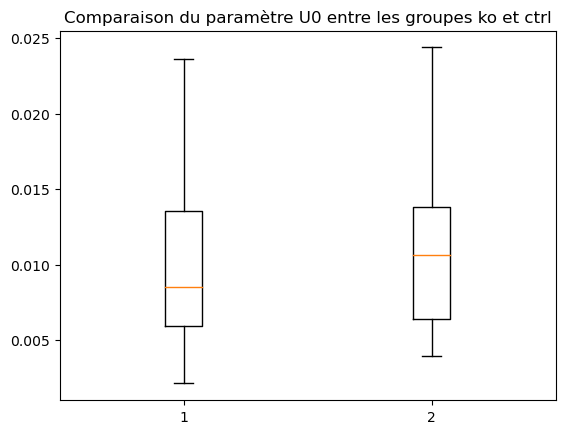

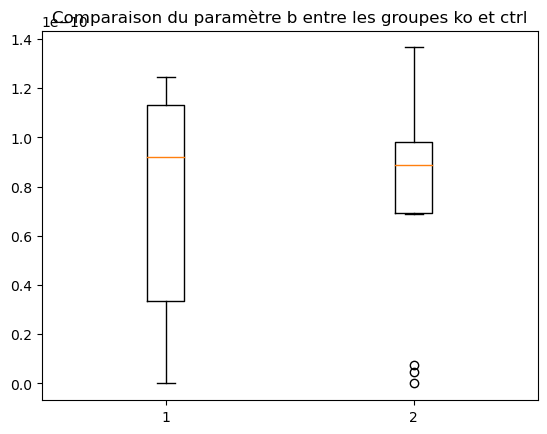

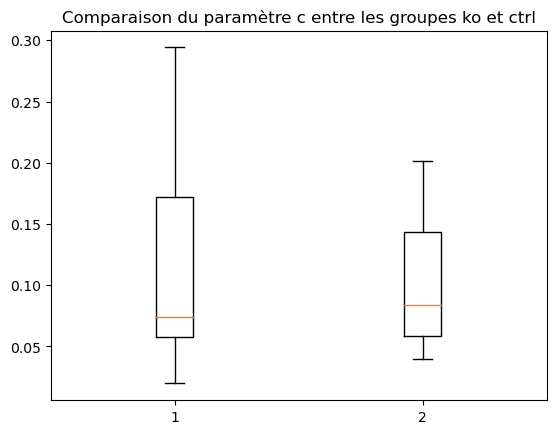

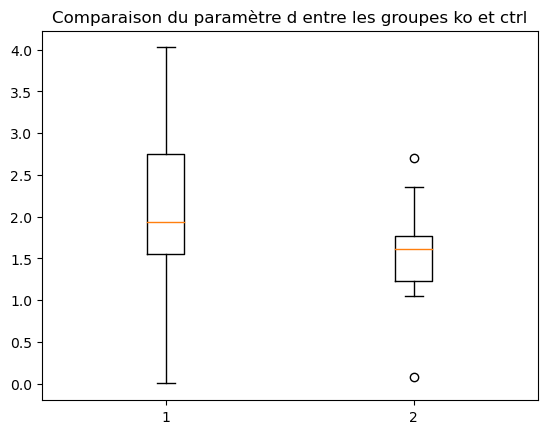

In [271]:
lp = ['U0','b','c','d']
for i in range(4):
    fig = plt.figure()
    plt.boxplot([arrayct_stud[i],arrayko_stud[i]])
    plt.title("Comparaison du paramètre "+lp[i]+" entre les groupes ko et ctrl")
    plt.savefig("statplot"+str(i)+".png")
    plt.show()

In [99]:
test_u0 = ttest_ind(arrayct_tr[0],arrayko_tr[0],equal_var=False)
test_k = ttest_ind(arrayct_tr[1],arrayko_tr[1],equal_var=False)
test_c = ttest_ind(arrayct_tr[2],arrayko_tr[2],equal_var=False)
test_e = ttest_ind(arrayct_tr[3],arrayko_tr[3],equal_var=False)

print(test_u0)
print(test_k)
print(test_c)
print(test_e)

Ttest_indResult(statistic=-0.8467829981733116, pvalue=0.40872896992937524)
Ttest_indResult(statistic=-0.6276600792264755, pvalue=0.5359340331674016)
Ttest_indResult(statistic=0.3200884337257978, pvalue=0.7513729550604837)
Ttest_indResult(statistic=0.28338878984264165, pvalue=0.7791322396379398)


2. discuter de la pertinence de ces paramètres au vu du nombre de points de données


En vue du nombre de points par souris, je n'arrive pas a observer des paramètres qui se distingueraient entre les groupes KO et ct.  

3. en déduire un impact (ou pas) physiologique du KO


In [305]:
from scipy import stats
shapc = np.zeros((8,2))

for i in range(0,4):
    s1 = stats.shapiro(arrayct_stud[i])
    s2 = stats.shapiro(arrayko_stud[i])
    shapc[2*i,0] = s1.statistic
    shapc[2*i,1] = s1.pvalue
    shapc[2*i+1,0] = s2.statistic
    shapc[2*i+1,1] = s2.pvalue
    

index1 = ["U0 ctrl","U0 ko","b ctrl","b ko","c ctrl","c ko","d ctrl", "d ko"]
indexctrl = ["Shapiro StatVal","Shapiro P-Val"]
df1 = pd.DataFrame(shapc, index = index1,columns = indexctrl)

df1

,Shapiro StatVal,Shapiro P-Val
U0 ctrl,0.929921,0.272138
U0 ko,0.933277,0.338971
b ctrl,0.844987,0.014760
b ko,0.853983,0.025167
c ctrl,0.857836,0.022463
c ko,0.883284,0.064738
d ctrl,0.951352,0.546001
d ko,0.946323,0.505211


In [312]:
baru = stats.bartlett(arrayct_stud[0],arrayko_stud[0])
bark = stats.bartlett(arrayct_stud[3],arrayko_stud[3])
levb = stats.levene(arrayct_stud[1],arrayko_stud[1])
levc = stats.levene(arrayct_stud[2],arrayko_stud[2])

print(baru)
print(bark)
print(levb)
print(levc)

tab=np.zeros((4,4))
tab[0,0] = baru.statistic
tab[0,1] = baru.pvalue
tab[0,2] = None
tab[0,3] = None
tab[3,0] = bark.statistic
tab[3,1] = bark.pvalue
tab[3,2] = None
tab[3,3] = None
tab[1,0] = None
tab[1,1] = None
tab[1,2] = levb.statistic
tab[1,3] = levb.pvalue
tab[2,0] = None
tab[2,1] = None
tab[2,2] = levc.statistic
tab[2,3] = levc.pvalue

index1 = ["U0","b","c","d"]
indexctrl = ["Bartlett StatVal","Bartlett P-Val","Levene StatVal","Levene P-Val"]
df1 = pd.DataFrame(tab, index = index1,columns = indexctrl)

df1

BartlettResult(statistic=0.06098901761916622, pvalue=0.8049395317002709)
BartlettResult(statistic=4.754128672563727, pvalue=0.029228087178894375)
LeveneResult(statistic=0.5015177626130376, pvalue=0.4849033576644255)
LeveneResult(statistic=1.0730015127813088, pvalue=0.3094573666953857)


,Bartlett StatVal,Bartlett P-Val,Levene StatVal,Levene P-Val
U0,0.060989,0.804940,NaN,NaN
b,NaN,NaN,0.501518,0.484903
c,NaN,NaN,1.073002,0.309457
d,4.754129,0.029228,NaN,NaN


In [313]:
test_u = ttest_ind(arrayct_stud[0],arrayko_stud[0])
print(test_u)

test_b = stats.mannwhitneyu(arrayct_stud[1],arrayko_stud[1])
print(test_b)
test_c = stats.mannwhitneyu(arrayct_stud[2],arrayko_stud[2])
print(test_c)
test_d =stats.mannwhitneyu(arrayct_stud[3],arrayko_stud[3])
print(test_d)

tab=np.zeros((4,4))
tab[0,0] = None
tab[0,1] = None
tab[0,2] = test_u.statistic
tab[0,3] = test_u.pvalue
tab[1,0] = test_b.statistic
tab[1,1] = test_b.pvalue
tab[1,2] = None
tab[1,3] = None
tab[2,0] = test_c.statistic
tab[2,1] = test_c.pvalue
tab[2,2] = None
tab[2,3] = None
tab[3,0] = test_d.statistic
tab[3,1] = test_d.pvalue
tab[3,2] = None
tab[3,3] = None



index1 = ["U0","b","c","d"]
indexctrl = ["Mann-Whitney-Wilcoxon StatVal","Mann-Whitney-Wilcoxon P-Val","Student-T StatVal","Student-T P-Val"]
df1 = pd.DataFrame(tab, index = index1,columns = indexctrl)

df1


Ttest_indResult(statistic=-0.6157014635701383, pvalue=0.543247385874654)
MannwhitneyuResult(statistic=106.0, pvalue=0.9825901131969854)
MannwhitneyuResult(statistic=105.0, pvalue=1.0)
MannwhitneyuResult(statistic=144.0, pvalue=0.09290328709689505)


,Mann-Whitney-Wilcoxon StatVal,Mann-Whitney-Wilcoxon P-Val,Student-T StatVal,Student-T P-Val
U0,NaN,NaN,-0.615701,0.543247
b,106.0,0.982590,NaN,NaN
c,105.0,1.000000,NaN,NaN
d,144.0,0.092903,NaN,NaN


Pour cette partie, il faudra donner les paramètres efficaces souris par souris et faire une comparaison (avec des tests stats ?) entre les deux groupes et donner une conclusion biologique. On entend par la d’où vient la différence exprimée en terme physiologique.
